|축제 지역|행정동코드|
|---|---|
|대전|3020055000|
|부산|2635052000|
|강릉(스피드 스케이팅장)|5115057200|
|강릉(경포호수공원)|5115058000|
|임실|4575034000|
|서울|1156054000|

## 구글 드라이브 마운트

In [1]:
from google.colab import drive
import os

drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/BigContest')

Mounted at /content/drive


## 라이브러리

In [2]:
import dask.dataframe as dd
import time
import pandas as pd
import numpy as np
from tqdm import tqdm
from datetime import datetime

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

import seaborn as sns

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


## 데이터 불러오기

In [3]:
od = dd.read_csv('data/OD_all.csv', assume_missing = True, header = 0)
stay = dd.read_csv('data/stay_all.csv', assume_missing = True, header = 0)
stay = stay.drop(columns = 'Unnamed: 0')

In [7]:
print(od.shape[0].compute())
print(stay.shape[0].compute())

158838955
169352478


In [ ]:
od.head()

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts
0,1.130564e+09,1.130560e+09,20230901.0,12:00,13:00,1.0,3.0,0.0,1.0,1.0,10869.0,58.0,7.0
1,2.714072e+09,2.714073e+09,20230901.0,12:00,12:00,1.0,4.0,0.0,0.0,0.0,2018.0,4.0,16.0
2,3.017056e+09,3.017059e+09,20230901.0,18:00,18:00,1.0,2.0,0.0,4.0,0.0,14070.0,39.0,8.0
3,2.917067e+09,2.917059e+09,20230901.0,19:00,19:00,0.0,4.0,0.0,0.0,0.0,2738.0,9.0,22.0
4,2.714058e+09,4.729025e+09,20230901.0,21:00,22:00,1.0,1.0,2.0,3.0,0.0,43707.0,85.0,10.0


In [ ]:
# od
print(f"origin_hdong_cd: {od.origin_hdong_cd.dtype}")
print(f"dest_hdong_cd: {od.dest_hdong_cd.dtype}")
print(f"date: {od.date.dtype}")
print(f"start_time: {od.start_time.dtype}")
print(f"end_time: {od.end_time.dtype}")
print(f"gender: {od.gender.dtype}")
print(f"age: {od.age.dtype}")
print(f"modal: {od.modal.dtype}")
print(f"origin_purpose: {od.origin_purpose.dtype}")
print(f"dest_purpose: {od.dest_purpose.dtype}")
print(f"od_dist_avg: {od.od_dist_avg.dtype}")
print(f"od_duration_avg: {od.od_duration_avg.dtype}")
print(f"od_cnts: {od.od_cnts.dtype}")

origin_hdong_cd: float64
dest_hdong_cd: float64
date: float64
start_time: string
end_time: string
gender: float64
age: float64
modal: float64
origin_purpose: float64
dest_purpose: float64
od_dist_avg: float64
od_duration_avg: float64
od_cnts: float64


In [ ]:
od.origin_hdong_cd = od.origin_hdong_cd.astype('int').astype('string')
od.dest_hdong_cd = od.dest_hdong_cd.astype('int').astype('string')
od.date = od.date.astype('int')
od.start_time = od.start_time.str[:2].astype('int')
od.end_time = od.end_time.str[:2].astype('int')
od.gender = od.gender.astype('int')
od.age = od.age.astype('int')

In [ ]:
# 이동수단 코드 매핑
modal_cd = {0: '차량',
            1: '시내버스',
            2: '지하철',
            3: '도보',
            4: '기타',
            5: '철도',
            6: '시외고속버스',
            7: '항공기',
            'nan': '-'}
od.modal = od['modal'].map(modal_cd)

In [ ]:
# 목적 코드 매핑
purpose_cd = {0: '귀가',
              1: '업무',
              2: '학업',
              3: '쇼핑여가',
              4: '기타',
              5: '여행'}
od.origin_purpose = od['origin_purpose'].map(purpose_cd)
od.dest_purpose = od['dest_purpose'].map(purpose_cd)
stay.purpose = stay['purpose'].map(purpose_cd)

In [ ]:
stay.hdong_cd = stay.hdong_cd.astype('int').astype('string')
stay.date = stay.date.astype('int')
stay.time = stay.time.str[:2].astype('int')
stay.gender = stay.gender.astype('int').astype('string')
stay.stay_cnts = stay.stay_cnts.astype('int')

In [ ]:
stay.head()

,hdong_cd,date,time,gender,age,purpose,stay_cnts
0,2811054000,20230901,13,1,6.0,귀가,754
1,4831055000,20230901,21,0,4.0,귀가,878
2,4117360000,20230901,12,1,1.0,귀가,904
3,1156054000,20230901,14,0,4.0,업무,13729
4,4713059000,20230901,19,0,4.0,귀가,946


## 함수

In [ ]:
# 귀가 데이터 가져오기
def get_home_data(od, origin_hdong_cd):
	od_h = od[od.origin_hdong_cd == origin_hdong_cd].compute()
	od_h = od_h[(od_h.origin_purpose.isin(['기타' ,'쇼핑여가', '여행'])) & (od_h.dest_purpose == '귀가')]
	od_h['speed'] = (od_h.od_dist_avg * 60)/(od_h.od_duration_avg * 1000)
	od_h.speed = od_h.speed.round(2)
	return od_h

In [ ]:
# 상관계수 히트맵
def get_corr_heatmap(od):
	num_features = ['start_time', 'end_time', 'age', 'od_dist_avg', 'od_duration_avg', 'speed']
	od = od[num_features]
	plt.figure(figsize = (15, 15))
	sns.heatmap(data = od.corr(), annot = True, fmt = '.2f', linewidths = .5, cmap = 'Blues')

In [ ]:
# shap value 가져오기
def get_shap_values(od):
	X = od.drop(columns = ['date', 'origin_hdong_cd', 'dest_hdong_cd', 'modal', 'origin_purpose', 'dest_purpose', 'od_cnts', 'speed'])
	y = od.speed

	model = xgboost.XGBRegressor().fit(X, y)
	explaier = shap.Explainer(model)
	shap_values = explainer(X)
	return shap_values

In [ ]:
def add_isFestival(od, f_dates):
  date_to_festival = {}
  od.date = od.date.astype('string')
  unique_dates = od.date.unique()
  for date in unique_dates:
    date_obj = datetime.strptime(date, '%Y%m%d')
    if date in f_dates:
      date_to_festival[date] = True
    else:
      date_to_festival[date] = False
  od['isFestival'] = od['date'].map(date_to_festival)
  return od

In [ ]:
def add_isWeekend(od):
  od.date = od.date.astype('string')
  unique_dates = od.date.unique()
  date_to_weekend = {}
  for date in unique_dates:
    date_obj = datetime.strptime(date, '%Y%m%d')
    date_to_weekend[date] = date_obj.weekday() >= 5
  od['isWeekend'] = od['date'].map(date_to_weekend)
  return od


## 데이터 개요 파악

### OD

#### 데이터 구조 확인

In [ ]:
print(f"OD shape: ({od.shape[0].compute(), od.shape[1]})")

OD shape: ((158838955, 13))


#### 데이터 타입 파악

In [ ]:
print(f"origin_hdong_cd type: {od.origin_hdong_cd.dtype}")
print(f"dest_hdong_cd type: {od.dest_hdong_cd.dtype}")
print(f"date type: {od.date.dtype}")
print(f"start_time type: {od.start_time.dtype}")
print(f"end_time type: {od.end_time.dtype}")
print(f"gender type: {od.gender.dtype}")
print(f"age type: {od.age.dtype}")
print(f"modal type: {od.modal.dtype}")
print(f"origin_purpose type: {od.origin_purpose.dtype}")
print(f"dest_purpose type: {od.dest_purpose.dtype}")
print(f"od_dist_avg type: {od.od_dist_avg.dtype}")
print(f"od_duration_avg type: {od.od_duration_avg.dtype}")
print(f"od_cnts type: {od.od_cnts.dtype}")

origin_hdong_cd type: float64
dest_hdong_cd type: float64
date type: float64
start_time type: string
end_time type: string
gender type: float64
age type: float64
modal type: string
origin_purpose type: string
dest_purpose type: string
od_dist_avg type: float64
od_duration_avg type: float64
od_cnts type: float64


데이터 정의서 속 데이터 타입과 다른 부분이 존재.

#### 빈도 확인

In [ ]:
od.columns

Index(['origin_hdong_cd', 'dest_hdong_cd', 'date', 'start_time', 'end_time',
       'gender', 'age', 'modal', 'origin_purpose', 'dest_purpose',
       'od_dist_avg', 'od_duration_avg', 'od_cnts'],
      dtype='object')

##### origin_hdong_cd
---
* 출발지 행정동코드(10자리): 시도(2) + 시군구(3) + 읍면동(3) + 리(2)
* 정의서 데이터 타입: string

In [ ]:
od.origin_hdong_cd = od.origin_hdong_cd.astype('int').astype('string')
od.origin_hdong_cd.value_counts().compute()

,count
origin_hdong_cd,
4127357000,417143
1168064000,355626
2635052000,323872
1156054000,320280
4513069000,304117
...,...
5178036000,63
2872033000,61
5182034000,42


##### dest_hdong_cd
---
* 도착지 행정동코드(10자리): 시도(2) + 시군구(3) + 읍면동(3) + 리(2)
* 정의서 데이터 타입: string

In [ ]:
od.dest_hdong_cd = od.dest_hdong_cd.astype('int').astype('string')
od.dest_hdong_cd.value_counts().compute()

,count
dest_hdong_cd,
1171056600,722577
2635051000,655128
4139058900,465844
2920063700,420524
2641061000,393765
...,...
4681039000,8
5178036000,2
4671033500,1


##### date
---
* 날짜
* 형식: YYYYmmdd
* 정의서 데이터 타입: string

In [ ]:
od.date = od.date.astype('int').astype('string')
od.date.value_counts().compute()

,count
date,
20230927,3821508
20230908,3767366
20230922,3734787
20230901,3726136
20230909,3709417
20231006,3703618
20230929,3696779
20231013,3696025
20230923,3689888


##### start_time
* 출발 시각
* 범위: 08 ~ 23시
* 정의서 데이터 타입: string

In [ ]:
od.start_time = od.start_time.str[:2]
od.start_time.value_counts().compute()

,count
start_time,
17,13686280
18,13305478
08,13014506
16,12601180
15,11403397
12,11323928
13,11031990
14,10721151
19,10185088


##### end_time
* 도착 시각
* 범위: 08 ~ 23시
* 정의서 데이터 타입: string

In [ ]:
od.end_time = od.end_time.str[:2]

In [ ]:
od.end_time.value_counts().compute()

,count
end_time,
18,14791687
17,13196158
19,12336828
16,11774728
13,11087333
15,11006926
12,10950030
14,10608131
20,9944801


##### gender
* 성별
* 구분: 남성(0), 여성(1)
* 정의서 데이터 타입: int

In [ ]:
od.gender = od.gender.astype('int')
od.gender.value_counts().compute()

,count
gender,
1,81482524
0,77356431


##### age
* 나이대
* 구분<br>

|코드|설명|
|---|---|
|0|9세 이하|
|1|10대|
|2|20대|
|3|30대|
|4|40대|
|5|50대|
|6|60대|
|7|70대|
|8|80대 이상|

* 정의서 데이터 타입: int




In [ ]:
od.age = od.age.astype('int')
od.age.value_counts().compute()

,count
age,
3,36647297
2,31161376
4,27474537
1,23879779
5,19911841
0,12232235
6,5427386
7,1875673
8,228831


##### modal
* 주 이동수단 코드
* 정의서 데이터 타입: int

|코드|이동수단|
|---|---|
|0|차량|
|1|시내버스|
|2|지하철|
|3|도보|
|4|기타|
|5|철도|
|6|시외고속버스|
|7|항공기|


In [ ]:
od.modal.unique().compute()
#od[od.modal != 'NaN'].modal.value_counts().compute()

,modal
0,0.0
1,2.0
2,1.0
3,4.0
4,3.0
5,5.0
6,7.0
7,NaN


##### origin_purpose
* 출발지 체류목적 코드
* 정의서 데이터 타입: int

|코드|체류 목적|
|---|---|
|0|귀가|
|1|업무|
|2|학업|
|3|쇼핑여가|
|4|기타|
|5|여행|


In [ ]:
od.origin_purpose.astype('int')
od.origin_purpose.value_counts().compute()

,count
origin_purpose,
귀가,83362112
기타,29326679
업무,18524023
여행,13378816
쇼핑여가,10493813
학업,3665670


##### dest_purpose
* 도착지 체류목적 코드
* 정의서 데이터 타입: int

In [ ]:
od.dest_purpose.value_counts().compute()

,count
dest_purpose,
귀가,86496409
기타,30865137
업무,14305606
여행,14252490
쇼핑여가,9866838
학업,3052475


##### od_dist_avg
* 평균 이동거리(m)
* 정의서 데이터 타입: int

In [ ]:
od.od_dist_avg.value_counts().compute()

,count
od_dist_avg,
639.0,23267
631.0,23107
672.0,23066
629.0,23060
641.0,23039
...,...
777473.0,1
777474.0,1
777475.0,1


##### od_duration_avg
* 평균 이동시간(min)
* 정의서 데이터 타입: int

In [ ]:
od.od_duration_avg.value_counts().compute()

,count
od_duration_avg,
3.0,4842309
4.0,4659486
5.0,4356450
10.0,4213933
9.0,4037809
...,...
476.0,537
477.0,529
479.0,525


##### od_cnts
* 이동 인원
* 정의서 데이터 타입: int

#### 결측치

In [ ]:
od.isna().sum().compute()

,0
origin_hdong_cd,0
dest_hdong_cd,0
date,0
start_time,0
end_time,0
gender,0
age,0
modal,1713
origin_purpose,87842
dest_purpose,0


### stay

#### 데이터 구조 확인

In [ ]:
print(f"stay shape: ({stay.shape[0].compute(), stay.shape[1]})")

stay shape: ((169352478, 7))


#### 데이터 타입 확인

In [ ]:
print(f"hdong_cd type: {stay.hdong_cd.dtype}")
print(f"date type: {stay.date.dtype}")
print(f"time type: {stay.time.dtype}")
print(f"gender type: {stay.gender.dtype}")
print(f"age type: {stay.age.dtype}")
print(f"purpose type: {stay.purpose.dtype}")
print(f"stay_cnts type: {stay.stay_cnts.dtype}")

hdong_cd type: float64
date type: float64
time type: string
gender type: float64
age type: float64
purpose type: string
stay_cnts type: float64


#### 변수 파악

In [ ]:
stay.columns

Index(['hdong_cd', 'date', 'time', 'gender', 'age', 'purpose', 'stay_cnts'], dtype='object')

#### 빈도 확인

In [ ]:
stay.columns

Index(['hdong_cd', 'date', 'time', 'gender', 'age', 'purpose', 'stay_cnts'], dtype='object')

##### hdong_cd

In [ ]:
# 행정동별 데이터 건수 확인
stay.hdong_cd = stay.hdong_cd.astype('int').astype('string')
stay.hdong_cd.value_counts().compute()

,count
hdong_cd,
1141058500,65128
1156054000,64954
2635052000,64422
1111061500,64416
1168064000,64391
...,...
5178036000,4357
5178033000,2858
5182034000,2738


* 1141058500: 서울특별시 서대문구 신촌동
* 1156054000: 서울특별시 영등포구 여의동
* 2635052000: 부산광역시 해운대구 우제2동
* 1111061500: 서울특별시 종로구 종로1, 2, 3, 4가동
* 1168064000: 서울특별시 강남구 역삼1동

In [ ]:
# 행정동별 체류인구 합계 확인
stay.groupby('hdong_cd').stay_cnts.sum().compute()

,stay_cnts
hdong_cd,
1111051500,18691885.0
1111053000,16347500.0
1111054000,6759014.0
1111055000,10142680.0
1111056000,11542919.0
...,...
5183031000,3920396.0
5183032000,3927908.0
5183033000,2417309.0


## 기초 통계 정보

### OD

In [ ]:
od.describe().compute()

,origin_hdong_cd,dest_hdong_cd,date,gender,age,od_dist_avg,od_duration_avg,od_cnts
count,1.588390e+08,1.588390e+08,1.588390e+08,1.588390e+08,1.588390e+08,1.588390e+08,1.588390e+08,1.588390e+08
mean,3.339477e+09,3.363461e+09,2.023095e+07,5.129883e-01,2.852741e+00,3.371605e+04,3.649148e+01,8.319764e+00
std,1.306805e+09,1.297413e+09,4.405200e+01,4.998313e-01,1.635797e+00,6.954602e+04,4.262391e+01,6.700490e+00
min,1.111052e+09,1.111052e+09,2.023090e+07,0.000000e+00,0.000000e+00,1.000000e+02,1.000000e+00,5.000000e+00
25%,2.771025e+09,2.817766e+09,2.023091e+07,0.000000e+00,2.000000e+00,6.985000e+03,1.500000e+01,5.000000e+00
50%,4.136026e+09,4.143053e+09,2.023092e+07,1.000000e+00,3.000000e+00,2.400600e+04,3.500000e+01,7.000000e+00
75%,4.615033e+09,4.672039e+09,2.023100e+07,1.000000e+00,4.000000e+00,7.096100e+04,7.400000e+01,1.000000e+01
max,5.183035e+09,5.183035e+09,2.023102e+07,1.000000e+00,8.000000e+00,9.999960e+05,4.800000e+02,1.000000e+03


### stay

In [ ]:
stay.describe().compute()

,hdong_cd,date,gender,age,stay_cnts
count,1.693525e+08,1.693525e+08,1.693525e+08,1.693525e+08,1.693525e+08
mean,3.670341e+09,2.023095e+07,4.989062e-01,4.002080e+00,2.256874e+02
std,1.259544e+09,4.428045e+01,4.999988e-01,2.343764e+00,4.467893e+02
min,1.111052e+09,2.023090e+07,0.000000e+00,0.000000e+00,5.000000e+00
25%,2.818586e+09,2.023091e+07,0.000000e+00,2.000000e+00,4.100000e+01
50%,4.159060e+09,2.023092e+07,1.000000e+00,4.000000e+00,1.090000e+02
75%,4.684025e+09,2.023100e+07,1.000000e+00,6.000000e+00,3.320000e+02
max,5.183035e+09,2.023102e+07,1.000000e+00,8.000000e+00,1.644300e+04


## 전체 데이터

### OD

In [ ]:
od.columns

Index(['origin_hdong_cd', 'dest_hdong_cd', 'date', 'start_time', 'end_time',
       'gender', 'age', 'modal', 'origin_purpose', 'dest_purpose',
       'od_dist_avg', 'od_duration_avg', 'od_cnts'],
      dtype='object')

In [ ]:
od.dest_hdong_cd = od.dest_hdong_cd.astype('int').astype('string')

In [ ]:
# 행정동, 도착목적별로 count
df1 = od.groupby(['dest_hdong_cd', 'dest_purpose']).od_cnts.sum().reset_index().compute()

In [ ]:
df1.to_csv('행정동, 도착목적별.csv')

In [ ]:
hdong = pd.read_csv('data/hdong.csv')
df = pd.read_csv('김예지/행정동, 도착목적별.csv')
hdong

,행정동코드,시도명,시군구명,읍면동명,법정동코드,동리명,생성일자,말소일자
0,1100000000,서울특별시,NaN,NaN,1100000000,서울특별시,19880423,NaN
1,1111000000,서울특별시,종로구,NaN,1111000000,종로구,19880423,NaN
2,1111051500,서울특별시,종로구,청운효자동,1111010100,청운동,20081101,NaN
3,1111051500,서울특별시,종로구,청운효자동,1111010200,신교동,20081101,NaN
4,1111051500,서울특별시,종로구,청운효자동,1111010300,궁정동,20081101,NaN
...,...,...,...,...,...,...,...,...
21772,5183035000,강원특별자치도,양양군,강현면,5183035038,장산리,20230611,NaN
21773,5183035000,강원특별자치도,양양군,강현면,5183035039,전진리,20230611,NaN
21774,5183035000,강원특별자치도,양양군,강현면,5183035040,주청리,20230611,NaN
21775,5183035000,강원특별자치도,양양군,강현면,5183035041,적은리,20230611,NaN


In [ ]:
df2 = pd.merge(df, hdong, how = 'left', left_on = 'dest_hdong_cd', right_on = '행정동코드')
df2 = df2[['dest_hdong_cd', 'dest_purpose', 'od_cnts', '시도명', '시군구명', '읍면동명']]
df2 = df2[(df2.dest_purpose == '기타') | (df2.dest_purpose == '쇼핑여가') | (df2.dest_purpose == '여행')]
df2

,dest_hdong_cd,dest_purpose,od_cnts,시도명,시군구명,읍면동명
10,1.111052e+09,기타,172022.0,서울특별시,종로구,청운효자동
11,1.111052e+09,기타,172022.0,서울특별시,종로구,청운효자동
12,1.111052e+09,기타,172022.0,서울특별시,종로구,청운효자동
13,1.111052e+09,기타,172022.0,서울특별시,종로구,청운효자동
14,1.111052e+09,기타,172022.0,서울특별시,종로구,청운효자동
...,...,...,...,...,...,...
122616,4.148059e+09,쇼핑여가,5.0,경기도,파주시,운정5동
122617,4.148059e+09,쇼핑여가,5.0,경기도,파주시,운정5동
122636,4.111760e+09,여행,5.0,경기도,수원시 영통구,망포2동
122637,4.611056e+09,쇼핑여가,10.0,전라남도,목포시,원산동


In [ ]:
df2.to_csv('김예지/행정동, 목적별_기타쇼핑여가여행.csv')

In [ ]:
od.dest_hdong_cd = od.dest_hdong_cd.astype('int').astype('string')
od.date = od.date.astype('int').astype('string')

In [ ]:
df3 = od.groupby(['date', 'dest_hdong_cd', 'dest_purpose']).od_cnts.sum().reset_index().compute()
df3

,date,dest_hdong_cd,dest_purpose,od_cnts
0,20230901,1111051500,귀가,6592.0
1,20230901,1111051500,기타,3556.0
2,20230901,1111051500,쇼핑여가,6991.0
3,20230901,1111051500,업무,4692.0
4,20230901,1111051500,여행,2189.0
...,...,...,...,...
829971,20231015,5181025000,업무,7.0
829972,20231015,5181031000,업무,10.0
829973,20231015,5181033000,쇼핑여가,16.0
829974,20231015,5182031000,업무,8.0


In [ ]:
df4 = df3[(df3.dest_purpose == '기타')|(df3.dest_purpose == '쇼핑여가')|(df3.dest_purpose == '여행')]

In [ ]:
df5 = pd.read_csv('김예지/날짜, 행정동, 목적별.csv')
df5

,Unnamed: 0,date,dest_hdong_cd,dest_purpose,od_cnts
0,1,20230901,1111051500,기타,3556.0
1,2,20230901,1111051500,쇼핑여가,6991.0
2,4,20230901,1111051500,여행,2189.0
3,7,20230901,1111053000,기타,1014.0
4,8,20230901,1111053000,쇼핑여가,2409.0
...,...,...,...,...,...
422333,829967,20231015,5177034000,쇼핑여가,10.0
422334,829969,20231015,5179033000,쇼핑여가,5.0
422335,829970,20231015,5180034000,기타,7.0
422336,829973,20231015,5181033000,쇼핑여가,16.0


In [ ]:
df5_m = pd.merge(df5, hdong, how = 'left', left_on = 'dest_hdong_cd', right_on = '행정동코드')
df5_m = df5_m[['date', 'dest_hdong_cd', 'dest_purpose', 'od_cnts', '시도명', '시군구명', '읍면동명']]
df5_m

,date,dest_hdong_cd,dest_purpose,od_cnts,시도명,시군구명,읍면동명
0,20230901,1111051500,기타,3556.0,서울특별시,종로구,청운효자동
1,20230901,1111051500,기타,3556.0,서울특별시,종로구,청운효자동
2,20230901,1111051500,기타,3556.0,서울특별시,종로구,청운효자동
3,20230901,1111051500,기타,3556.0,서울특별시,종로구,청운효자동
4,20230901,1111051500,기타,3556.0,서울특별시,종로구,청운효자동
...,...,...,...,...,...,...,...
2544244,20231015,5182032000,쇼핑여가,29.0,강원특별자치도,고성군,죽왕면
2544245,20231015,5182032000,쇼핑여가,29.0,강원특별자치도,고성군,죽왕면
2544246,20231015,5182032000,쇼핑여가,29.0,강원특별자치도,고성군,죽왕면
2544247,20231015,5182032000,쇼핑여가,29.0,강원특별자치도,고성군,죽왕면


In [ ]:
df6 = od.groupby(['dest_hdong_cd', 'date', 'dest_purpose']).od_cnts.sum().reset_index().compute()


KeyboardInterrupt: 

In [ ]:
df6 = df6[(df6.dest_purpose == '기타')|(df6.dest_purpose == '쇼핑여가')|(df6.dest_purpose == '여행')]
df6

,dest_hdong_cd,date,dest_purpose,od_cnts
1,1111051500,20230901,기타,3556.0
2,1111051500,20230901,쇼핑여가,6991.0
4,1111051500,20230901,여행,2189.0
7,1111053000,20230901,기타,1014.0
8,1111053000,20230901,쇼핑여가,2409.0
...,...,...,...,...
829967,5177034000,20231015,쇼핑여가,10.0
829969,5179033000,20231015,쇼핑여가,5.0
829970,5180034000,20231015,기타,7.0
829973,5181033000,20231015,쇼핑여가,16.0


In [ ]:
df6.to_csv('김예지/행정동, 날짜, 목적별.csv')

행정동, 날짜, 목적별

In [ ]:
od_purpose = od[od.dest_purpose.isin(['기타', '쇼핑여가', '여행'])]

In [ ]:
od_cnts_sum = od_purpose.groupby(['dest_hdong_cd']).od_cnts.sum().reset_index().compute()
od_cnts_sum

,dest_hdong_cd,od_cnts
0,1111051500,843624.0
1,1111053000,324596.0
2,1111054000,622046.0
3,1111055000,273812.0
4,1111056000,45650.0
...,...,...
3517,4128754500,69.0
3518,4872038000,20.0
3519,2814058000,14.0
3520,5178033000,8.0


In [ ]:
od_cnts_sum = od_cnts_sum.sort_values(by = 'od_cnts', ascending = False)
od_cnts_sum

,dest_hdong_cd,od_cnts
416,1174069000,3801117.0
526,2635051000,2367157.0
382,1171056600,2173486.0
2618,4713057000,2112247.0
3194,5011058000,2022760.0
...,...,...
3519,2814058000,14.0
3516,5178036000,12.0
3509,4128165600,10.0
3520,5178033000,8.0


In [ ]:
df = pd.read_csv('김예지/행정동, 날짜, 목적별.csv').drop(columns = 'Unnamed: 0')
df

,dest_hdong_cd,date,dest_purpose,od_cnts
0,1111051500,20230901,기타,3556.0
1,1111051500,20230901,쇼핑여가,6991.0
2,1111051500,20230901,여행,2189.0
3,1111053000,20230901,기타,1014.0
4,1111053000,20230901,쇼핑여가,2409.0
...,...,...,...,...
422333,5177034000,20231015,쇼핑여가,10.0
422334,5179033000,20231015,쇼핑여가,5.0
422335,5180034000,20231015,기타,7.0
422336,5181033000,20231015,쇼핑여가,16.0


In [ ]:
df1 = df.groupby(['dest_hdong_cd', 'date']).od_cnts.sum().reset_index()
df1

,dest_hdong_cd,date,od_cnts
0,1111051500,20230901,12736.0
1,1111051500,20230902,24939.0
2,1111051500,20230903,17122.0
3,1111051500,20230904,9230.0
4,1111051500,20230905,6934.0
...,...,...,...
156135,5183035000,20231011,1079.0
156136,5183035000,20231012,1542.0
156137,5183035000,20231013,2051.0
156138,5183035000,20231014,5657.0


기타/쇼핑여가/여행을 필터링한 데이터에서 od_cnts 합계를 계산했을 때, 결과로 나온 상위 5개 행정동 시각화

In [ ]:
target_hdong = 1174069000
df = df1[df1.dest_hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
fig = px.line(x = df.date, y = df.od_cnts, title = "서울특별시 강동구 둔촌제1동 날짜별 방문객 수<br> (총 방문객: 3,801,117명)")
fig.add_hline(y = df.od_cnts.mean(), annotation_text = '평균 방문객 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-72-0cc2d763f5a6>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
target_hdong = 2635051000
df = df1[df1.dest_hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
fig = px.line(x = df.date, y = df.od_cnts, title = "부산광역시 해운대구 우제1동 날짜별 방문객 수<br>(총 방문객 수: 2,367,157명)")
fig.add_hline(y = df.od_cnts.mean(), annotation_text = '평균 방문객 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-73-59c7dd5bbd93>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
target_hdong = 1171056600
df = df1[df1.dest_hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
fig = px.line(x = df.date, y = df.od_cnts, title = "서울특별시 송파구 오륜동 날짜별 방문객 수<br>(총 방문객 수: 2,173,486명)")
fig.add_hline(y = df.od_cnts.mean(), annotation_text = '평균 방문객 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-74-adc12d63a42b>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
target_hdong = 4713057000
df = df1[df1.dest_hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
fig = px.line(x = df.date, y = df.od_cnts, title = "경상북도 경주시 황남동 날짜별 방문객 수<br>(총 방문객 수: 2,112,247명)")
fig.add_hline(y = df.od_cnts.mean(), annotation_text = '평균 방문객 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-75-0163dcb4de28>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
target_hdong = 5011058000
df = df1[df1.dest_hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
fig = px.line(x = df.date, y = df.od_cnts, title = "제주특별자치도 제주시 용담2동 날짜별 방문객 수<br>(총 방문객 수: 2,022,760명)")
fig.add_hline(y = df.od_cnts.mean(), annotation_text = '평균 방문객 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-76-e88e358d1f62>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### 파생변수: 시간대 구분

In [ ]:
od.columns

Index(['origin_hdong_cd', 'dest_hdong_cd', 'date', 'start_time', 'end_time',
       'gender', 'age', 'modal', 'origin_purpose', 'dest_purpose',
       'od_dist_avg', 'od_duration_avg', 'od_cnts'],
      dtype='object')

In [ ]:
df_od = od[od.dest_purpose.isin(['기타', '여행', '쇼핑여가'])]

In [ ]:
time_mapping = {8: '출근',
                9: '오전',
                10: '오전',
                11: '오전',
                12: '점심',
                13: '점심',
                14: '점심',
                15: '오후',
                16: '오후',
                17: '오후',
                18: '퇴근',
                19: '퇴근',
                20: '퇴근',
                21: '밤',
                22: '밤',
                23: '밤'}
df_od.start_time = df_od.start_time.map(time_mapping)
df_od.end_time = df_od.end_time.map(time_mapping)

In [ ]:
df_od.head()

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts
6,4817075000,4817051500,20230901,점심,점심,1,4,차량,업무,기타,17594.0,12.0,8.0
12,2614061500,2611058000,20230901,퇴근,퇴근,0,3,차량,귀가,쇼핑여가,59052.0,77.0,9.0
13,4521051000,4521052000,20230901,점심,점심,0,4,차량,기타,기타,10573.0,23.0,10.0
16,2717058000,2717064000,20230901,오후,오후,0,1,차량,귀가,기타,3288.0,13.0,7.0
21,4161058000,4113358000,20230901,퇴근,퇴근,0,4,차량,업무,기타,44984.0,46.0,7.0


### 파생변수: 이동속도

In [ ]:
df_od['speed'] = (df_od.od_dist_avg * 60)/(df_od.od_duration_avg * 1000)
df_od.speed = df_od.speed.round(2)
df_od.head()

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
6,4817075000,4817051500,20230901,점심,점심,1,4,차량,업무,기타,17594.0,12.0,8.0,87.97
12,2614061500,2611058000,20230901,퇴근,퇴근,0,3,차량,귀가,쇼핑여가,59052.0,77.0,9.0,46.01
13,4521051000,4521052000,20230901,점심,점심,0,4,차량,기타,기타,10573.0,23.0,10.0,27.58
16,2717058000,2717064000,20230901,오후,오후,0,1,차량,귀가,기타,3288.0,13.0,7.0,15.18
21,4161058000,4113358000,20230901,퇴근,퇴근,0,4,차량,업무,기타,44984.0,46.0,7.0,58.67


In [ ]:
unique_dates = df_od['date'].unique().compute()
unique_dates

,date
0,20230901
1,20230902
2,20230903
3,20230904
4,20230905
5,20230906
6,20230907
7,20230908
8,20230909
9,20230910


In [ ]:
# 주말 여부 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5

df_od['isWeekend'] = df_od['date'].map(date_to_weekend)

#### 출발시간

In [ ]:
df_od_speed_start = df_od.groupby(['isWeekend', 'start_time']).speed.mean().reset_index().compute()

In [ ]:
category_order = ['출근', '오전', '점심', '오후', '퇴근', '밤']

# 카테고리 순서에 따라 정렬
df_od_speed_start['start_time'] = pd.Categorical(df_od_speed_start['start_time'], categories=category_order, ordered=True)
df_od_speed_start = df_od_speed_start.sort_values('start_time')
df_od_speed_start

,isWeekend,start_time,speed
4,False,출근,58.259681
10,True,출근,65.044815
1,False,오전,58.834816
7,True,오전,59.875228
3,False,점심,55.869316
9,True,점심,56.417863
2,False,오후,52.674680
8,True,오후,53.938397
5,False,퇴근,50.143002
11,True,퇴근,49.779005


In [ ]:
fig = go.Figure()

fig = px.line(df_od_speed_start, x='start_time', y='speed', color = 'isWeekend', title='출발시간별 평균 속도',
              labels={'start_time': '출발 시간', 'speed': '이동속도'})

fig.update_layout(title='출발시간별 평균 속도',xaxis_title='출발시간',yaxis_title='이동속도',)

fig.show()

#### 도착시간

In [ ]:
df_od_speed_end = df_od.groupby(['isWeekend', 'end_time']).speed.mean().reset_index().compute()
df_od_speed_end

,isWeekend,end_time,speed
0,False,밤,53.615484
1,False,오전,56.646644
2,False,오후,54.009753
3,False,점심,56.487314
4,False,출근,52.561786
5,False,퇴근,52.149496
6,True,밤,51.674619
7,True,오전,57.518325
8,True,오후,56.046463
9,True,점심,57.402379


In [ ]:
category_order = ['출근', '오전', '점심', '오후', '퇴근', '밤']

# 카테고리 순서에 따라 정렬
df_od_speed_end['end_time'] = pd.Categorical(df_od_speed_end['end_time'], categories=category_order, ordered=True)
df_od_speed_end = df_od_speed_end.sort_values('end_time')
df_od_speed_end

,isWeekend,end_time,speed
4,False,출근,52.561786
10,True,출근,55.308246
1,False,오전,56.646644
7,True,오전,57.518325
3,False,점심,56.487314
9,True,점심,57.402379
2,False,오후,54.009753
8,True,오후,56.046463
5,False,퇴근,52.149496
11,True,퇴근,52.893567


In [ ]:
fig = go.Figure()

fig = px.line(df_od_speed_end, x='end_time', y='speed', color = 'isWeekend', title='도착시간별 평균 속도',
              labels={'end_time': '도착 시간', 'speed': '이동속도'})

fig.update_layout(title='도착시간별 평균 속도',xaxis_title='도착시간',yaxis_title='이동속도',)

fig.show()

#### 이동수단

In [ ]:
df_od_speed_modal = df_od.groupby(['isWeekend','modal']).speed.mean().reset_index().compute()
df_od_speed_modal

,isWeekend,modal,speed
0,False,기타,19.359590
1,False,도보,16.608249
2,False,시내버스,53.006180
3,False,지하철,48.949472
4,False,차량,57.901259
5,False,철도,98.143602
6,False,항공기,214.283153
7,True,기타,18.869460
8,True,도보,16.182130
9,True,시내버스,52.471659


In [ ]:
df_weekday = df_od_speed_modal[df_od_speed_modal.isWeekend == False]
df_weekend = df_od_speed_modal[df_od_speed_modal.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
fig = go.Figure()

fig = px.bar(df_od_speed_modal, x='modal', y='speed', color = 'isWeekend', title='이동수단별 평균 속도',
              labels={'end_time': '이동수단', 'speed': '이동속도'})

fig.update_layout(title='이동수단별 평균 속도',xaxis_title='이동수단',yaxis_title='이동속도',)

fig.show()

### stay

In [ ]:
stay.head()

,hdong_cd,date,time,gender,age,purpose,stay_cnts
0,2.811054e+09,20230901.0,13:00,1.0,6.0,귀가,754.0
1,4.831055e+09,20230901.0,21:00,0.0,4.0,귀가,878.0
2,4.117360e+09,20230901.0,12:00,1.0,1.0,귀가,904.0
3,1.156054e+09,20230901.0,14:00,0.0,4.0,업무,13729.0
4,4.713059e+09,20230901.0,19:00,0.0,4.0,귀가,946.0


In [ ]:
df_stay = stay[stay.purpose.isin(['기타', '여행', '쇼핑여가'])]
df_stay

,hdong_cd,date,time,gender,age,purpose,stay_cnts
npartitions=144,,,,,,,
,string,int64,int64,string,float64,string,int64
,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...
,...,...,...,...,...,...,...


In [ ]:
df1_rank = df_stay.groupby(['hdong_cd']).stay_cnts.sum().compute()
df1_rank

,stay_cnts
hdong_cd,
1.111052e+09,6279707.0
1.111053e+09,5557911.0
1.111054e+09,3207977.0
1.111055e+09,2538222.0
1.111056e+09,2082738.0
...,...
5.183031e+09,2668901.0
5.183032e+09,2920604.0
5.183033e+09,1487214.0


In [ ]:
df1_rank = df1_rank.reset_index().sort_values(by = 'stay_cnts', ascending = False)
df1_rank

,hdong_cd,stay_cnts
288,1.156054e+09,23371496.0
368,1.168064e+09,18687226.0
214,1.144066e+09,17804933.0
626,2.671025e+09,16074543.0
195,1.141058e+09,15908640.0
...,...,...
3521,5.182034e+09,46422.0
1344,4.121051e+09,31327.0
2566,4.681039e+09,30184.0
3496,5.178033e+09,10290.0


In [ ]:
df1_rank.hdong_cd = df1_rank.hdong_cd.astype('int').astype('string')
df1_rank

,hdong_cd,stay_cnts
288,1156054000,23371496.0
368,1168064000,18687226.0
214,1144066000,17804933.0
626,2671025000,16074543.0
195,1141058500,15908640.0
...,...,...
3521,5182034000,46422.0
1344,4121051000,31327.0
2566,4681039000,30184.0
3496,5178033000,10290.0


In [ ]:
df1 = df_stay.groupby(['hdong_cd', 'date']).stay_cnts.sum().reset_index().compute()
df1

,hdong_cd,date,stay_cnts
0,1111051500,20230901,124013
1,1111053000,20230901,122362
2,1111054000,20230901,66789
3,1111055000,20230901,47523
4,1111056000,20230901,45477
...,...,...,...
158746,5180034000,20231015,4116
158747,5181034000,20231015,12076
158748,5181035000,20231015,10417
158749,5182034000,20231015,951


In [ ]:
df1.hdong_cd = df1.hdong_cd.astype('int')
df1.date = df1.date.astype('int').astype('string')

#### 1156054000: 서울특별시 영등포구 여의동

In [ ]:
target_hdong = 1156054000
df = df1[df1.hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
df = df.sort_values(by = 'date')
fig = px.line(x = df.date, y = df.stay_cnts, title = "서울특별시 영등포구 여의동 날짜별 체류인구 수<br> (체류인구: 23,371,496명)")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-13-174869d0a1b1>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))


In [ ]:
stay_1 = df_stay[df_stay.hdong_cd == 1156054000].compute()
stay_1

,hdong_cd,date,time,gender,age,purpose,stay_cnts
1920,1.156054e+09,20230901.0,11:00,1.0,4.0,쇼핑여가,1526.0
3759,1.156054e+09,20230901.0,13:00,0.0,3.0,기타,2986.0
4072,1.156054e+09,20230901.0,16:00,1.0,3.0,기타,2399.0
7150,1.156054e+09,20230901.0,16:00,0.0,3.0,기타,2782.0
7834,1.156054e+09,20230901.0,19:00,0.0,5.0,쇼핑여가,1296.0
...,...,...,...,...,...,...,...
1083418,1.156054e+09,20231015.0,20:00,1.0,8.0,여행,14.0
1084873,1.156054e+09,20231015.0,15:00,0.0,8.0,여행,16.0
1109634,1.156054e+09,20231015.0,19:00,0.0,8.0,여행,8.0
1120768,1.156054e+09,20231015.0,22:00,1.0,8.0,여행,8.0


In [ ]:
stay_1.time = stay_1.time.str[:2]
stay_1.hdong_cd = stay_1.hdong_cd.astype('int').astype('string')
stay_1.date = stay_1.date.astype('int').astype('string')
stay_1 = stay_1.sort_values(by = ['date', 'time'])
stay_1

,hdong_cd,date,time,gender,age,purpose,stay_cnts
35557,1156054000,20230901,08,1.0,5.0,기타,755.0
41982,1156054000,20230901,08,0.0,5.0,기타,2081.0
77423,1156054000,20230901,08,1.0,2.0,여행,562.0
92319,1156054000,20230901,08,0.0,1.0,기타,494.0
126087,1156054000,20230901,08,0.0,2.0,여행,380.0
...,...,...,...,...,...,...,...
685278,1156054000,20231015,23,1.0,5.0,여행,97.0
759302,1156054000,20231015,23,1.0,0.0,기타,76.0
777619,1156054000,20231015,23,0.0,7.0,기타,75.0
807259,1156054000,20231015,23,0.0,1.0,여행,56.0


In [ ]:
# 시간대별, 목적별
df = stay_1[stay_1.date == '20231007']
df = df.groupby(['time', 'purpose']).stay_cnts.sum().reset_index()
fig = px.line(x = df.time, y = df.stay_cnts, color = df.purpose, title = "서울특별시 영등포구 여의동 10월 7일 시간대별, 목적별 체류인구")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

In [ ]:
df

,hdong_cd,date,stay_cnts


In [ ]:
target_hdong = '1168064000'
df = df1[df1.hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
df = df.sort_values(by = 'date')
fig = px.line(x = df.date, y = df.stay_cnts, title = "서울특별시 강남구 역삼1동 날짜별 체류인구 수<br> (체류인구: 18,687,226명)")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-104-297f201eaaea>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
stay_2 = df_stay[df_stay.hdong_cd == '1168064000'].compute()
stay_2 = stay_2.sort_values(by = ['date', 'time'])
stay_2

,hdong_cd,date,time,gender,age,purpose,stay_cnts
8946,1168064000,20230901,8,0,2.0,기타,1603
89605,1168064000,20230901,8,1,4.0,기타,642
107783,1168064000,20230901,8,0,3.0,여행,621
252310,1168064000,20230901,8,0,7.0,기타,179
784438,1168064000,20230901,8,0,4.0,기타,1317
...,...,...,...,...,...,...,...
638478,1168064000,20231015,23,1,1.0,기타,142
660736,1168064000,20231015,23,0,6.0,기타,131
785895,1168064000,20231015,23,1,1.0,여행,65
917005,1168064000,20231015,23,0,7.0,기타,32


In [ ]:
# 시간대별, 목적별
df = stay_2[stay_2.date == 20231008]
df = df.groupby(['time', 'purpose']).stay_cnts.sum().reset_index()
fig = px.line(x = df.time, y = df.stay_cnts, color = df.purpose, title = "서울특별시 강남구 역삼1동 10월 8일 시간대별, 목적별 체류인구")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

In [ ]:
target_hdong = '1144066000'
df = df1[df1.hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
df = df.sort_values(by = 'date')
fig = px.line(x = df.date, y = df.stay_cnts, title = "서울특별시 마포구 서교동 날짜별 체류인구 수<br> (체류인구: 17,804,933명)")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-107-3d8bdc80fe3b>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
stay_3 = df_stay[df_stay.hdong_cd == '1144066000'].compute()
stay_3 = stay_3.sort_values(by = ['date', 'time'])
stay_3

,hdong_cd,date,time,gender,age,purpose,stay_cnts
34205,1144066000,20230901,8,1,2.0,기타,795
76751,1144066000,20230901,8,0,2.0,기타,455
125354,1144066000,20230901,8,0,4.0,기타,434
335878,1144066000,20230901,8,1,7.0,기타,82
386954,1144066000,20230901,8,0,6.0,여행,69
...,...,...,...,...,...,...,...
841677,1144066000,20231015,23,0,0.0,기타,42
907598,1144066000,20231015,23,1,0.0,기타,36
992744,1144066000,20231015,23,0,7.0,기타,27
1072291,1144066000,20231015,23,1,7.0,여행,14


In [ ]:
df = stay_3[stay_3.date == 20230909]
df = df.groupby(['time', 'purpose']).stay_cnts.sum().reset_index()
fig = px.line(x = df.time, y = df.stay_cnts, color = df.purpose, title = "서울특별시 마포구 서교동 9월 9일 시간대별, 목적별 체류인구")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

In [ ]:
target_hdong = '2671025000'
df = df1[df1.hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
df = df.sort_values(by = 'date')
fig = px.line(x = df.date, y = df.stay_cnts, title = "부산광역시 기장군 기장읍 날짜별 체류인구 수<br> (체류인구: 16,074,543명)")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-110-c7daad6809e6>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
stay_4 = df_stay[df_stay.hdong_cd == '2671025000'].compute()
stay_4 = stay_4.sort_values(by = ['date', 'time'])
stay_4

,hdong_cd,date,time,gender,age,purpose,stay_cnts
6365,2671025000,20230901,8,0,4.0,기타,669
153482,2671025000,20230901,8,1,2.0,여행,285
172824,2671025000,20230901,8,1,1.0,기타,236
189223,2671025000,20230901,8,1,2.0,기타,322
233331,2671025000,20230901,8,1,0.0,여행,170
...,...,...,...,...,...,...,...
588655,2671025000,20231015,23,0,5.0,기타,264
602142,2671025000,20231015,23,0,6.0,기타,181
605466,2671025000,20231015,23,1,6.0,기타,177
704475,2671025000,20231015,23,1,1.0,기타,97


In [ ]:
df = stay_4[stay_4.date == 20231001]
df = df.groupby(['time', 'purpose']).stay_cnts.sum().reset_index()
fig = px.line(x = df.time, y = df.stay_cnts, color = df.purpose, title = "부산광역시 기장군 기장읍 9월 9일 시간대별, 목적별 체류인구")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

In [ ]:
target_hdong = '1141058500'
df = df1[df1.hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
df = df.sort_values(by = 'date')
fig = px.line(x = df.date, y = df.stay_cnts, title = "서울특별시 서대문구 신촌동 날짜별 체류인구 수<br> (체류인구: 15,908,640명)")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-63-16c736f33d08>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### OD 데이터의 상위 5개 지역을 체류인구 데이터에 적용

In [ ]:
target_hdong = 1174069000
df = df1[df1.hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
df = df.sort_values(by = 'date')
fig = px.line(x = df.date, y = df.stay_cnts, title = f"서울특별시 강동구 둔촌제1동 날짜별 체류인구 수<br> (체류인구: {round(df.stay_cnts.sum()):,}명)")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-67-fe673c6e52d2>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
target_hdong = 2635051000
df = df1[df1.hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
df = df.sort_values(by = 'date')
fig = px.line(x = df.date, y = df.stay_cnts, title = f"부산광역시 해운대구 우제1동 날짜별 체류인구 수<br> (체류인구: {round(df.stay_cnts.sum()):,}명)")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-68-ecb4be663ff4>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
target_hdong = 1171056600
df = df1[df1.hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
df = df.sort_values(by = 'date')
fig = px.line(x = df.date, y = df.stay_cnts, title = f"서울특별시 송파구 오륜동 날짜별 체류인구 수<br> (체류인구: {round(df.stay_cnts.sum()):,}명)")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-69-e544bfe854eb>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
target_hdong = 4713057000
df = df1[df1.hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
df = df.sort_values(by = 'date')
fig = px.line(x = df.date, y = df.stay_cnts, title = f"경상북도 경주시 황남동 날짜별 체류인구 수<br> (체류인구: {round(df.stay_cnts.sum()):,}명)")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-70-858c53159781>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
target_hdong = 5011058000
df = df1[df1.hdong_cd == target_hdong]
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
df = df.sort_values(by = 'date')
fig = px.line(x = df.date, y = df.stay_cnts, title = f"제주특별자치도 제주시 용담2동 날짜별 체류인구 수<br> (체류인구: {round(df.stay_cnts.sum()):,}명)")
fig.add_hline(y = df.stay_cnts.mean(), annotation_text = '평균 체류인구 수', annotation_position = 'bottom right')
fig.update_yaxes(tickformat=',')
fig.show()

<ipython-input-71-402ff0846efe>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## 대전

* 기간: 20230908(금) ~ 20230910(일)

### OD

In [ ]:
od.date.dtype

dtype('int64')

In [ ]:
od_d = od[(od.date >= 20230908)&(od.date <= 20230910)].compute()

#### 축제 기간 전, 후 같은 요일의 이동속도 비교

##### 귀가 데이터

In [ ]:
od_d_home = get_home_data(od, '3020055000')
od_d_home

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
2336,3020055000,3017058800,20230901,21,21,1,2,차량,쇼핑여가,귀가,10497.0,27.0,7.0,23.33
14859,3020055000,2772025000,20230901,14,16,1,1,차량,여행,귀가,228892.0,146.0,23.0,94.07
16464,3020055000,3020054700,20230901,15,15,1,3,차량,쇼핑여가,귀가,24558.0,21.0,12.0,70.17
23300,3020055000,4471039000,20230901,18,19,0,2,차량,기타,귀가,88922.0,56.0,15.0,95.27
29781,3020055000,3020054700,20230901,12,12,0,4,차량,기타,귀가,24720.0,36.0,9.0,41.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
699489,3020055000,3017058800,20231015,18,18,1,1,시내버스,기타,귀가,5760.0,13.0,6.0,26.58
702036,3020055000,3020053000,20231015,16,16,1,2,시내버스,쇼핑여가,귀가,10269.0,32.0,5.0,19.25
703813,3020055000,3017058800,20231015,16,17,0,4,차량,기타,귀가,17826.0,40.0,5.0,26.74
712563,3020055000,3014057500,20231015,19,19,0,3,차량,쇼핑여가,귀가,15228.0,22.0,6.0,41.53


In [ ]:
od_home_1 = od_d_home[(od_d_home.date >= 20230908)&(od_d_home.date <= 20230910)]
od_home_2 = od_d_home[(od_d_home.date >= 20230901)&(od_d_home.date <= 20230903)]
od_home_3 = od_d_home[(od_d_home.date >= 20230915)&(od_d_home.date <= 20230917)]

In [ ]:
od_d_home

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
2336,3020055000,3017058800,20230901,21,21,1,2,차량,쇼핑여가,귀가,10497.0,27.0,7.0,23.33
14859,3020055000,2772025000,20230901,14,16,1,1,차량,여행,귀가,228892.0,146.0,23.0,94.07
16464,3020055000,3020054700,20230901,15,15,1,3,차량,쇼핑여가,귀가,24558.0,21.0,12.0,70.17
23300,3020055000,4471039000,20230901,18,19,0,2,차량,기타,귀가,88922.0,56.0,15.0,95.27
29781,3020055000,3020054700,20230901,12,12,0,4,차량,기타,귀가,24720.0,36.0,9.0,41.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
699489,3020055000,3017058800,20231015,18,18,1,1,시내버스,기타,귀가,5760.0,13.0,6.0,26.58
702036,3020055000,3020053000,20231015,16,16,1,2,시내버스,쇼핑여가,귀가,10269.0,32.0,5.0,19.25
703813,3020055000,3017058800,20231015,16,17,0,4,차량,기타,귀가,17826.0,40.0,5.0,26.74
712563,3020055000,3014057500,20231015,19,19,0,3,차량,쇼핑여가,귀가,15228.0,22.0,6.0,41.53


In [ ]:
f_dates = ['20230908', '20230909', '20230910']
od_d_home = add_isFestival(od_d_home, f_dates)
od_d_home = add_isWeekend(od_d_home)

In [ ]:
od_d_home

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed,isFestival,isWeekend
2336,3020055000,3017058800,20230901,21,21,1,2,차량,쇼핑여가,귀가,10497.0,27.0,7.0,23.33,False,False
14859,3020055000,2772025000,20230901,14,16,1,1,차량,여행,귀가,228892.0,146.0,23.0,94.07,False,False
16464,3020055000,3020054700,20230901,15,15,1,3,차량,쇼핑여가,귀가,24558.0,21.0,12.0,70.17,False,False
23300,3020055000,4471039000,20230901,18,19,0,2,차량,기타,귀가,88922.0,56.0,15.0,95.27,False,False
29781,3020055000,3020054700,20230901,12,12,0,4,차량,기타,귀가,24720.0,36.0,9.0,41.20,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
699489,3020055000,3017058800,20231015,18,18,1,1,시내버스,기타,귀가,5760.0,13.0,6.0,26.58,False,True
702036,3020055000,3020053000,20231015,16,16,1,2,시내버스,쇼핑여가,귀가,10269.0,32.0,5.0,19.25,False,True
703813,3020055000,3017058800,20231015,16,17,0,4,차량,기타,귀가,17826.0,40.0,5.0,26.74,False,True
712563,3020055000,3014057500,20231015,19,19,0,3,차량,쇼핑여가,귀가,15228.0,22.0,6.0,41.53,False,True


###### 상관계수

명확한 기준을 알 수 없는 od_cnts는 제외

In [ ]:
num_features = ['start_time', 'end_time', 'age', 'od_dist_avg', 'od_duration_avg', 'speed']
# 수치형 변수만 사용
od_d_home_num = od_d_home[num_features]

In [ ]:
od_d_home_num.corr()

,start_time,end_time,age,od_dist_avg,od_duration_avg,speed
start_time,1.000000,0.950204,-0.047065,-0.126896,-0.139626,-0.063404
end_time,0.950204,1.000000,-0.091648,0.106154,0.145977,0.035903
age,-0.047065,-0.091648,1.000000,-0.096136,-0.157669,-0.017551
od_dist_avg,-0.126896,0.106154,-0.096136,1.000000,0.824071,0.700782
od_duration_avg,-0.139626,0.145977,-0.157669,0.824071,1.000000,0.358119
speed,-0.063404,0.035903,-0.017551,0.700782,0.358119,1.000000


<Axes: >

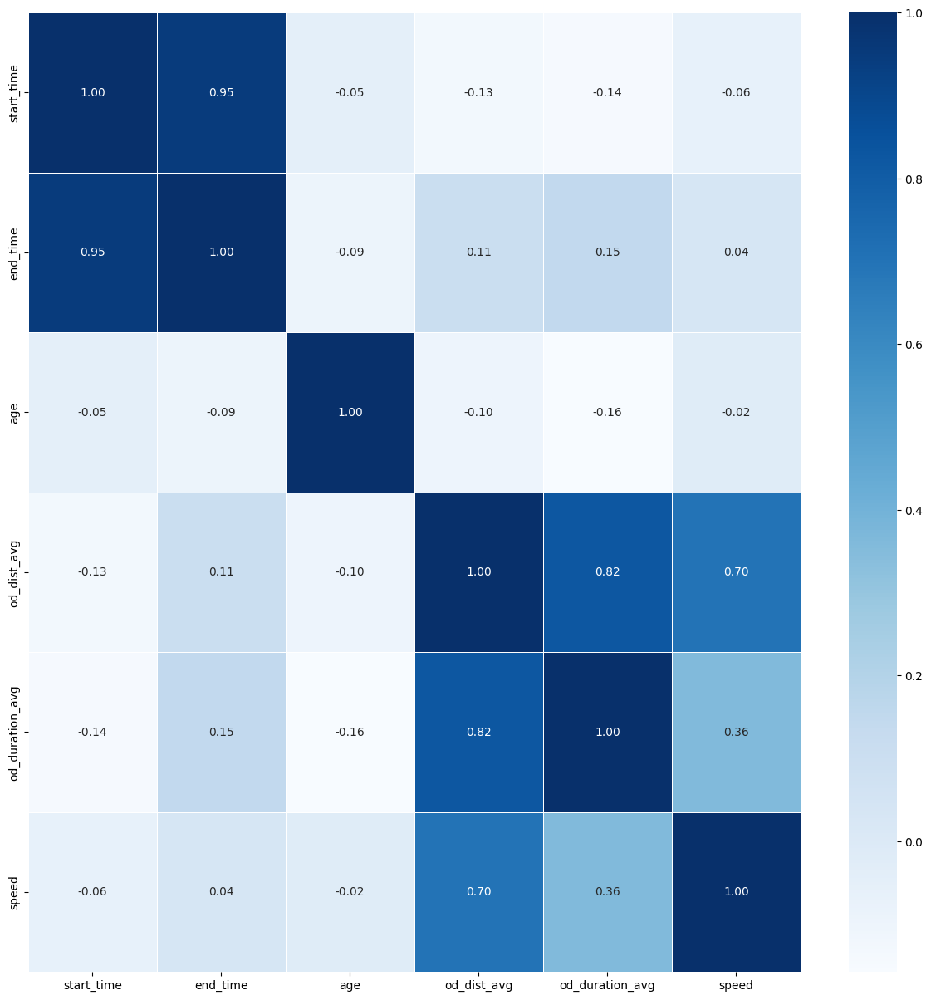

In [ ]:
plt.figure(figsize = (15, 15))
sns.heatmap(data = od_d_home_num.corr(), annot = True, fmt = '.2f', linewidths = .5, cmap = 'Blues')

###### SHAP value

In [ ]:
# isFestival 추가
f_dates = ['20230908', '20230909', '20230910']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
od_d_home['isFestival'] = od_d_home['date'].map(date_to_festival)

<ipython-input-50-ecbb336d7831>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_d_home.date.dtype

string[python]

In [ ]:
unique_dates = od_d_home.date.unique()

In [ ]:
# isWeekend 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5

od_d_home['isWeekend'] = od_d_home['date'].map(date_to_weekend)

<ipython-input-48-663d06b5221a>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_d_home

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed,isWeekend,isFestival
2336,3020055000,3017058800,20230901,21,21,1,2,차량,쇼핑여가,귀가,10497.0,27.0,7.0,23.33,False,False
14859,3020055000,2772025000,20230901,14,16,1,1,차량,여행,귀가,228892.0,146.0,23.0,94.07,False,False
16464,3020055000,3020054700,20230901,15,15,1,3,차량,쇼핑여가,귀가,24558.0,21.0,12.0,70.17,False,False
23300,3020055000,4471039000,20230901,18,19,0,2,차량,기타,귀가,88922.0,56.0,15.0,95.27,False,False
29781,3020055000,3020054700,20230901,12,12,0,4,차량,기타,귀가,24720.0,36.0,9.0,41.20,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
699489,3020055000,3017058800,20231015,18,18,1,1,시내버스,기타,귀가,5760.0,13.0,6.0,26.58,True,False
702036,3020055000,3020053000,20231015,16,16,1,2,시내버스,쇼핑여가,귀가,10269.0,32.0,5.0,19.25,True,False
703813,3020055000,3017058800,20231015,16,17,0,4,차량,기타,귀가,17826.0,40.0,5.0,26.74,True,False
712563,3020055000,3014057500,20231015,19,19,0,3,차량,쇼핑여가,귀가,15228.0,22.0,6.0,41.53,True,False


In [ ]:
od_d_home.info()

<class 'pandas.core.frame.DataFrame'>
Index: 44335 entries, 2336 to 713114
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   origin_hdong_cd  44335 non-null  string  
 1   dest_hdong_cd    44335 non-null  string  
 2   date             44335 non-null  string  
 3   start_time       44335 non-null  int64   
 4   end_time         44335 non-null  int64   
 5   gender           44335 non-null  category
 6   age              44335 non-null  int64   
 7   modal            44335 non-null  category
 8   origin_purpose   44335 non-null  category
 9   dest_purpose     44335 non-null  string  
 10  od_dist_avg      44335 non-null  float64 
 11  od_duration_avg  44335 non-null  float64 
 12  od_cnts          44335 non-null  float64 
 13  speed            44335 non-null  float64 
 14  isWeekend        44335 non-null  bool    
 15  isFestival       44335 non-null  bool    
dtypes: bool(2), category(3), float64(4), int6

In [ ]:
# 데이터 타입 변경
od_d_home.gender = od_d_home.gender.astype('bool')
od_d_home.modal = od_d_home.modal.astype('category')
od_d_home.origin_purpose = od_d_home.origin_purpose.astype('category')
od_d_home.dest_purspoe = od_d_home.dest_purpose.astype('category')

<ipython-input-56-8b058c51a182>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-56-8b058c51a182>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-56-8b058c51a182>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



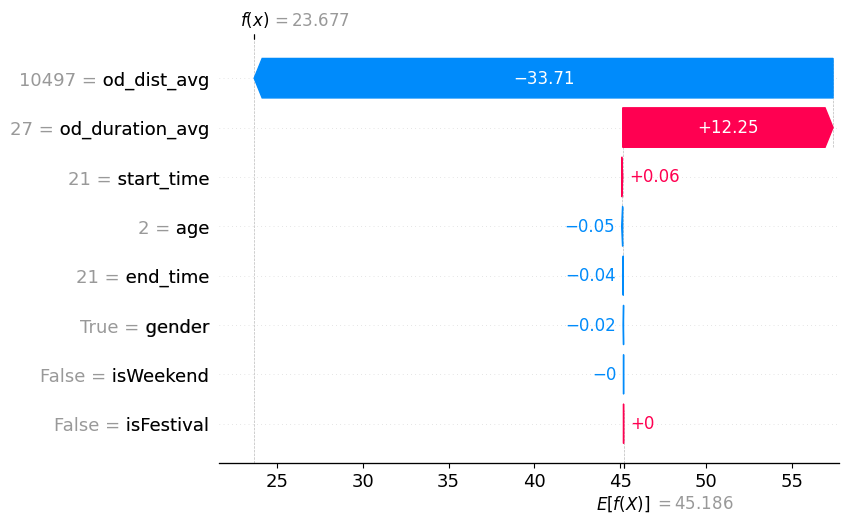

In [ ]:
import xgboost
import shap
# date는 category로 변경하기 애매함. 그래서 일단 제외
X = od_d_home.drop(columns = ['date', 'origin_hdong_cd', 'dest_hdong_cd', 'modal', 'origin_purpose', 'dest_purpose', 'od_cnts','speed'])
y = od_d_home.speed

model = xgboost.XGBRegressor().fit(X, y)

explainer = shap.Explainer(model)
shape_values = explainer(X)

shap.plots.waterfall(shape_values[0])

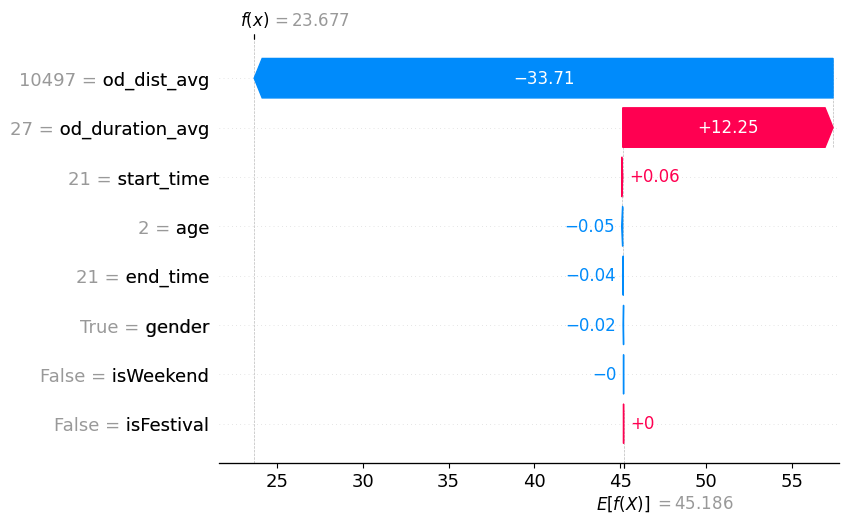

In [ ]:
shap.plots.waterfall(shape_values[0])

In [ ]:
shap.initjs()
shap.plots.force(shape_values[0])

###### feature importance

In [ ]:
X

,start_time,end_time,gender,age,od_dist_avg,od_duration_avg,isWeekend,isFestival
2336,21,21,True,2,10497.0,27.0,False,False
14859,14,16,True,1,228892.0,146.0,False,False
16464,15,15,True,3,24558.0,21.0,False,False
23300,18,19,False,2,88922.0,56.0,False,False
29781,12,12,False,4,24720.0,36.0,False,False
...,...,...,...,...,...,...,...,...
699489,18,18,True,1,5760.0,13.0,True,False
702036,16,16,True,2,10269.0,32.0,True,False
703813,16,17,False,4,17826.0,40.0,True,False
712563,19,19,False,3,15228.0,22.0,True,False


In [ ]:
model.feature_importances_

array([0.00409376, 0.00404683, 0.00301146, 0.00433024, 0.685695  ,
       0.2932014 , 0.00263834, 0.00298301], dtype=float32)

<Axes: title={'center': 'Feature Importance: gain'}, xlabel='F score', ylabel='Features'>

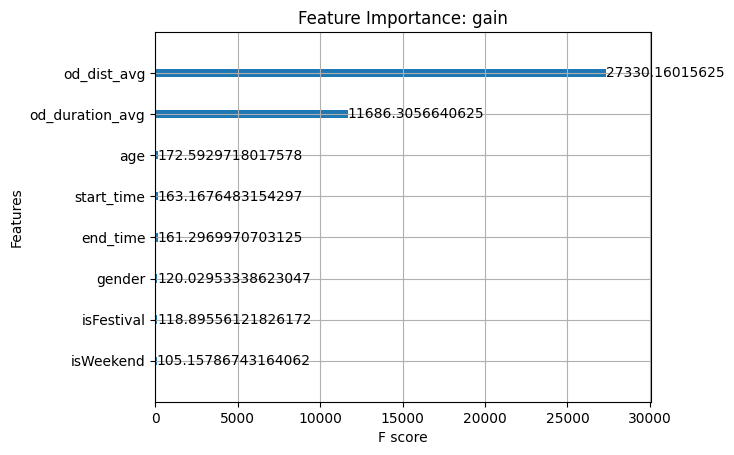

In [ ]:
xgboost.plot_importance(model, importance_type = 'gain', title = 'Feature Importance: gain')

###### PDP

In [ ]:
# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()
df_3 = od_home_3.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 1 week', width = 0.25)
data_2 = go.Bar(x = df_3['modal'], y = df_3['speed'], name = 'after 1 week', width = 0.25)

layout = go.Layout(title = '[대전] (귀가) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0, data_2], layout = layout)
fig.show()

##### 귀가 데이터 + 방문 데이터

In [ ]:
# 귀가 데이터
od_d_1 = od[(od.origin_hdong_cd == '3020055000')]
od_d_1 = od_d_1[(od_d_1.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_d_1.dest_purpose == '귀가')]

In [ ]:
# 방문 데이터
od_d_2 = od[(od.dest_hdong_cd == '3020055000')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_d_2

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts
npartitions=222,,,,,,,,,,,,,
,string,string,int64,int64,int64,int64,int64,string,string,string,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...


In [ ]:
od_d = dd.concat([od_d_1, od_d_2]).compute()

In [ ]:
od_d['speed'] = (od_d.od_dist_avg * 60)/(od_d.od_duration_avg * 1000)
od_d.speed = od_d.speed.round(2)
od_d.head()

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
2336,3020055000,3017058800,20230901,21,21,1,2,차량,쇼핑여가,귀가,10497.0,27.0,7.0,23.33
14859,3020055000,2772025000,20230901,14,16,1,1,차량,여행,귀가,228892.0,146.0,23.0,94.07
16464,3020055000,3020054700,20230901,15,15,1,3,차량,쇼핑여가,귀가,24558.0,21.0,12.0,70.17
23300,3020055000,4471039000,20230901,18,19,0,2,차량,기타,귀가,88922.0,56.0,15.0,95.27
29781,3020055000,3020054700,20230901,12,12,0,4,차량,기타,귀가,24720.0,36.0,9.0,41.20


In [ ]:
od_home_1 = od_d[(od_d.date >= 20230908)&(od_d.date <= 20230910)]
od_home_2 = od_d[(od_d.date >= 20230901)&(od_d.date <= 20230903)]
od_home_3 = od_d[(od_d.date >= 20230915)&(od_d.date <= 20230917)]

In [ ]:
# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()
df_3 = od_home_3.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 1 week', width = 0.25)
data_2 = go.Bar(x = df_3['modal'], y = df_3['speed'], name = 'after 1 week', width = 0.25)

layout = go.Layout(title = '[대전] (귀가+방문) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0, data_2], layout = layout)
fig.show()

In [ ]:
od_d.date = od_d.date.astype('int')

In [ ]:
od_d.date.unique()

array([20230901, 20230902, 20230903, 20230904, 20230905, 20230906,
       20230907, 20230908, 20230909, 20230910, 20230911, 20230912,
       20230913, 20230914, 20230915, 20230916, 20230917, 20230918,
       20230919, 20230920, 20230921, 20230922, 20230923, 20230924,
       20230925, 20230926, 20230927, 20230928, 20230929, 20230930,
       20231001, 20231002, 20231003, 20231004, 20231005, 20231006,
       20231007, 20231008, 20231009, 20231010, 20231011, 20231012,
       20231013, 20231014, 20231015])

In [ ]:
od_d_f = od_d[(od_d.date >= 20230908) & (od_d.date <= 20230910)]

#### 날짜별 방문객 수

In [ ]:
od_d.date = od_d.date.astype('int')
od_d_f.date = od_d_f.date.astype('int')

<ipython-input-9-9d0623b83e4a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  od_d_f.date = od_d_f.date.astype('int')


In [ ]:
df.head()

,date,od_cnts
0,2023-09-01,13005.0
1,2023-09-02,15794.0
2,2023-09-03,13423.0
3,2023-09-04,13103.0
4,2023-09-05,13049.0


In [ ]:
df = od_d.groupby('date').od_cnts.sum().reset_index()
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
fig = px.line(x = df.date, y = df.od_cnts, title = "날짜별 방문객 수")

fig.add_vrect(x0="2023-09-08", x1="2023-09-10",
              annotation_text="축제기간", annotation_position="top left",
              annotation=dict(font_size=15),
              fillcolor="green", opacity=0.1, line_width=0)

fig.show()

축제 기간 동안의 데이터의 비중

In [ ]:
print(f"축제 기간 데이터의 비중: {round(len(od_d[(od_d.date >= 20230908) & (od_d.date <= 20230910)])/len(od_d) * 100, 2)} %")

축제 기간 데이터의 비중: 7.57 %


OD 데이터 속 축제 기간 방문객 비중

In [ ]:
print(f"전체 대전 방문객 중 축제 방문객의 비중: {round((od_d_f[(od_d_f.date >= 20230908) & (od_d_f.date <= 20230910)].od_cnts.sum()) / od_d.od_cnts.sum() * 100, 2)} %")

전체 대전 방문객 중 축제 방문객의 비중: 7.66 %


In [ ]:
od_d.origin_hdong_cd.dtype

dtype('float64')

#### 단일 변수 분포 확인

##### od_dist_avg

In [ ]:
fig = px.box(y = od_d_f.od_dist_avg, title = "평균 이동거리")
fig.show()

##### od_duration_avg

In [ ]:
fig = px.box(y = od_d_f.od_duration_avg, title = "평균 이동시간")
fig.show()

##### gender

In [ ]:
df_0= od_d_f[od_d_f.gender == 0].od_cnts.sum()
df_1 = od_d_f[od_d_f.gender == 1].od_cnts.sum()

fig = px.pie(values = [df_0, df_1], names = ['남성', '여성'], title = '방문객 성비')
fig.show()

##### modal

In [ ]:
df_0 = od_d_f[od_d_f.origin_purpose == '귀가'].od_cnts.sum()
df_1 = od_d_f[od_d_f.origin_purpose == '업무'].od_cnts.sum()
df_2 = od_d_f[od_d_f.origin_purpose == '학업'].od_cnts.sum()
df_3 = od_d_f[od_d_f.origin_purpose == '쇼핑여가'].od_cnts.sum()
df_4 = od_d_f[od_d_f.origin_purpose == '기타'].od_cnts.sum()
df_5 = od_d_f[od_d_f.origin_purpose == '여행'].od_cnts.sum()

fig = px.pie(values = [df_0, df_1, df_2, df_3, df_4, df_5], names = ['귀가', '업무', '학업', '쇼핑여가', '기타', '여행'], title = '출발지 목적')
fig.show()

#### 축제 방문객 프로파일링

##### 어느 지역에서 많이 왔나? top5

In [ ]:
od_d_f.origin_hdong_cd = od_d_f.origin_hdong_cd.astype('int').astype('string')
df = od_d_f.groupby('origin_hdong_cd').od_cnts.sum().reset_index().sort_values(by = 'od_cnts', ascending = False).head()
fig = go.Figure(data = px.bar(x = df.origin_hdong_cd, y = df.od_cnts,title = '방문객 출발지 Top 5'))
fig.update_xaxes(title_text = "출발지")
fig.update_yaxes(title_text = "방문객 수")

fig.show()

<ipython-input-90-7ffa18c47f94>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 방문객 이동수단

In [ ]:
df = od_d_f.groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df, values = 'od_cnts', names = 'modal', title = '방문객 이동수단')
fig.show()

##### 지역 내/외 방문 비율 비교

In [ ]:
od_d_f.origin_hdong_cd = od_d_f.origin_hdong_cd.astype('str')

<ipython-input-12-09b2f167e8d9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  od_d_f.origin_hdong_cd = od_d_f.origin_hdong_cd.astype('str')


In [ ]:
# 지역 내/외 방문 비율 비교
df_in = od_d_f[od_d_f.origin_hdong_cd.str[:2] == '30'].od_cnts.sum()
df_out = od_d_f[od_d_f.origin_hdong_cd.str[:2] != '30'].od_cnts.sum()

fig = px.pie(values = [df_in, df_out], names = ['지역 내 방문', '지역 외 방문'], title = '(대전) 지역 내/외 방문')
fig.show()

##### 지역 내 이동수단

In [ ]:
df_in = od_d_f[od_d_f.origin_hdong_cd.str[:2] == '30'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_in, values = 'od_cnts', names = 'modal', title = '(대전) 지역 내 방문 이동수단')
fig.show()

##### 지역 외 이동수단

In [ ]:
df_out = od_d_f[od_d_f.origin_hdong_cd.str[:2] != '30'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_out, values = 'od_cnts', names = 'modal', title = '지역 외 방문 이동수단')
fig.show()

##### 성별, 나이대 구성 확인

In [ ]:
df = od_d_f.groupby(['gender', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]
data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '축제 방문객 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.update_yaxes(tickformat = ',')
fig.show()

##### 연령대별 이동수단

In [ ]:
df = od_d_f.groupby(['modal', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.modal == 0]
df_1 = df[df.modal == 1]
df_2 = df[df.modal == 2]
df_3 = df[df.modal == 3]
df_4 = df[df.modal == 4]
df_5 = df[df.modal == 5]
df_6 = df[df.modal == 6]
df_7 = df[df.modal == 7]

data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '차량', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '시내버스', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '지하철', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '도보', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '철도', width = 0.3)
data_6 = go.Bar(x = df_6['age'], y = df_6['od_cnts'], name = '시외고속버스', width = 0.3)
data_7 = go.Bar(x = df_7['age'], y = df_7['od_cnts'], name = '항공기', width = 0.3)

layout = go.Layout(title = '연령대별 이동수단'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5, data_6, data_7], layout = layout)
fig.show()

##### 도착시간에 따른 방문객

In [ ]:
od_d_f.loc[:, 'start_time'] = od_d_f.start_time.str[:2]
od_d_f.loc[:, 'end_time'] = od_d_f.end_time.str[:2]
df = od_d_f.groupby('end_time').od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = "od_cnts", title = "도착시간별 방문객 수")
fig.show()

##### 연령대에 따른 도착시간

In [ ]:
df = od_d_f.groupby(['end_time', 'age']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'age', markers = True, title = '연령대별 도착시간')
fig.show()

##### 이동수단에 따른 도착시간

In [ ]:
df = od_d_f.groupby(['end_time', 'modal']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'modal', markers = True, title = '이동수단별 도착시간')
fig.show()

##### 출발 목적에 따른 도착시간

In [ ]:
df = od_d_f.groupby(['end_time', 'origin_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'origin_purpose', markers = True, title = '출발 목적별 도착시간')
fig.show()

##### 도착 목적에 따른 도착시간

In [ ]:
df = od_d_f.groupby(['end_time', 'dest_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'dest_purpose', markers = True, title = '도착 목적별 도착시간')
fig.show()

##### 연령대별 출발목적

In [ ]:
df = od_d_f.groupby(['origin_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.origin_purpose == 0]
df_1 = df[df.origin_purpose == 1]
df_2 = df[df.origin_purpose == 2]
df_3 = df[df.origin_purpose == 3]
df_4 = df[df.origin_purpose == 4]
df_5 = df[df.origin_purpose == 5]


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '연령대별 출발목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()

##### 연령대별 도착목적

In [ ]:
df = od_d_f.groupby(['dest_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.dest_purpose == 0]
df_1 = df[df.dest_purpose == 1]
df_2 = df[df.dest_purpose == 2]
df_3 = df[df.dest_purpose == 3]
df_4 = df[df.dest_purpose == 4]
df_5 = df[df.dest_purpose == 5]


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '연령대별 도착목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()

##### 이동거리 - 이동시간

In [ ]:
px.scatter(data_frame = od_d_f, x = 'od_dist_avg', y = 'od_duration_avg', title = '이동거리-이동시간 분포')

##### 이동거리별 인원

In [ ]:
od_d_f.od_dist_avg = od_d_f.od_dist_avg.astype('int')
df = od_d_f.groupby('od_dist_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = df.od_dist_avg, y = df.od_cnts,title = '이동거리별 인원'))
# fig.update_xaxes(title_text = "출발지")
# fig.update_yaxes(title_text = "방문객 수")

fig.show()

<ipython-input-105-dda2da0945dc>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 이동시간별 인원

In [ ]:
od_d_f.od_duration_avg = od_d_f.od_duration_avg.astype('int')
df = od_d_f.groupby('od_duration_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = round(df.od_duration_avg/60, 1), y = df.od_cnts,title = '이동시간별 인원 (단위: 시간)'))
# fig.update_xaxes(title_text = "출발지")
# fig.update_yaxes(title_text = "방문객 수")

fig.show()

<ipython-input-106-3aa0810c0291>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 축제 피크타임

In [ ]:
df = od_d_f.groupby('end_time').od_cnts.sum().reset_index()

fig = px.density_heatmap(data_frame = df, x = 'end_time', y = 'od_cnts', nbinsy = 50)
fig.show()

#### 이동속도

In [ ]:
# (1) 출발지: 상관없음, 도착지: 대전컨벤션센터, 출발 목적: 상관없음, 도착목적: 기타/쇼핑여가/여행
# (2) 출발지: 대전컨벤션센터, 도착지: 상관없음, 출발 목적: 기타/쇼핑여가/여행, 도착 목적: 귀가
od_d_1 = od[(od.dest_hdong_cd == '3020055000')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_d_2 = od[(od.origin_hdong_cd == '3020055000')&(od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_d = dd.concat([od_d_1, od_d_2]).compute()
od_d

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts
1363,3611055600,3020055000,20230901,15,15,0,0,차량,귀가,기타,43798.0,42.0,27.0
17636,3020060000,3020055000,20230901,12,12,0,4,차량,여행,여행,8053.0,11.0,10.0
19600,3020060000,3020055000,20230901,21,21,1,0,차량,기타,기타,1534.0,5.0,21.0
26589,3020054000,3020055000,20230901,9,9,1,4,차량,귀가,기타,12216.0,16.0,12.0
28863,3611052300,3020055000,20230901,15,17,1,0,차량,기타,여행,55351.0,115.0,21.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
703813,3020055000,3017058800,20231015,16,17,0,4,차량,기타,귀가,17826.0,40.0,5.0
705053,3020055000,3017053500,20231015,16,17,1,3,시내버스,여행,여행,9719.0,38.0,5.0
706148,3020055000,3017064000,20231015,17,18,0,1,차량,기타,쇼핑여가,23573.0,48.0,5.0
712563,3020055000,3014057500,20231015,19,19,0,3,차량,쇼핑여가,귀가,15228.0,22.0,6.0


In [ ]:
od_d['speed'] = (od_d.od_dist_avg * 60)/(od_d.od_duration_avg * 1000)
od_d.speed = od_d.speed.round(2)
od_d.head()

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
1363,3611055600,3020055000,20230901,15,15,0,0,차량,귀가,기타,43798.0,42.0,27.0,62.57
17636,3020060000,3020055000,20230901,12,12,0,4,차량,여행,여행,8053.0,11.0,10.0,43.93
19600,3020060000,3020055000,20230901,21,21,1,0,차량,기타,기타,1534.0,5.0,21.0,18.41
26589,3020054000,3020055000,20230901,9,9,1,4,차량,귀가,기타,12216.0,16.0,12.0,45.81
28863,3611052300,3020055000,20230901,15,17,1,0,차량,기타,여행,55351.0,115.0,21.0,28.88


In [ ]:
# 주말 여부 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5

od_d['isWeekend'] = od_d['date'].map(date_to_weekend)

In [ ]:
df_od_speed_modal = od_d.groupby(['isWeekend', 'modal']).speed.mean().reset_index()
df_od_speed_modal

,isWeekend,modal,speed
0,False,기타,20.498558
1,False,도보,18.842097
2,False,시내버스,42.209595
3,False,지하철,38.761761
4,False,차량,48.132439
5,False,철도,86.800652
6,False,항공기,156.165000
7,True,기타,18.524696
8,True,도보,16.534884
9,True,시내버스,38.636669


In [ ]:
df_od_speed_modal_2 = od_d[(od_d.date >= 20230908) & (od_d.date <= 20230910)].groupby(['isWeekend', 'modal']).speed.mean().reset_index()
df_od_speed_modal_2

,isWeekend,modal,speed
0,False,기타,21.132268
1,False,도보,27.702500
2,False,시내버스,41.477376
3,False,지하철,29.158000
4,False,차량,48.212411
5,False,철도,69.136667
6,True,기타,18.033819
7,True,도보,16.513659
8,True,시내버스,37.950432
9,True,지하철,38.862245


In [ ]:
df_weekday = df_od_speed_modal[df_od_speed_modal.isWeekend == False]
df_weekend = df_od_speed_modal[df_od_speed_modal.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[대전] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df_weekday = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == False]
df_weekend = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[대전] 축제 기간 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

#### 귀가 데이터

In [ ]:
df_od = od[(od.origin_hdong_cd == '3020055000')].compute()
df_od

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts
107,3020055000,4372039000,20230901,8,9,0,3,차량,기타,기타,153144.0,56.0,7.0
593,3020055000,3020054000,20230901,12,12,1,3,차량,업무,업무,8717.0,12.0,14.0
1416,3020055000,3023052500,20230901,8,9,0,5,차량,기타,기타,14091.0,31.0,8.0
2336,3020055000,3017058800,20230901,21,21,1,2,차량,쇼핑여가,귀가,10497.0,27.0,7.0
2484,3020055000,3020054000,20230901,17,18,0,2,차량,쇼핑여가,기타,35412.0,49.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
706148,3020055000,3017064000,20231015,17,18,0,1,차량,기타,쇼핑여가,23573.0,48.0,5.0
712138,3020055000,3011051500,20231015,10,11,1,4,차량,귀가,쇼핑여가,18803.0,28.0,6.0
712563,3020055000,3014057500,20231015,19,19,0,3,차량,쇼핑여가,귀가,15228.0,22.0,6.0
712904,3020055000,3014072000,20231015,9,10,0,2,차량,귀가,기타,48388.0,51.0,5.0


In [ ]:
df_od_home = df_od[(df_od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(df_od.dest_purpose == '귀가')]
df_od_home

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts
2336,3020055000,3017058800,20230901,21,21,1,2,차량,쇼핑여가,귀가,10497.0,27.0,7.0
14859,3020055000,2772025000,20230901,14,16,1,1,차량,여행,귀가,228892.0,146.0,23.0
16464,3020055000,3020054700,20230901,15,15,1,3,차량,쇼핑여가,귀가,24558.0,21.0,12.0
23300,3020055000,4471039000,20230901,18,19,0,2,차량,기타,귀가,88922.0,56.0,15.0
29781,3020055000,3020054700,20230901,12,12,0,4,차량,기타,귀가,24720.0,36.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
699489,3020055000,3017058800,20231015,18,18,1,1,시내버스,기타,귀가,5760.0,13.0,6.0
702036,3020055000,3020053000,20231015,16,16,1,2,시내버스,쇼핑여가,귀가,10269.0,32.0,5.0
703813,3020055000,3017058800,20231015,16,17,0,4,차량,기타,귀가,17826.0,40.0,5.0
712563,3020055000,3014057500,20231015,19,19,0,3,차량,쇼핑여가,귀가,15228.0,22.0,6.0


In [ ]:
df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
df_od_home.speed = df_od_home.speed.round(2)
df_od_home.head()

<ipython-input-82-f5d0d7001bed>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-82-f5d0d7001bed>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
2336,3020055000,3017058800,20230901,21,21,1,2,차량,쇼핑여가,귀가,10497.0,27.0,7.0,23.33
14859,3020055000,2772025000,20230901,14,16,1,1,차량,여행,귀가,228892.0,146.0,23.0,94.07
16464,3020055000,3020054700,20230901,15,15,1,3,차량,쇼핑여가,귀가,24558.0,21.0,12.0,70.17
23300,3020055000,4471039000,20230901,18,19,0,2,차량,기타,귀가,88922.0,56.0,15.0,95.27
29781,3020055000,3020054700,20230901,12,12,0,4,차량,기타,귀가,24720.0,36.0,9.0,41.20


##### 교통 종합 접근성 지표와의 관계

##### 이동수단별

In [ ]:
df_od_home.groupby(['modal']).od_cnts.sum().reset_index()

,modal,od_cnts
0,기타,4883.0
1,도보,1526.0
2,시내버스,46016.0
3,지하철,1116.0
4,차량,266202.0
5,철도,272.0


In [ ]:
# 이동수단별 인구
df = df_od_home.groupby(['modal']).od_cnts.sum().reset_index()

bar = go.Bar(x = df.modal, y=df.od_cnts, name = '이동인구', width = 0.3)
layout = go.Layout(title = '[대전] 귀가 이동수단'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'count')

fig = go.Figure(data = [bar], layout = layout)
fig.update_layout(yaxis_tickformat = ',')
fig.show()

In [ ]:
# 이동수단별 평균 이동속도 비교
df = df_od_home.groupby('modal').speed.mean().reset_index()

bar = go.Bar(x = df.modal, y=df.speed, name = '이동속도', width = 0.3)
layout = go.Layout(title = '[대전] 귀가 이동수단별 평균 이동 속도 비교'
                  , xaxis_title = 'modal'
                  , yaxis_title = '이동속도')

fig = go.Figure(data = [bar], layout = layout)
fig.update_layout(yaxis_tickformat = ',')
fig.show()

,modal,start_time
0,기타,16.307285
1,도보,16.541667
2,시내버스,16.575216
3,지하철,17.098901
4,차량,16.305532
5,철도,15.631579


In [ ]:
# 이동수단별 평균 귀가 소요시간 비교
df = df_od_home.groupby('modal').od_duration_avg.mean().reset_index()
bar = go.Bar(x = df.modal, y=df.od_duration_avg, name = '소요시간', width = 0.3)
layout = go.Layout(title = '[대전] 귀가 이동수단별 평균 귀가 소요 시간 비교'
                   , xaxis_title = 'modal'
                   , yaxis_title = '귀가 소요시간')

fig = go.Figure(data = [bar], layout = layout)
fig.show()

In [ ]:
# 이동수단별 평균 귀가 시간 비교
df = df_od_home.groupby('modal').start_time.mean().reset_index()
bar = go.Bar(x = df.modal, y=df.start_time, name = '소요시간', width = 0.3)
layout = go.Layout(title = '[대전] 귀가 이동수단별 평균 귀가 시간 비교'
                   , xaxis_title = 'modal'
                   , yaxis_title = '귀가시간')

fig = go.Figure(data = [bar], layout = layout)

fig.show()


In [ ]:
# 이동수단별 평균 귀가 시간 비교
df = df_od_home.groupby('modal').end_time.mean().reset_index()
bar = go.Bar(x = df.modal, y=df.end_time, name = '도착시간', width = 0.3)
layout = go.Layout(title = '[대전] 귀가 이동수단별 평균 도착 시간 비교'
                   , xaxis_title = 'modal'
                   , yaxis_title = '도착시간')

fig = go.Figure(data = [bar], layout = layout)

fig.show()

In [ ]:
f_dates = ['20230908', '20230909', '20230910']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
df_od_home['isFestival'] = df_od_home['date'].map(date_to_festival)


<ipython-input-84-37c68a500462>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# 시간별 이동속도
df = df_od_home.groupby(['end_time', 'isFestival']).speed.mean().reset_index()

fig = px.line(df, x = 'end_time', y = 'speed', color = 'isFestival', markers = True, title = '시간별 이동속도')
fig.show()

In [ ]:
# 이동수단별 평균 속도
df_f = df_od_home[df_od_home.isFestival == True].groupby('modal').speed.mean().reset_index()
df_nf = df_od_home[df_od_home.isFestival == False].groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_f['modal'], y = df_f['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_nf['modal'], y = df_nf['speed'], name = 'non-festival', width = 0.25)


layout = go.Layout(title = '[대전] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

##### 데이터가 특정 지역에 몰려있는 경우가 있는지?

In [ ]:
df_od_home.value_counts('dest_hdong_cd').reset_index()

,dest_hdong_cd,count
0,3020054000,5124
1,3017058800,3960
2,3020054700,3889
3,3020057000,1842
4,3017064000,1497
...,...,...
1279,4131053000,1
1280,4136025300,1
1281,4136054500,1
1282,4136057000,1


In [ ]:
import geopandas as gpd

file_name = 'data/map/emd.shp'
emd = gpd.read_file(file_name, encoding = 'cp949')
emd

,EMD_CD,EMD_ENG_NM,EMD_KOR_NM,geometry
0,11110101,Cheongun-dong,청운동,"POLYGON ((953700.022 1954605.065, 953693.871 1..."
1,11110102,Singyo-dong,신교동,"POLYGON ((953233.465 1953996.984, 953235.183 1..."
2,11110103,Gungjeong-dong,궁정동,"POLYGON ((953560.228 1954257.466, 953561.19 19..."
3,11110104,Hyoja-dong,효자동,"POLYGON ((953519.843 1953890.785, 953518.489 1..."
4,11110105,Changseong-dong,창성동,"POLYGON ((953516.123 1953734.362, 953516.526 1..."
...,...,...,...,...
5061,52800390,Sangseo-myeon,상서면,"POLYGON ((924979.638 1740610.214, 924985.428 1..."
5062,52800400,Haseo-myeon,하서면,"POLYGON ((924910.563 1749481.985, 924971.3 174..."
5063,52800410,Julpo-myeon,줄포면,"POLYGON ((929554.188 1736493.399, 929554.106 1..."
5064,52800420,Wido-myeon,위도면,"MULTIPOLYGON (((890358.231 1737258.351, 890358..."


In [ ]:
import geopandas as gpd

file_name = 'data/map/sig.shp'
sig = gpd.read_file(file_name, encoding = 'cp949')
sig

,SIG_CD,SIG_ENG_NM,SIG_KOR_NM,geometry
0,11110,Jongno-gu,종로구,"POLYGON ((956615.453 1953567.199, 956621.579 1..."
1,11140,Jung-gu,중구,"POLYGON ((957890.386 1952616.746, 957909.908 1..."
2,11170,Yongsan-gu,용산구,"POLYGON ((953115.761 1950834.084, 953114.206 1..."
3,11200,Seongdong-gu,성동구,"POLYGON ((959681.109 1952649.605, 959842.412 1..."
4,11215,Gwangjin-gu,광진구,"POLYGON ((964825.058 1952633.25, 964875.565 19..."
...,...,...,...,...
247,52740,Jangsu-gun,장수군,"POLYGON ((1010833.697 1760276.768, 1010833.998..."
248,52750,Imsil-gun,임실군,"POLYGON ((964208.319 1735959.093, 964238.552 1..."
249,52770,Sunchang-gun,순창군,"POLYGON ((952623.909 1728974.778, 952672.751 1..."
250,52790,Gochang-gun,고창군,"MULTIPOLYGON (((902676.539 1717491.597, 902679..."


In [ ]:
emd_d = emd[emd.EMD_CD.str[:2] == '30']
emd_d

,EMD_CD,EMD_ENG_NM,EMD_KOR_NM,geometry
1229,3011010100,Won-dong,원동,"POLYGON ((994102.259 1814631.711, 994103.803 1..."
1230,3011010200,In-dong,인동,"POLYGON ((994532.876 1814101.87, 994523.422 18..."
1231,3011010300,Hyo-dong,효동,"POLYGON ((994753.444 1813546.801, 994759.89 18..."
1232,3011010400,Cheon-dong,천동,"POLYGON ((995219.804 1813575.229, 995224.703 1..."
1233,3011010500,Gao-dong,가오동,"POLYGON ((995883.774 1812758.562, 995893.182 1..."
...,...,...,...,...
1401,3023012200,Busu-dong,부수동,"POLYGON ((997863.235 1827571.026, 997917.853 1..."
1402,3023012300,Hwangho-dong,황호동,"POLYGON ((1000250.013 1828657.481, 1000250.615..."
1403,3023012400,Samjeong-dong,삼정동,"POLYGON ((996646.973 1828731.022, 996710.241 1..."
1404,3023012500,Miho-dong,미호동,"POLYGON ((998587.4 1830908.578, 998591.377 183..."


In [ ]:
emd['EMD_CD'] = emd['EMD_CD'] + '00'
emd

,EMD_CD,EMD_ENG_NM,EMD_KOR_NM,geometry
0,1111010100,Cheongun-dong,청운동,"POLYGON ((953700.022 1954605.065, 953693.871 1..."
1,1111010200,Singyo-dong,신교동,"POLYGON ((953233.465 1953996.984, 953235.183 1..."
2,1111010300,Gungjeong-dong,궁정동,"POLYGON ((953560.228 1954257.466, 953561.19 19..."
3,1111010400,Hyoja-dong,효자동,"POLYGON ((953519.843 1953890.785, 953518.489 1..."
4,1111010500,Changseong-dong,창성동,"POLYGON ((953516.123 1953734.362, 953516.526 1..."
...,...,...,...,...
5061,5280039000,Sangseo-myeon,상서면,"POLYGON ((924979.638 1740610.214, 924985.428 1..."
5062,5280040000,Haseo-myeon,하서면,"POLYGON ((924910.563 1749481.985, 924971.3 174..."
5063,5280041000,Julpo-myeon,줄포면,"POLYGON ((929554.188 1736493.399, 929554.106 1..."
5064,5280042000,Wido-myeon,위도면,"MULTIPOLYGON (((890358.231 1737258.351, 890358..."


In [ ]:
emd_d[emd_d.EMD_CD.isin(['3017011300'])]

,EMD_CD,EMD_ENG_NM,EMD_KOR_NM,geometry
1311,3017011300,Wolpyeong-dong,월평동,"POLYGON ((986909.283 1815084.651, 986910.03 18..."


In [ ]:
import matplotlib.pyplot as plt

plt.rc('font', family='NanumBarunGothic')

In [ ]:
emd_d_gu = emd_d[emd_d.EMD_CD.str[:5].isin(['30200', '30170'])]
emd_d_gu

,EMD_CD,EMD_ENG_NM,EMD_KOR_NM,geometry
1300,3017010100,Boksu-dong,복수동,"POLYGON ((989637.357 1812392.647, 989622.919 1..."
1301,3017010200,Byeon-dong,변동,"POLYGON ((990004.125 1814395.284, 990003.386 1..."
1302,3017010300,Doma-dong,도마동,"POLYGON ((989710.369 1813891.466, 989714.63 18..."
1303,3017010400,Jeongnim-dong,정림동,"MULTIPOLYGON (((988592.116 1811849.328, 988568..."
1304,3017010500,Yongmun-dong,용문동,"POLYGON ((990380.151 1814901.286, 990357.783 1..."
...,...,...,...,...
1375,3020014900,Dae-dong,대동,"POLYGON ((991264.858 1830627.284, 991258.316 1..."
1376,3020015000,Geumtan-dong,금탄동,"POLYGON ((989402.964 1831543.948, 989377.258 1..."
1377,3020015100,Sin-dong,신동,"POLYGON ((987667.493 1830354.561, 987644.132 1..."
1378,3020015200,Dungok-dong,둔곡동,"POLYGON ((987401.05 1829977.119, 987395.688 18..."


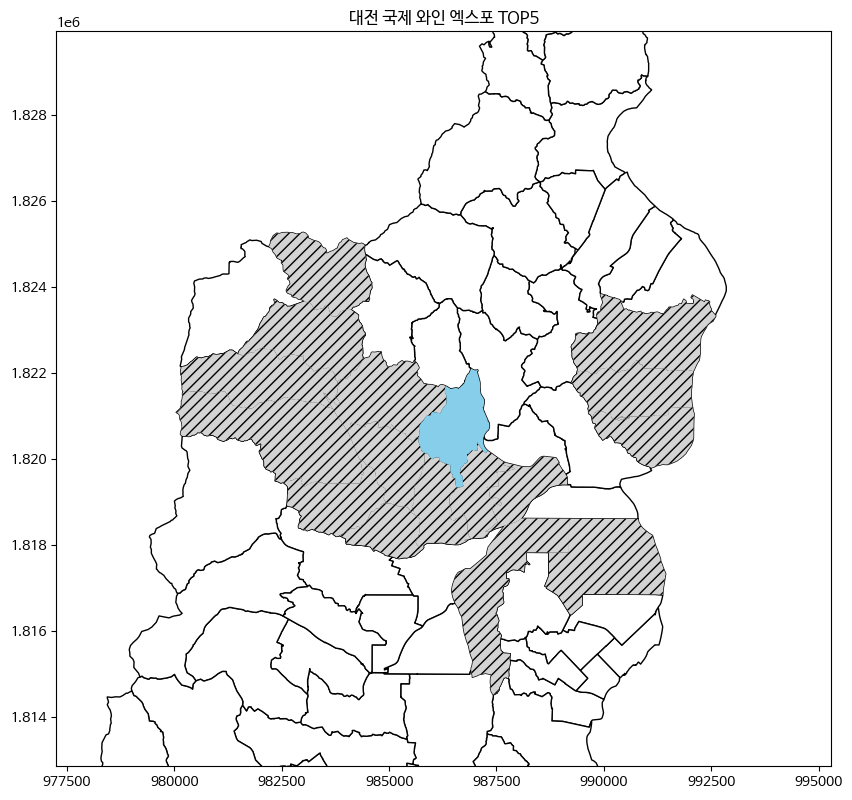

In [ ]:
# ax = emd_d.convex_hull.plot(color = )
fig, ax = plt.subplots(figsize = (10, 10))
f_area = emd_d[emd_d.EMD_CD == '3020012500']
top5 = emd_d[emd_d.EMD_CD.isin(['3020011700','3020011900',  '3020012100', '3020012200', '3020012300', '3020012400','3017011300',
                                '3020012000','3020012100', '3020013200', '3020013600', '3020013800', '3020013900','3020014000', '3020014100', '3020014200','3017011200'
                                ])]
emd_d_gu.plot(ax = ax, color = 'white', edgecolor = 'black')
top5.plot(ax = ax, legend = True, color = 'lightgrey', hatch = '///')
f_area.plot(ax = ax, color = 'skyblue')

minx, miny, maxx, maxy = emd_d.total_bounds
miny = miny * 1.008
maxx = maxx * 0.99
maxy = maxy * 0.998
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
plt.title('대전 국제 와인 엑스포 TOP5')
plt.show()

##### 전체 방문객 대비 귀가 데이터의 비율

### stay

In [ ]:
stay.hdong_cd = stay.hdong_cd.astype('int')

In [ ]:
stay_d = stay[stay.hdong_cd == 3020055000].compute()

In [ ]:
stay_d_f = stay_d[(stay_d.date >= 20230908) & (stay_d.date <= 20230910)]
stay_d_f

,hdong_cd,date,time,gender,age,purpose,stay_cnts
493071,3.020055e+09,20230908.0,14:00,1.0,4.0,0.0,1177.0
493953,3.020055e+09,20230908.0,23:00,0.0,4.0,0.0,1762.0
494428,3.020055e+09,20230908.0,09:00,0.0,4.0,5.0,697.0
494664,3.020055e+09,20230908.0,15:00,1.0,0.0,0.0,1795.0
494790,3.020055e+09,20230908.0,10:00,1.0,4.0,0.0,1249.0
...,...,...,...,...,...,...,...
121217,3.020055e+09,20230910.0,19:00,0.0,7.0,3.0,5.0
121696,3.020055e+09,20230910.0,20:00,0.0,7.0,3.0,5.0
123099,3.020055e+09,20230910.0,16:00,1.0,8.0,1.0,5.0
129204,3.020055e+09,20230910.0,18:00,1.0,8.0,3.0,5.0


In [ ]:
stay_d_f[['date', 'gender', 'age', 'purpose', 'stay_cnts']] = stay_d_f[['date', 'gender', 'age', 'purpose', 'stay_cnts']].astype('int')
stay_d_f.time = stay_d_f.time.str[:2]

<ipython-input-111-661d31941c82>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-111-661d31941c82>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
print(f"축제 기간 데이터의 비중: {round(len(stay_d_f)/len(stay_d) * 100, 2)} %")

축제 기간 데이터의 비중: 6.66 %


##### 날짜별 체류인구 수

In [ ]:
stay_d.date = stay_d.date.astype('int')

In [ ]:
df = stay_d.groupby('date').stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = px.line(df, x = 'date', y = 'stay_cnts', title = '날짜별 체류인구 수', markers = True)
fig.update_yaxes(tickformat=',')
fig.update_xaxes(nticks=50)
fig.add_vrect(x0="2023-09-08", x1="2023-09-10",
              annotation_text="축제기간", annotation_position="top left",
              annotation=dict(font_size=15),
              fillcolor="green", opacity=0.1, line_width=0)
fig.show()


#### 단일 변수 분포 확인

In [ ]:
# hdong_cd
stay_d_f.hdong_cd.value_counts()

,count
hdong_cd,
3020055000,10932


In [ ]:
# date
stay_d_f.date.value_counts()

,count
date,
20230908,1396
20230906,1391
20230905,1388
20230907,1374
20230904,1373
20230910,1340
20230909,1339
20230903,1331


In [ ]:
# time
stay_d_f.time.value_counts()

,count
time,
11,735
12,735
13,733
14,732
16,731
15,730
10,722
17,720
18,710


In [ ]:
# gender
stay_d_f.gender.value_counts()

,count
gender,
1,5570
0,5362


In [ ]:
# age
stay_d_f.age.value_counts()

,count
age,
2,1492
3,1383
1,1324
4,1248
5,1248
6,1239
7,1171
0,1000
8,827


In [ ]:
# purpose
stay_d_f.purpose.value_counts()

,count
purpose,
0,2304
4,2229
5,2090
3,1817
1,1726
2,766


#### 체류 인구

##### 날짜별 체류인구

In [ ]:
# 날짜별 체류인구
df = stay_d_f.groupby(['date']).stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = go.Figure(data = px.line(x = df.date , y = df.stay_cnts,title = '날짜별 체류인구', markers = True, range_x=['2023-09-08','2023-09-10']))
fig.update_xaxes(title_text = "date")
fig.update_yaxes(title_text = "stay_cnts")
fig.update_yaxes(tickformat=',')
fig.show()

##### 날짜별 시간별 체류인구

In [ ]:
# 날짜별 시간별 체류인구
df = stay_d_f.groupby(['date', 'time']).stay_cnts.sum().reset_index()

fig = px.line(df, x = 'time', y = 'stay_cnts', color = 'date', markers = True, title = '날짜별 시간별 체류인구')
fig.show()

##### 성별, 연령대 구성 확인

In [ ]:
df = stay_d_f.groupby(['gender', 'age']).stay_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['stay_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '체류인구 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()

##### 날짜별 체류 목적

In [ ]:
df = stay_d_f.groupby(['date', 'purpose']).stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['date'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['date'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['date'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['date'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['date'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['date'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '날짜별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'date'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 시간별 체류목적

In [ ]:
# 시간별 체류목적
df = stay_d_f.groupby(['time', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['time'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['time'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['time'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['time'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['time'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['time'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '시간별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'time'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 시간별 체류인구 (주중/주말)

In [ ]:
stay_d_f['weekend'] = stay_d_f['date'].apply(lambda x: 'weekend' if (x == 20230909)|(x == 20230910) else 'weekday')
df = stay_d_f.groupby(['weekend', 'time']).stay_cnts.sum().reset_index()

fig = px.line(df, x = 'time', y = 'stay_cnts', color = 'weekend', markers = True, title = '시간별 체류인구(주중/주말 구분)')
fig.update_yaxes(tickformat = ',')
fig.show()

<ipython-input-129-2e285dfe1981>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 연령대별 체류 목적

In [ ]:
df = stay_d_f.groupby(['age', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['age'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['age'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['age'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['age'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['age'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '연령대별 체류 목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()

## 부산

### OD

In [ ]:
od_b = od[od.dest_hdong_cd == 2635052000].compute()

In [ ]:
od_b_f = od_b[(od_b.date >= 20231004) & (od_b.date <= 20231013)]

In [ ]:
od_b_f

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts
176137,2.635065e+09,2.635052e+09,20231004.0,10:00,10:00,1.0,4.0,0.0,1.0,1.0,8036.0,21.0,8.0
177165,2.635065e+09,2.635052e+09,20231004.0,13:00,13:00,0.0,3.0,0.0,4.0,3.0,5497.0,12.0,8.0
179256,2.650080e+09,2.635052e+09,20231004.0,18:00,18:00,1.0,2.0,0.0,5.0,5.0,9876.0,11.0,8.0
182015,2.635052e+09,2.635052e+09,20231004.0,18:00,18:00,1.0,5.0,0.0,0.0,0.0,8478.0,15.0,21.0
182503,4.713066e+09,2.635052e+09,20231004.0,15:00,16:00,0.0,1.0,0.0,4.0,0.0,224510.0,91.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
343703,2.635065e+09,2.635052e+09,20231013.0,12:00,12:00,0.0,5.0,0.0,3.0,3.0,2352.0,5.0,5.0
350563,2.635051e+09,2.635052e+09,20231013.0,14:00,14:00,0.0,1.0,0.0,0.0,0.0,4501.0,16.0,5.0
352002,2.635051e+09,2.635052e+09,20231013.0,14:00,14:00,0.0,1.0,3.0,0.0,0.0,2053.0,21.0,5.0
355646,2.623071e+09,2.635052e+09,20231013.0,13:00,14:00,1.0,2.0,2.0,2.0,3.0,77806.0,78.0,5.0


In [ ]:
od_b_f.isna().sum()

,0
origin_hdong_cd,0
dest_hdong_cd,0
date,0
start_time,0
end_time,0
gender,0
age,0
modal,0
origin_purpose,19
dest_purpose,0


#### 축제 기간 전, 후 같은 요일의 이동속도 비교

##### 귀가 데이터

In [ ]:
od_b = od[od.origin_hdong_cd == '2635052000'].compute()

In [ ]:
od_b_home = od_b[(od_b.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_b.dest_purpose == '귀가')]
od_b_home['speed'] = (od_b_home.od_dist_avg * 60)/(od_b_home.od_duration_avg * 1000)
od_b_home.speed = od_b_home.speed.round(2)
od_b_home.head()

<ipython-input-72-565d258b2d04>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-72-565d258b2d04>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
13705,2635052000,2635065000,20230901,16,17,1,4,차량,쇼핑여가,귀가,37434.0,37.0,9.0,60.70
13764,2635052000,2629057000,20230901,13,13,1,4,차량,쇼핑여가,귀가,31322.0,24.0,10.0,78.31
14786,2635052000,2614066000,20230901,13,14,1,3,차량,쇼핑여가,귀가,73944.0,50.0,9.0,88.73
15373,2635052000,2635051000,20230901,17,17,0,0,차량,기타,귀가,13780.0,12.0,40.0,68.90
16479,2635052000,2635055300,20230901,16,17,0,2,기타,기타,귀가,29651.0,44.0,7.0,40.43


In [ ]:
unique_dates = od_b_home.date.unique()

In [ ]:
od_b_home.date = od_b_home.date.astype('string')

<ipython-input-76-6ea4973670af>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# isFestival 추가
f_dates = ['20231004' , '20231005', '20231006', '20231007', '20231008',
           '20231009', '20231010', '20231011', '20231012', '20231013']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
od_b_home['isFestival'] = od_b_home['date'].map(date_to_festival)

# isWeekend 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5

od_b_home['isWeekend'] = od_b_home['date'].map(date_to_weekend)

<ipython-input-79-160c6a9d7bd4>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-79-160c6a9d7bd4>:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# 데이터 타입 변경
od_b_home.gender = od_b_home.gender.astype('bool')
od_b_home.modal = od_b_home.modal.astype('category')
od_b_home.origin_purpose = od_b_home.origin_purpose.astype('category')
od_b_home.dest_purspoe = od_b_home.dest_purpose.astype('category')

###### 상관계수

In [ ]:
num_features = ['start_time', 'end_time', 'age', 'od_dist_avg', 'od_duration_avg', 'speed']
# 수치형 변수만 사용
od_b_home_num = od_b_home[num_features]

<Axes: >

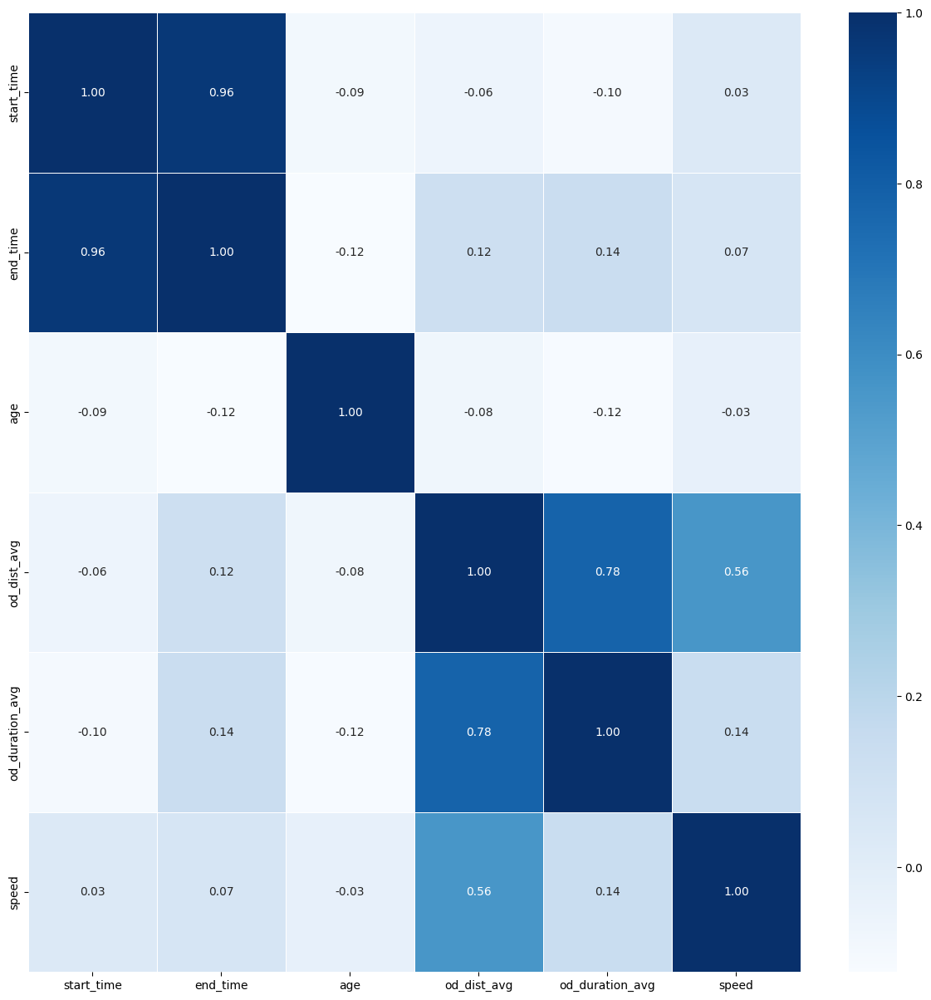

In [ ]:
plt.figure(figsize = (15, 15))
sns.heatmap(data = od_b_home.corr(), annot = True, fmt = '.2f', linewidths = .5, cmap = 'Blues')

###### shap value

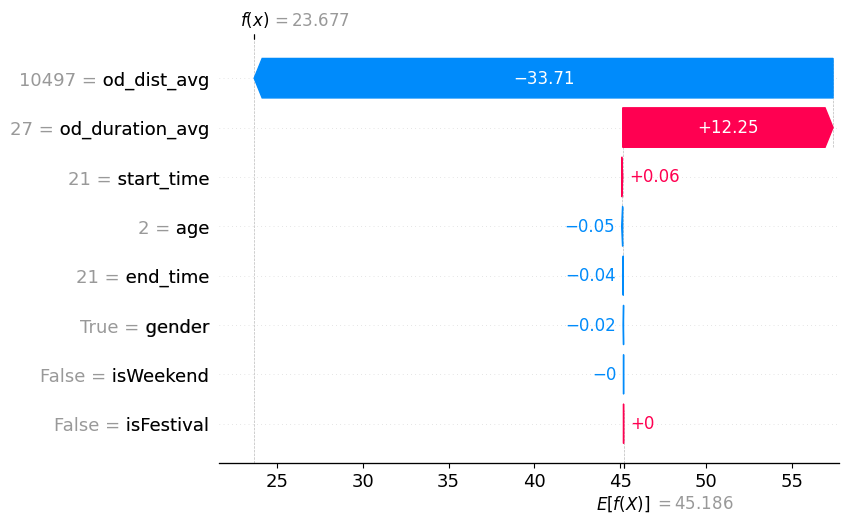

In [ ]:
import xgboost
import shap
# date는 category로 변경하기 애매함. 그래서 일단 제외
X = od_d_home.drop(columns = ['date', 'origin_hdong_cd', 'dest_hdong_cd', 'modal', 'origin_purpose', 'dest_purpose', 'od_cnts','speed'])
y = od_d_home.speed

model = xgboost.XGBRegressor().fit(X, y)

explainer = shap.Explainer(model)
shape_values = explainer(X)

shap.plots.waterfall(shape_values[0])


In [ ]:
shap.initjs()
shap.plots.force(shape_values[0])

###### feature importance

In [ ]:
X

,start_time,end_time,gender,age,od_dist_avg,od_duration_avg,isWeekend,isFestival
2336,21,21,True,2,10497.0,27.0,False,False
14859,14,16,True,1,228892.0,146.0,False,False
16464,15,15,True,3,24558.0,21.0,False,False
23300,18,19,False,2,88922.0,56.0,False,False
29781,12,12,False,4,24720.0,36.0,False,False
...,...,...,...,...,...,...,...,...
699489,18,18,True,1,5760.0,13.0,True,False
702036,16,16,True,2,10269.0,32.0,True,False
703813,16,17,False,4,17826.0,40.0,True,False
712563,19,19,False,3,15228.0,22.0,True,False


In [ ]:
model.feature_importances_

array([0.00409376, 0.00404683, 0.00301146, 0.00433024, 0.685695  ,
       0.2932014 , 0.00263834, 0.00298301], dtype=float32)

<Axes: title={'center': 'Feature Importance: gain'}, xlabel='F score', ylabel='Features'>

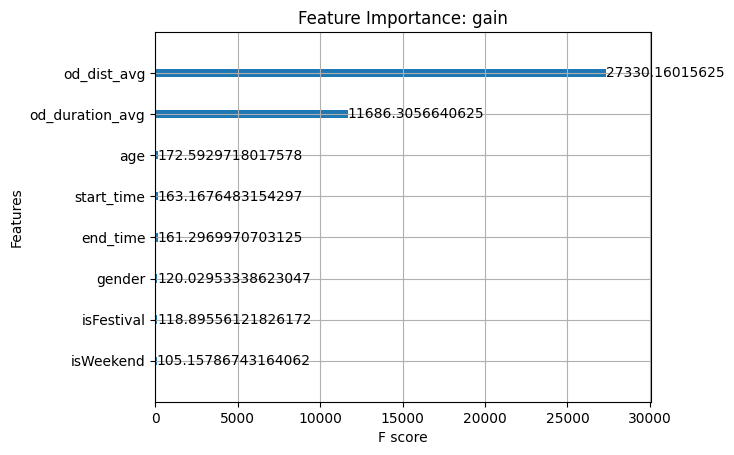

In [ ]:
xgboost.plot_importance(model, importance_type = 'gain', title = 'Feature Importance: gain')

In [ ]:
od_home_1 = od_b_home[(od_b_home.date >= 20231004)&(od_b_home.date <= 20231013)]
od_home_2 = od_b_home[(od_b_home.date >= 20230920)&(od_b_home.date <= 20230929)]

In [ ]:
# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 1 week', width = 0.25)

layout = go.Layout(title = '[부산] (귀가) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0], layout = layout)
fig.show()

##### 귀가 데이터 + 방문 데ㅣ터

In [ ]:
# 귀가 데이터
od_b_1 = od[(od.origin_hdong_cd == '2635052000')]
od_b_1 = od_b_1[(od_b_1.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_b_1.dest_purpose == '귀가')]
# 방문 데이터
od_b_2 = od[(od.dest_hdong_cd == '2635052000')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]

od_b = dd.concat([od_b_1, od_b_2]).compute()

In [ ]:
od_b['speed'] = (od_b.od_dist_avg * 60)/(od_b.od_duration_avg * 1000)
od_b.speed = od_b.speed.round(2)

od_home_1 = od_b[(od_b.date >= 20231004)&(od_b.date <= 20231013)]
od_home_2 = od_b[(od_b.date >= 20230920)&(od_b.date <= 20230929)]



In [ ]:
# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 1 week', width = 0.25)

layout = go.Layout(title = '[부산] (귀가+방문) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0], layout = layout)
fig.show()

#### 날짜별 방문객 수

In [ ]:
od_b.date = od_b.date.astype('int')

In [ ]:
df = od_b.groupby('date').od_cnts.sum().reset_index()
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
fig = px.line(x = df.date, y = df.od_cnts, title = "날짜별 방문객 수")
fig.update_yaxes(tickformat = ',')
fig.add_vrect(x0="2023-10-04", x1="2023-10-13",
              annotation_text="축제기간", annotation_position="top left",
              annotation=dict(font_size=15),
              fillcolor="green", opacity=0.1, line_width=0)
fig.show()

#### 단일 변수 분포 확인

In [ ]:
# origin_hdong_cd
od_b_f.origin_hdong_cd.value_counts()

,count
origin_hdong_cd,
2.635065e+09,7797
2.635052e+09,4868
2.635051e+09,3701
2.650080e+09,1631
2.635053e+09,1395
...,...
4.711154e+09,1
4.613031e+09,1
4.113162e+09,1


In [ ]:
# dest_hdong_cd
od_b_f.dest_hdong_cd.value_counts()

,count
dest_hdong_cd,
2.635052e+09,30075


In [ ]:
od_b_f.date.value_counts()

,count
date,
20231008.0,3898
20231007.0,3635
20231006.0,3249
20231005.0,2931
20231009.0,2841
20231013.0,2821
20231011.0,2742
20231012.0,2723
20231010.0,2647


In [ ]:
od_b.columns

Index(['origin_hdong_cd', 'dest_hdong_cd', 'date', 'start_time', 'end_time',
       'gender', 'age', 'modal', 'origin_purpose', 'dest_purpose',
       'od_dist_avg', 'od_duration_avg', 'od_cnts'],
      dtype='object')

In [ ]:
od_b_f.start_time.value_counts()

,count
start_time,
08:00,4260
09:00,2717
12:00,2364
14:00,2357
15:00,2273
13:00,2245
11:00,2170
10:00,2115
16:00,2045


In [ ]:
od_b_f.end_time.value_counts()

,count
end_time,
09:00,3148
08:00,2499
12:00,2445
14:00,2308
15:00,2281
13:00,2229
16:00,2229
10:00,2175
11:00,2150


In [ ]:
od_b_f.gender.value_counts()

,count
gender,
1.0,18171
0.0,11904


In [ ]:
od_b_f.groupby('gender').od_cnts.sum()

,od_cnts
gender,
0.0,107414.0
1.0,152602.0


In [ ]:
od_b_f.age.value_counts()

,count
age,
3.0,8882
2.0,6390
0.0,4258
4.0,3847
1.0,3237
5.0,2403
6.0,646
7.0,369
8.0,43


In [ ]:
od_b_f.modal.value_counts()

,count
modal,
0.0,23161
1.0,3771
2.0,1680
4.0,1291
3.0,161
7.0,7
5.0,4


In [ ]:
od_b_f.origin_purpose.value_counts()

,count
origin_purpose,
0.0,17476
5.0,5054
1.0,2546
4.0,2274
3.0,2169
2.0,537


In [ ]:
od_b_f.dest_purpose.value_counts()

,count
dest_purpose,
0.0,9634
3.0,6322
1.0,5424
5.0,5041
4.0,2933
2.0,721


In [ ]:
od_b_f.od_dist_avg.describe()

,od_dist_avg
count,30075.000000
mean,27539.310324
std,43519.566022
min,161.000000
25%,7529.500000
50%,16014.000000
75%,31546.500000
max,964095.000000


In [ ]:
od_b_f.od_duration_avg.describe()

,od_duration_avg
count,30075.000000
mean,32.119002
std,29.288260
min,1.000000
25%,13.000000
50%,24.000000
75%,43.000000
max,465.000000


In [ ]:
od_b_f.od_cnts.describe()

,od_cnts
count,30075.000000
mean,8.645586
std,6.311006
min,5.000000
25%,6.000000
50%,6.000000
75%,10.000000
max,232.000000


#### 축제 방문객 분석

##### 어느 지역에서 많이 왔나? Top5

In [ ]:
od_b_f.origin_hdong_cd = od_b_f.origin_hdong_cd.astype('int').astype('string')
df = od_b_f.groupby('origin_hdong_cd').od_cnts.sum().reset_index().sort_values(by = 'od_cnts', ascending = False).head()
fig = go.Figure(data = px.bar(x = df.origin_hdong_cd, y = df.od_cnts,title = '방문객 출발지 Top 5'))
fig.update_xaxes(title_text = "출발지")
fig.update_yaxes(title_text = "방문객 수", tickformat = ',')
fig.show()

<ipython-input-151-32d2538f5269>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 방문객 이동수단

In [ ]:
df = od_b_f.groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df, values = 'od_cnts', names = 'modal', title = '방문객 이동수단')
fig.show()

##### 지역 내/외 방문 비율 비교

In [ ]:
df_in = od_b_f[od_b_f.origin_hdong_cd.str[:2] == '26'].od_cnts.sum()
df_out = od_b_f[od_b_f.origin_hdong_cd.str[:2] != '26'].od_cnts.sum()

fig = px.pie(values = [df_in, df_out], names = ['지역 내 방문', '지역 외 방문'], title = '지역 내/외 방문')
fig.show()

##### 지역 내 이동수단

In [ ]:
df_in = od_b_f[od_b_f.origin_hdong_cd.str[:2] == '26'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_in, values = 'od_cnts', names = 'modal', title = '지역 내 방문 이동수단')
fig.show()

##### 지역 외 이동수단

In [ ]:
df_out = od_b_f[od_b_f.origin_hdong_cd.str[:2] != '26'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_out, values = 'od_cnts', names = 'modal', title = '지역 외 방문 이동수단')
fig.show()

##### 성별, 나이대 구성 확인

In [ ]:
df = od_b_f.groupby(['gender', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]
data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '축제 방문객 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()



##### 나이대별 이동수단

In [ ]:
# 연령대별 이동수단
df = od_b_f.groupby(['modal', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.modal == 0]
df_1 = df[df.modal == 1]
df_2 = df[df.modal == 2]
df_3 = df[df.modal == 3]
df_4 = df[df.modal == 4]
df_5 = df[df.modal == 5]
df_6 = df[df.modal == 6]
df_7 = df[df.modal == 7]

data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '차량', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '시내버스', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '지하철', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '도보', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '철도', width = 0.3)
data_6 = go.Bar(x = df_6['age'], y = df_6['od_cnts'], name = '시외고속버스', width = 0.3)
data_7 = go.Bar(x = df_7['age'], y = df_7['od_cnts'], name = '항공기', width = 0.3)

layout = go.Layout(title = '연령대별 이동수단'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5, data_6, data_7], layout = layout)
fig.show()


##### 도착시간에 따른 방문객

In [ ]:
od_b_f.loc[:, 'start_time'] = od_b_f.start_time.str[:2]
od_b_f.loc[:, 'end_time'] = od_b_f.end_time.str[:2]
df = od_b_f.groupby('end_time').od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = "od_cnts", title = "도착시간별 방문객 수")
fig.show()

##### 나이대에 따른 도착시간

In [ ]:
df = od_b_f.groupby(['end_time', 'age']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'age', markers = True, title = '연령대별 도착시간')
fig.show()

##### 이동수단에 따른 도착시간

In [ ]:
df = od_b_f.groupby(['end_time', 'modal']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'modal', markers = True, title = '이동수단별 도착시간')
fig.show()

##### 출발 목적에 따른 도착시간

In [ ]:
df = od_b_f.groupby(['end_time', 'origin_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'origin_purpose', markers = True, title = '출발 목적별 도착시간')
fig.show()

##### 도착 목적에 따른 도착시간

In [ ]:
df = od_b_f.groupby(['end_time', 'dest_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'dest_purpose', markers = True, title = '도착 목적별 도착시간')
fig.show()

##### 나이대별 출발 목적

In [ ]:
df = od_b_f.groupby(['origin_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.origin_purpose == 0]
df_1 = df[df.origin_purpose == 1]
df_2 = df[df.origin_purpose == 2]
df_3 = df[df.origin_purpose == 3]
df_4 = df[df.origin_purpose == 4]
df_5 = df[df.origin_purpose == 5]


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '연령대별 출발목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()


##### 나이대별 도착목적

In [ ]:
df = od_b_f.groupby(['dest_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.dest_purpose == 0]
df_1 = df[df.dest_purpose == 1]
df_2 = df[df.dest_purpose == 2]
df_3 = df[df.dest_purpose == 3]
df_4 = df[df.dest_purpose == 4]
df_5 = df[df.dest_purpose == 5]


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '연령대별 도착목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()



##### 이동거리 - 이동시간

In [ ]:
px.scatter(data_frame = od_b_f, x = 'od_dist_avg', y = 'od_duration_avg', title = '이동거리-이동시간 분포')

##### 이동거리별 인원

In [ ]:
od_b_f.od_dist_avg = od_b_f.od_dist_avg.astype('int')
df = od_b_f.groupby('od_dist_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = df.od_dist_avg, y = df.od_cnts,title = '이동거리별 인원'))
# fig.update_xaxes(title_text = "출발지")
# fig.update_yaxes(title_text = "방문객 수")

fig.show()

<ipython-input-161-e912048d6977>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 이동시간별 인원

In [ ]:
od_b_f.od_duration_avg = od_b_f.od_duration_avg.astype('int')
df = od_b_f.groupby('od_duration_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = round(df.od_duration_avg/60, 1), y = df.od_cnts,title = '이동시간별 인원 (단위: 시간)'))
# fig.update_xaxes(title_text = "출발지")
# fig.update_yaxes(title_text = "방문객 수")

fig.show()


<ipython-input-162-6202ec89c0a8>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 축제 피크타임

In [ ]:
df = od_b_f.groupby('end_time').od_cnts.sum().reset_index()

fig = px.density_heatmap(data_frame = df, x = 'end_time', y = 'od_cnts', nbinsy = 50)
fig.show()

#### 이동속도

In [ ]:
od.date = od.date.astype('int')

In [ ]:
# (축제 방문 인원) 출발지: 상관없음, 도착지: 축제 지역 행정동, 출발 목적: 상관없음, 도착목적: 기타/쇼핑여가/여행
# (축제 귀가 인원) 출발지: 축제 지역 행정동, 도착지: 상관없음, 출발 목적: 기타/쇼핑여가/여행, 도착 목적: 귀가
od_b_1 = od[(od.dest_hdong_cd == '2635052000')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_b_2 = od[(od.origin_hdong_cd == '2635052000')&(od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_b = dd.concat([od_b_1, od_b_2]).compute()

# 평균 이동속도 컬럼 추가
od_b['speed'] = (od_b.od_dist_avg * 60)/(od_b.od_duration_avg * 1000)
od_b.speed = od_b.speed.round(2)

# 주말 여부 컬럼 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5
od_b['isWeekend'] = od_b['date'].map(date_to_weekend)

# 시각화를 위한 데이터 준비
df_od_speed_modal = od_d.groupby(['isWeekend', 'modal']).speed.mean().reset_index()
df_od_speed_modal_2 = od_d[(od_d.date >= 20231004) & (od_d.date <= 20231013)].groupby(['isWeekend', 'modal']).speed.mean().reset_index()

In [ ]:
df_weekday = df_od_speed_modal[df_od_speed_modal.isWeekend == False]
df_weekend = df_od_speed_modal[df_od_speed_modal.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[부산] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df_weekday = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == False]
df_weekend = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[부산] 축제기간 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

#### 귀가 데이터

In [ ]:
df_od = od[(od.origin_hdong_cd == '2635052000')].compute()
df_od_home = df_od[(df_od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(df_od.dest_purpose == '귀가')]
df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
df_od_home.speed = df_od_home.speed.round(2)

<ipython-input-97-f73b32c199e8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
<ipython-input-97-f73b32c199e8>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_od_home.speed = df_od_home.speed.round(2)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

In [ ]:
import geopandas as gpd
file_name = 'data/map/emd.shp'
emd = gpd.read_file(file_name, encoding = 'cp949')
import geopandas as gpd
file_name = 'data/map/sig.shp'
sig = gpd.read_file(file_name, encoding = 'cp949')
emd_b = emd[emd.EMD_CD.str[:2] == '26']
emd_b['EMD_CD'] = emd_b['EMD_CD'] + '00'

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
df_od_home.value_counts('dest_hdong_cd').reset_index()

,dest_hdong_cd,count
0,2635051000,10700
1,2635052500,5346
2,2635065000,5129
3,2635055300,4845
4,2635066000,2775
...,...,...
927,4311252000,1
928,4311251000,1
929,4180025300,1
930,4167035000,1


In [ ]:
emd_b[emd_b.EMD_KOR_NM.isin(['재송동'])]

,EMD_CD,EMD_ENG_NM,EMD_KOR_NM,geometry
591,2635010400,Jaesong-dong,재송동,"POLYGON ((1148107.581 1690011.807, 1148122.689..."


In [ ]:
emd_b_gu = emd_b[emd_b.EMD_CD.str[:5] == '26350']

In [ ]:
emd_b.EMD_KOR_NM.unique()

array(['영주동', '대창동1가', '대창동2가', '중앙동1가', '중앙동2가', '중앙동3가', '중앙동4가',
       '중앙동5가', '중앙동6가', '중앙동7가', '동광동1가', '동광동2가', '동광동3가', '동광동4가',
       '동광동5가', '대청동1가', '대청동2가', '대청동3가', '대청동4가', '보수동1가', '보수동2가',
       '보수동3가', '부평동1가', '부평동2가', '부평동3가', '부평동4가', '신창동1가', '신창동2가',
       '신창동3가', '신창동4가', '창선동1가', '창선동2가', '광복동1가', '광복동2가', '광복동3가',
       '남포동1가', '남포동2가', '남포동3가', '남포동4가', '남포동5가', '남포동6가', '동대신동1가',
       '동대신동2가', '동대신동3가', '서대신동1가', '서대신동2가', '서대신동3가', '부용동1가', '부용동2가',
       '부민동1가', '부민동2가', '부민동3가', '토성동1가', '토성동2가', '토성동3가', '아미동1가',
       '아미동2가', '토성동4가', '토성동5가', '초장동', '충무동1가', '충무동2가', '충무동3가',
       '남부민동', '암남동', '초량동', '수정동', '좌천동', '범일동', '대교동1가', '대교동2가',
       '대평동1가', '대평동2가', '남항동1가', '남항동2가', '남항동3가', '영선동1가', '영선동2가',
       '영선동3가', '영선동4가', '신선동1가', '신선동2가', '신선동3가', '봉래동1가', '봉래동2가',
       '봉래동3가', '봉래동4가', '봉래동5가', '청학동', '동삼동', '양정동', '전포동', '부전동',
       '범천동', '범전동', '연지동', '초읍동', '부암동', '당감동', '가야동', '개금동', '명장동',
       '안락동', '칠산동', 

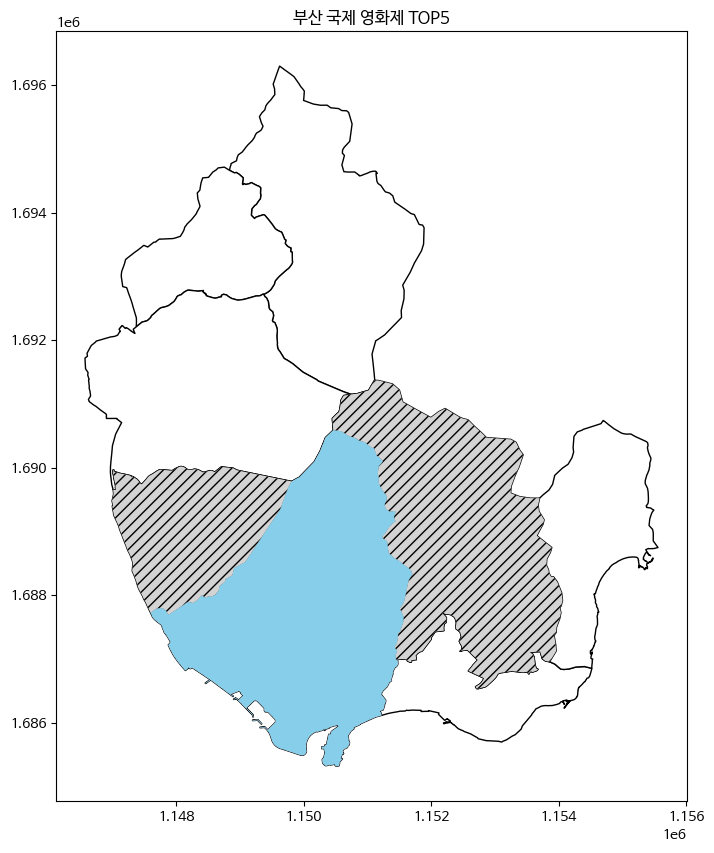

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10))
f_area = emd_b[emd_b.EMD_KOR_NM == '우동']
top5 = emd_b[emd_b.EMD_CD.isin(['2635010500',
                                '2635010400',
                                '2635010700',
                                ])]
emd_b_gu.plot(ax = ax, color = 'white', edgecolor = 'black')
top5.plot(ax = ax, legend = True, color = 'lightgrey', hatch = '///')
f_area.plot(ax = ax, color = 'skyblue')

minx, miny, maxx, maxy = emd_d.total_bounds
# miny = miny * 1.008
# maxx = maxx * 0.99
# maxy = maxy * 0.998
# ax.set_xlim(minx, maxx)
# ax.set_ylim(miny, maxy)
plt.title('부산 국제 영화제 TOP5')
plt.show()

##### 이동속도

In [ ]:
df_od = od[(od.origin_hdong_cd == '2635052000')].compute()
df_od_home = df_od[(df_od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(df_od.dest_purpose == '귀가')]

df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
df_od_home.speed = df_od_home.speed.round(2)
df_od_home.head()

<ipython-input-87-9f6cfaf4e342>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-87-9f6cfaf4e342>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
13705,2635052000,2635065000,20230901,16,17,1,4,차량,쇼핑여가,귀가,37434.0,37.0,9.0,60.70
13764,2635052000,2629057000,20230901,13,13,1,4,차량,쇼핑여가,귀가,31322.0,24.0,10.0,78.31
14786,2635052000,2614066000,20230901,13,14,1,3,차량,쇼핑여가,귀가,73944.0,50.0,9.0,88.73
15373,2635052000,2635051000,20230901,17,17,0,0,차량,기타,귀가,13780.0,12.0,40.0,68.90
16479,2635052000,2635055300,20230901,16,17,0,2,기타,기타,귀가,29651.0,44.0,7.0,40.43


In [ ]:
f_dates = ['20231004', '20231005', '20231006', '20231007', '20231008', '20231009', '20231010', '20231011', '20231012', '20231013']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
df_od_home['isFestival'] = df_od_home['date'].map(date_to_festival)

<ipython-input-89-08f54efdd1e3>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# 시간별 이동속도
df = df_od_home.groupby(['end_time', 'isFestival']).speed.mean().reset_index()

fig = px.line(df, x = 'end_time', y = 'speed', color = 'isFestival', markers = True, title = '시간별 이동속도')
fig.show()



In [ ]:
# 이동수단별 평균 속도
df_f = df_od_home[df_od_home.isFestival == True].groupby('modal').speed.mean().reset_index()
df_nf = df_od_home[df_od_home.isFestival == False].groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_f['modal'], y = df_f['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_nf['modal'], y = df_nf['speed'], name = 'non-festival', width = 0.25)
layout = go.Layout(title = '[부산] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df_od_home.groupby(['dest_hdong_cd']).od_cnts.sum().reset_index().sort_values('od_cnts', ascending = False)

,dest_hdong_cd,od_cnts
155,2635051000,72161.0
170,2635065000,44127.0
156,2635052500,40449.0
161,2635055300,36031.0
171,2635066000,17755.0
...,...,...
474,4113353000,5.0
1,1111065000,5.0
460,3611039000,5.0
404,3023054300,5.0


In [ ]:
# 이동수단별 평균 이동속도 비교
df = df_od_home.groupby('modal').speed.mean().reset_index()

bar = go.Bar(x = df.modal, y=df.speed, name = '이동속도', width = 0.3)
layout = go.Layout(title = '[부산] 귀가 이동수단별 평균 이동 속도 비교'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [bar], layout = layout)
fig.update_layout(yaxis_tickformat = ',')
fig.show()

### stay

In [ ]:
stay_b = stay[stay.hdong_cd == 2635052000].compute()
stay_b_f = stay_b[(stay_b.date >= 20231004) & (stay_b.date <= 20231013)]

#### 단일 변수 분포 확인

In [ ]:
stay_b.hdong_cd.value_counts()

,count
hdong_cd,
2.635052e+09,64422


In [ ]:
stay_b.date = stay_b.date.astype('int')

In [ ]:
stay_b_f.date = stay_b_f.date.astype('int')

<ipython-input-12-028e6c61cbcf>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stay_b_f.date = stay_b_f.date.astype('int')


In [ ]:
df = stay_b.groupby('date').stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = px.line(df, x = 'date', y = 'stay_cnts', title = '(전체) 날짜별 체류인구', markers = True)
fig.update_yaxes(tickformat=',')
fig.update_xaxes(nticks=50)
fig.show()


In [ ]:
df = stay_b_f.groupby(['date']).stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = go.Figure(data = px.line(x = df.date , y = df.stay_cnts,title = '날짜별 체류인구', markers = True))
fig.update_xaxes(title_text = "date")
fig.update_yaxes(title_text = "stay_cnts")
fig.update_yaxes(tickformat=',')
fig.show()

In [ ]:
stay_b.time.value_counts()

,count
time,
14:00,4258
15:00,4254
13:00,4254
12:00,4245
16:00,4244
11:00,4233
10:00,4232
17:00,4221
18:00,4177


In [ ]:
stay_b.gender.value_counts()

,count
gender,
1.0,32573
0.0,31849


In [ ]:
stay_b.age.value_counts()

,count
age,
2.0,8448
1.0,7925
3.0,7842
5.0,7020
4.0,7020
6.0,7000
7.0,6828
0.0,6601
8.0,5738


In [ ]:
stay_b.purpose.value_counts()

,count
purpose,
0.0,12960
4.0,12945
5.0,12475
3.0,10906
1.0,10275
2.0,4861


In [ ]:
stay_b.stay_cnts.describe()

,stay_cnts
count,64422.000000
mean,520.203828
std,583.209401
min,5.000000
25%,83.000000
50%,287.000000
75%,776.000000
max,4268.000000


#### 체류 인구 분석

##### 날짜별 체류인구

In [ ]:
df = stay_b_f.groupby(['date']).stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = go.Figure(data = px.line(x = df.date , y = df.stay_cnts,title = '날짜별 체류인구', markers = True))
fig.update_xaxes(title_text = "date")
fig.update_yaxes(title_text = "stay_cnts")
fig.update_yaxes(tickformat=',')
fig.show()

##### 날짜별 시간별 체류인구

In [ ]:
df = stay_b_f.groupby(['date', 'time']).stay_cnts.sum().reset_index()

fig = px.line(df, x = 'time', y = 'stay_cnts', color = 'date', markers = True, title = '날짜별 시간별 체류인구')
fig.show()


##### 성별, 연령대 구성 확인

In [ ]:
df = stay_b_f.groupby(['gender', 'age']).stay_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['stay_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '체류인구 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 날짜별 체류 목적

In [ ]:
df = stay_b_f.groupby(['date', 'purpose']).stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['date'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['date'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['date'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['date'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['date'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['date'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '날짜별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'date'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 시간별 체류 목적

In [ ]:
df = stay_b_f.groupby(['time', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['time'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['time'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['time'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['time'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['time'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['time'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '날짜별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'time'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 시간별 체류인구(주중/주말)

In [ ]:
stay_b_f['weekend'] = stay_b_f['date'].apply(lambda x: 'weekend' if (x == 20231007)|(x == 20231008) else 'weekday')
df = stay_b_f.groupby(['weekend', 'time']).stay_cnts.sum().reset_index()

fig = px.line(df, x = 'time', y = 'stay_cnts', color = 'weekend', markers = True, title = '시간별 체류인구(주중/주말 구분)')
fig.update_yaxes(tickformat = ',')
fig.show()


<ipython-input-27-78f53badaae3>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 연령대별 체류 목적

In [ ]:
df = stay_b_f.groupby(['age', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['age'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['age'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['age'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['age'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['age'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '연령대별 체류 목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


## 임실

### OD

In [ ]:
od_i = od[od.dest_hdong_cd == 4575034000].compute()

KeyboardInterrupt: 

In [ ]:
od_i_f = od_i[(od_i.date >= 20231006) & (od_i.date <= 20231009)]

In [ ]:
od_i_f.isna().sum()

,0
origin_hdong_cd,0
dest_hdong_cd,0
date,0
start_time,0
end_time,0
gender,0
age,0
modal,0
origin_purpose,1
dest_purpose,0


#### 축제 기간 전, 후 이동속도 비교

##### 귀가 데이터

In [ ]:
od_i = od[od.origin_hdong_cd == '4575034000'].compute()
od_i_home = od_i[(od_i.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_i.dest_purpose == '귀가')]
od_i_home['speed'] = (od_i_home.od_dist_avg * 60)/(od_i_home.od_duration_avg * 1000)
od_i_home.speed = od_i_home.speed.round(2)
od_i_home.head()

od_home_1 = od_i_home[(od_i_home.date >= 20231006)&(od_i_home.date <= 20231009)]
od_home_2 = od_i_home[(od_i_home.date >= 20230922)&(od_i_home.date <= 20230925)]
od_home_3 = od_i_home[(od_i_home.date >= 20231013)&(od_i_home.date <= 20231015)]


<ipython-input-90-8b6c7f7ca485>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-90-8b6c7f7ca485>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
unique_dates = od_i_home.date.unique()

In [ ]:
od_i_home.date = od_i_home.date.astype('string')

<ipython-input-99-4384b01bd31c>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# isFestival 추가
f_dates = ['20231006', '20231007', '20231008', '20231009']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
od_i_home['isFestival'] = od_i_home['date'].map(date_to_festival)

# isWeekend 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5

od_i_home['isWeekend'] = od_i_home['date'].map(date_to_weekend)


<ipython-input-101-feb94ab1bd64>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-101-feb94ab1bd64>:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



###### 상관관계

<Axes: >

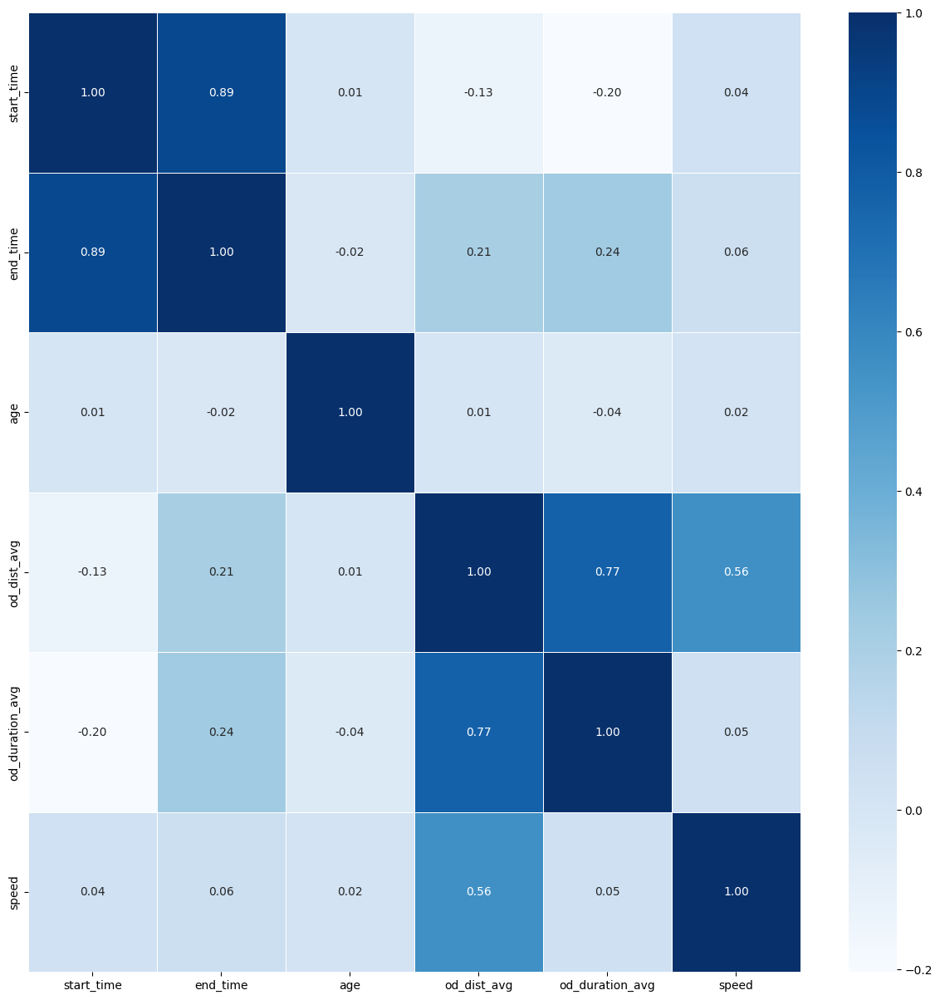

In [ ]:

num_features = ['start_time', 'end_time', 'age', 'od_dist_avg', 'od_duration_avg', 'speed']
# 수치형 변수만 사용
od_i_home_num = od_i_home[num_features]

plt.figure(figsize = (15, 15))
sns.heatmap(data = od_i_home_num.corr(), annot = True, fmt = '.2f', linewidths = .5, cmap = 'Blues')

###### shap value

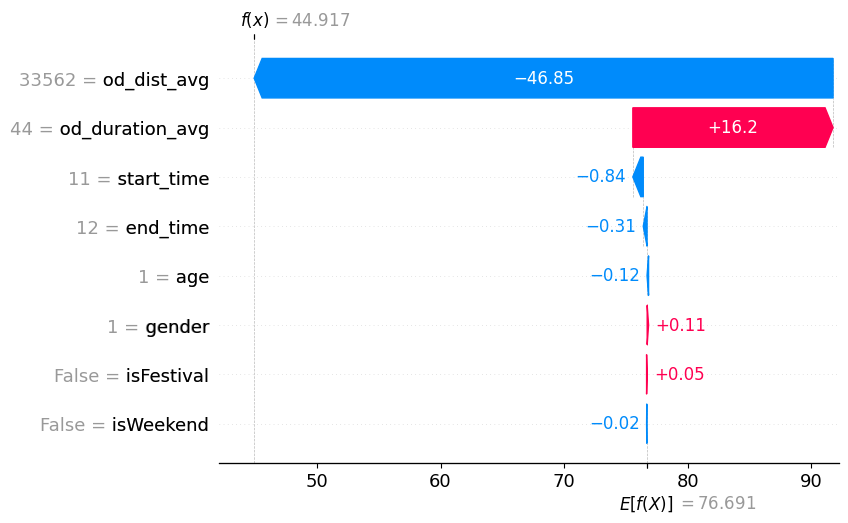

In [ ]:
import xgboost
import shap
# date는 category로 변경하기 애매함. 그래서 일단 제외
X = od_i_home.drop(columns = ['date', 'origin_hdong_cd', 'dest_hdong_cd', 'modal', 'origin_purpose', 'dest_purpose', 'od_cnts','speed'])
y = od_i_home.speed

model = xgboost.XGBRegressor().fit(X, y)

explainer = shap.Explainer(model)
shape_values = explainer(X)

shap.plots.waterfall(shape_values[0])


In [ ]:
shap.initjs()
shap.plots.force(shape_values[0])

###### feature importance

In [ ]:
model.feature_importances_

array([0.01249262, 0.00209159, 0.00307401, 0.00386973, 0.5788148 ,
       0.39672822, 0.00123723, 0.0016918 ], dtype=float32)

<Axes: title={'center': 'Feature Importance: gain'}, xlabel='F score', ylabel='Features'>

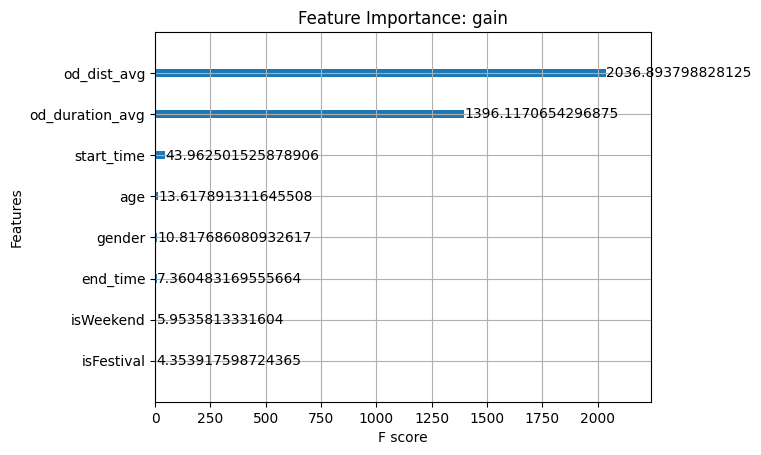

In [ ]:
xgboost.plot_importance(model, importance_type = 'gain', title = 'Feature Importance: gain')

###### PDP

In [ ]:
# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()
df_3 = od_home_3.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 2 week', width = 0.25)
data_2 = go.Bar(x = df_3['modal'], y = df_3['speed'], name = 'after 1 week', width = 0.25)

layout = go.Layout(title = '[임실] (귀가) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0, data_2], layout = layout)
fig.show()

##### 귀가 데이터 + 방문 데이터

In [ ]:
# 귀가 데이터
od_i_1 = od[(od.origin_hdong_cd == '4575034000')]
od_i_1 = od_i_1[(od_i_1.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_i_1.dest_purpose == '귀가')]
# 방문 데이터
od_i_2 = od[(od.dest_hdong_cd == '4575034000')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]

od_i = dd.concat([od_i_1, od_i_2]).compute()

In [ ]:
od_i['speed'] = (od_i.od_dist_avg * 60)/(od_i.od_duration_avg * 1000)
od_i.speed = od_i.speed.round(2)

od_home_1 = od_i[(od_i.date >= 20231006)&(od_i.date <= 20231009)]
od_home_2 = od_i[(od_i.date >= 20230929)&(od_i.date <= 20231002)]
od_home_3 = od_i[(od_i.date >= 20231013)&(od_i.date <= 20231015)]

In [ ]:
# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()
df_3 = od_home_3.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 1 week', width = 0.25)
data_2 = go.Bar(x = df_3['modal'], y = df_3['speed'], name = 'after 1 week', width = 0.25)

layout = go.Layout(title = '[임실] (귀가+방문) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0, data_2], layout = layout)
fig.show()

#### 날짜별 방문객 수

In [ ]:
od_i.date = od_i.date.astype('int')

In [ ]:
df = od_i.groupby('date').od_cnts.sum().reset_index()
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
fig = px.line(x = df.date, y = df.od_cnts, title = "날짜별 방문객 수")
fig.update_yaxes(tickformat = ',')
fig.add_vrect(x0="2023-10-06", x1="2023-10-09",
              annotation_text="축제기간", annotation_position="top left",
              annotation=dict(font_size=15),
              fillcolor="green", opacity=0.1, line_width=0)
fig.show()

#### 단일 변수 분포 확인

In [ ]:
# origin_hdong_cd
od_i_f.origin_hdong_cd.value_counts()

,count
origin_hdong_cd,
4.575025e+09,1047
4.511169e+09,69
4.511364e+09,64
4.511366e+09,52
4.511173e+09,40
...,...
2.771026e+09,1
4.513072e+09,1
4.825025e+09,1


In [ ]:
# dest_hdong_cd
od_i_f.dest_hdong_cd.value_counts()

,count
dest_hdong_cd,
4.575034e+09,2458


In [ ]:
od_i_f.date.value_counts()

,count
date,
20231008.0,962
20231007.0,620
20231009.0,546
20231006.0,330


In [ ]:
od_i_f.columns

Index(['origin_hdong_cd', 'dest_hdong_cd', 'date', 'start_time', 'end_time',
       'gender', 'age', 'modal', 'origin_purpose', 'dest_purpose',
       'od_dist_avg', 'od_duration_avg', 'od_cnts'],
      dtype='object')

In [ ]:
od_i_f.start_time.value_counts()

,count
start_time,
13:00,357
12:00,337
11:00,302
14:00,290
10:00,265
09:00,243
08:00,186
15:00,180
16:00,137


In [ ]:
od_i_f.end_time.value_counts()

,count
end_time,
14:00,370
15:00,348
13:00,344
12:00,329
11:00,263
16:00,256
10:00,164
17:00,129
18:00,89


In [ ]:
od_i_f.gender.value_counts()

,count
gender,
0.0,1685
1.0,773


In [ ]:
od_i_f.groupby('gender').od_cnts.sum()

,od_cnts
gender,
0.0,11008.0
1.0,6978.0


In [ ]:
od_i_f.age.value_counts()

,count
age,
3.0,1328
4.0,405
5.0,347
6.0,164
7.0,142
1.0,54
2.0,16
8.0,2


In [ ]:
od_i_f.modal.value_counts()

,count
modal,
0.0,2194
4.0,132
1.0,108
3.0,22
5.0,2


In [ ]:
od_i_f.origin_purpose.value_counts()

,count
origin_purpose,
0.0,988
4.0,843
5.0,529
1.0,58
3.0,38
2.0,1


In [ ]:
od_i_f.dest_purpose.value_counts()

,count
dest_purpose,
4.0,1673
5.0,710
1.0,59
0.0,15
3.0,1


In [ ]:
od_i_f.od_dist_avg.describe()

,od_dist_avg
count,2458.000000
mean,104290.030513
std,122009.095460
min,115.000000
25%,15727.000000
50%,69421.000000
75%,147570.000000
max,992086.000000


In [ ]:
od_i_f.od_duration_avg.describe()

,od_duration_avg
count,2458.000000
mean,77.511391
std,63.042673
min,1.000000
25%,24.000000
50%,64.000000
75%,115.000000
max,432.000000


In [ ]:
od_i_f.od_cnts.describe()

,od_cnts
count,2458.000000
mean,7.317331
std,3.967741
min,5.000000
25%,5.000000
50%,6.000000
75%,8.000000
max,45.000000


#### 축제 방문객 분석

##### 어느 지역에서 많이 왔나? Top5

In [ ]:
od_i_f.origin_hdong_cd = od_i_f.origin_hdong_cd.astype('int').astype('string')
df = od_i_f.groupby('origin_hdong_cd').od_cnts.sum().reset_index().sort_values(by = 'od_cnts', ascending = False).head()
fig = go.Figure(data = px.bar(x = df.origin_hdong_cd, y = df.od_cnts,title = '방문객 출발지 Top 5'))
fig.update_xaxes(title_text = "출발지")
fig.update_yaxes(title_text = "방문객 수", tickformat = ',')
fig.show()

<ipython-input-169-b7bef7c9e03b>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 방문객 이동수단

In [ ]:
df = od_i_f.groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df, values = 'od_cnts', names = 'modal', title = '방문객 이동수단')
fig.show()

##### 지역 내/외 방문 비율 비교

In [ ]:
df_in = od_i_f[od_i_f.origin_hdong_cd.str[:2] == '45'].od_cnts.sum()
df_out = od_i_f[od_i_f.origin_hdong_cd.str[:2] != '45'].od_cnts.sum()

fig = px.pie(values = [df_in, df_out], names = ['지역 내 방문', '지역 외 방문'], title = '지역 내/외 방문')
fig.show()

##### 지역 내 이동수단

In [ ]:
df_in = od_i_f[od_i_f.origin_hdong_cd.str[:2] == '45'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_in, values = 'od_cnts', names = 'modal', title = '지역 내 방문 이동수단')
fig.show()

##### 지역 외 이동수단

In [ ]:
df_out = od_i_f[od_i_f.origin_hdong_cd.str[:2] != '45'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_out, values = 'od_cnts', names = 'modal', title = '지역 외 방문 이동수단')
fig.show()

##### 성별, 나이대 구성 확인

In [ ]:
df = od_i_f.groupby(['gender', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]
data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '축제 방문객 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()



##### 나이대별 이동수단

In [ ]:
# 연령대별 이동수단
df = od_i_f.groupby(['modal', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.modal == 0]
df_1 = df[df.modal == 1]
df_2 = df[df.modal == 2]
df_3 = df[df.modal == 3]
df_4 = df[df.modal == 4]
df_5 = df[df.modal == 5]
df_6 = df[df.modal == 6]
df_7 = df[df.modal == 7]

data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '차량', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '시내버스', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '지하철', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '도보', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '철도', width = 0.3)
data_6 = go.Bar(x = df_6['age'], y = df_6['od_cnts'], name = '시외고속버스', width = 0.3)
data_7 = go.Bar(x = df_7['age'], y = df_7['od_cnts'], name = '항공기', width = 0.3)

layout = go.Layout(title = '연령대별 이동수단'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5, data_6, data_7], layout = layout)
fig.show()


##### 도착시간에 따른 방문객

In [ ]:
od_i_f.loc[:, 'start_time'] = od_i_f.start_time.str[:2]
od_i_f.loc[:, 'end_time'] = od_i_f.end_time.str[:2]
df = od_i_f.groupby('end_time').od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = "od_cnts", title = "도착시간별 방문객 수")
fig.show()

##### 나이대에 따른 도착시간

In [ ]:
df = od_i_f.groupby(['end_time', 'age']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'age', markers = True, title = '연령대별 도착시간')
fig.show()

##### 이동수단에 따른 도착시간

In [ ]:
df = od_i_f.groupby(['end_time', 'modal']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'modal', markers = True, title = '이동수단별 도착시간')
fig.show()

##### 출발 목적에 따른 도착시간

In [ ]:
df = od_i_f.groupby(['end_time', 'origin_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'origin_purpose', markers = True, title = '출발 목적별 도착시간')
fig.show()

##### 도착 목적에 따른 도착시간

In [ ]:
df = od_i_f.groupby(['end_time', 'dest_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'dest_purpose', markers = True, title = '도착 목적별 도착시간')
fig.show()

##### 나이대별 출발 목적

In [ ]:
df = od_i_f.groupby(['origin_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.origin_purpose == 0]
df_1 = df[df.origin_purpose == 1]
df_2 = df[df.origin_purpose == 2]
df_3 = df[df.origin_purpose == 3]
df_4 = df[df.origin_purpose == 4]
df_5 = df[df.origin_purpose == 5]


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '연령대별 출발목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()


##### 나이대별 도착목적

In [ ]:
df = od_i_f.groupby(['dest_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.dest_purpose == 0]
df_1 = df[df.dest_purpose == 1]
df_2 = df[df.dest_purpose == 2]
df_3 = df[df.dest_purpose == 3]
df_4 = df[df.dest_purpose == 4]
df_5 = df[df.dest_purpose == 5]


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '연령대별 도착목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()



##### 이동거리 - 이동시간

In [ ]:
px.scatter(data_frame = od_i_f, x = 'od_dist_avg', y = 'od_duration_avg', title = '이동거리-이동시간 분포')

##### 이동거리별 인원

In [ ]:
od_i_f.od_dist_avg = od_i_f.od_dist_avg.astype('int')
df = od_i_f.groupby('od_dist_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = df.od_dist_avg, y = df.od_cnts,title = '이동거리별 인원'))
# fig.update_xaxes(title_text = "출발지")
# fig.update_yaxes(title_text = "방문객 수")

fig.show()

<ipython-input-188-682e99866857>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 이동시간별 인원

In [ ]:
od_i_f.od_duration_avg = od_i_f.od_duration_avg.astype('int')
df = od_b_f.groupby('od_duration_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = round(df.od_duration_avg/60, 1), y = df.od_cnts,title = '이동시간별 인원 (단위: 시간)'))
# fig.update_xaxes(title_text = "출발지")
# fig.update_yaxes(title_text = "방문객 수")

fig.show()


<ipython-input-189-0f42b109dfff>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 축제 피크타임

In [ ]:
df = od_i_f.groupby('end_time').od_cnts.sum().reset_index()

fig = px.density_heatmap(data_frame = df, x = 'end_time', y = 'od_cnts', nbinsy = 50)
fig.show()

#### 이동속도

In [ ]:
# (축제 방문 인원) 출발지: 상관없음, 도착지: 축제 지역 행정동, 출발 목적: 상관없음, 도착목적: 기타/쇼핑여가/여행
# (축제 귀가 인원) 출발지: 축제 지역 행정동, 도착지: 상관없음, 출발 목적: 기타/쇼핑여가/여행, 도착 목적: 귀가
od_i_1 = od[(od.dest_hdong_cd == '4575034000')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_i_2 = od[(od.origin_hdong_cd == '4575034000')&(od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_i = dd.concat([od_i_1, od_i_2]).compute()

# 평균 이동속도 컬럼 추가
od_i['speed'] = (od_i.od_dist_avg * 60)/(od_i.od_duration_avg * 1000)
od_i.speed = od_i.speed.round(2)


In [ ]:
od_i.date = od_i.date.astype('string')

In [ ]:
# 주말 여부 컬럼 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5
od_i['isWeekend'] = od_i['date'].map(date_to_weekend)
od_i

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed,isWeekend
463291,4575025000,4575034000,20230901,8,9,0,7,시내버스,귀가,기타,30384.0,54.0,5.0,33.76,False
521106,4575025000,4575034000,20230901,17,17,0,3,기타,학업,기타,908.0,2.0,5.0,27.24,False
433555,4511366500,4575034000,20230901,11,12,0,3,차량,기타,기타,72899.0,43.0,5.0,101.72,False
500719,4575025000,4575034000,20230901,13,13,1,4,차량,기타,기타,4452.0,16.0,6.0,16.70,False
533970,4511364100,4575034000,20230901,17,19,0,3,차량,귀가,기타,119755.0,95.0,5.0,75.63,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
649349,4575034000,4373025000,20231015,15,18,1,3,차량,여행,귀가,177750.0,127.0,5.0,83.98,True
675750,4575034000,4511354000,20231015,17,17,0,3,차량,기타,귀가,53267.0,40.0,5.0,79.90,True
687251,4575034000,4577034000,20231015,15,16,1,2,차량,여행,여행,71232.0,30.0,5.0,142.46,True
689935,4575034000,4575032000,20231015,12,12,1,4,차량,기타,기타,85154.0,45.0,6.0,113.54,True


In [ ]:
od_i.date = od_i.date.astype('int')

In [ ]:
df_od_speed_modal = od_i.groupby(['isWeekend', 'modal']).speed.mean().reset_index()
df_od_speed_modal_2 = od_i[(od_i.date >= 20230908) & (od_i.date <= 20230910)].groupby(['isWeekend', 'modal']).speed.mean().reset_index()

In [ ]:
df_weekday = df_od_speed_modal[df_od_speed_modal.isWeekend == False]
df_weekend = df_od_speed_modal[df_od_speed_modal.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[임실] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df_weekday = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == False]
df_weekend = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[임실] 축제 기간 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

#### 귀가 데이터

In [ ]:
df_od = od[(od.origin_hdong_cd == '4575034000')].compute()
df_od_home = df_od[(df_od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(df_od.dest_purpose == '귀가')]
df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
df_od_home.speed = df_od_home.speed.round(2)



<ipython-input-117-604d5f1192b8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
<ipython-input-117-604d5f1192b8>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_od_home.speed = df_od_home.speed.round(2)


In [ ]:
import geopandas as gpd
file_name = 'data/map/emd.shp'
emd = gpd.read_file(file_name, encoding = 'cp949')
import geopandas as gpd
file_name = 'data/map/sig.shp'
sig = gpd.read_file(file_name, encoding = 'cp949')
emd_i = emd[emd.EMD_CD.str[:2] == '52']
emd_i['EMD_CD'] = emd_i['EMD_CD'] + '00'

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
df_od_home.value_counts('dest_hdong_cd').reset_index()

,dest_hdong_cd,count
0,4575025000,119
1,4511170100,100
2,4511356000,85
3,4511169200,56
4,4575038000,44
...,...,...
358,4374025000,1
359,4413158000,1
360,4418052500,1
361,4418053500,1


In [ ]:
emd_i[emd_i.EMD_KOR_NM.isin(['성수면'])]

,EMD_CD,EMD_ENG_NM,EMD_KOR_NM,geometry
4997,5272036000,Seongsu-myeon,성수면,"POLYGON ((980734.286 1755169.01, 980889.725 17..."
5019,5275034000,Seongsu-myeon,성수면,"POLYGON ((987944.602 1740481.526, 987965.955 1..."


In [ ]:
emd_i_gu = emd_i[emd_i.EMD_CD.str[:5].isin(['52750']) ]

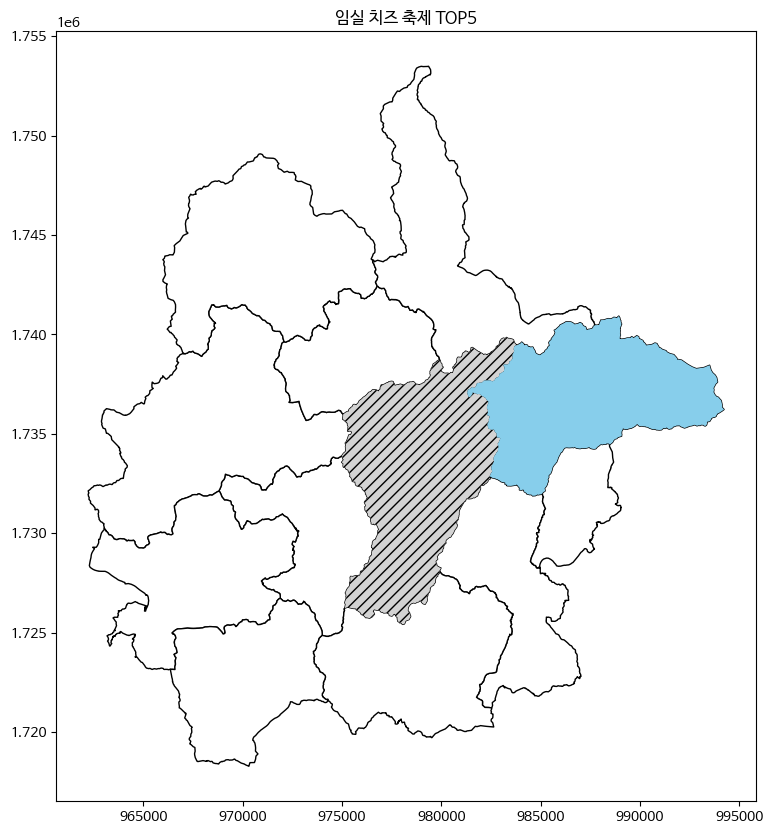

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10))
f_area = emd_i[emd_i.EMD_CD == '5275034000']
top5 = emd_i[emd_i.EMD_CD.isin([''])]
emd_i_gu.plot(ax = ax, color = 'white', edgecolor = 'black')
top5.plot(ax = ax, legend = True, color = 'lightgrey', hatch = '///')
f_area.plot(ax = ax, color = 'skyblue')

minx, miny, maxx, maxy = emd_d.total_bounds
# ax.set_xlim(minx, maxx)
# ax.set_ylim(miny, maxy)
plt.title('임실 치즈 축제 TOP5')
plt.show()

##### 이동속도

In [ ]:
df_od = od[(od.origin_hdong_cd == '4575034000')].compute()
df_od_home = df_od[(df_od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(df_od.dest_purpose == '귀가')]

df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
df_od_home.speed = df_od_home.speed.round(2)
df_od_home.head()

<ipython-input-92-d614f641a6da>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-92-d614f641a6da>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
401602,4575034000,4511359000,20230901,11,12,1,1,차량,기타,귀가,33562.0,44.0,6.0,45.77
107713,4575034000,4511170100,20230901,9,10,1,5,차량,기타,귀가,56541.0,64.0,7.0,53.01
108491,4575034000,4511170100,20230901,17,18,0,3,차량,기타,귀가,50632.0,43.0,8.0,70.65
121918,4575034000,4511165000,20230901,21,22,0,3,차량,기타,귀가,54482.0,56.0,9.0,58.37
220603,4575034000,4511170100,20230901,16,17,0,3,차량,기타,귀가,72910.0,64.0,8.0,68.35


In [ ]:
f_dates = ['20231006', '20231007', '20231008', '20231009']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
df_od_home['isFestival'] = df_od_home['date'].map(date_to_festival)


<ipython-input-93-0f80dd3eb1e5>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# 시간별 이동속도
df = df_od_home.groupby(['end_time', 'isFestival']).speed.mean().reset_index()

fig = px.line(df, x = 'end_time', y = 'speed', color = 'isFestival', markers = True, title = '시간별 이동속도')
fig.show()



In [ ]:
# 이동수단별 평균 속도
df_f = df_od_home[df_od_home.isFestival == True].groupby('modal').speed.mean().reset_index()
df_nf = df_od_home[df_od_home.isFestival == False].groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_f['modal'], y = df_f['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_nf['modal'], y = df_nf['speed'], name = 'non-festival', width = 0.25)


layout = go.Layout(title = '[임실] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df_od_home.groupby(['dest_hdong_cd']).od_cnts.sum().reset_index().sort_values('od_cnts', ascending = False)

,dest_hdong_cd,od_cnts
283,4575025000,1312.0
171,4511170100,937.0
182,4511356000,671.0
170,4511169200,477.0
180,4511354000,316.0
...,...,...
122,4311255000,5.0
124,4311332000,5.0
130,4374025000,5.0
134,4418052500,5.0


In [ ]:
# 이동수단별 평균 이동속도 비교
df = df_od_home.groupby('modal').speed.mean().reset_index()

bar = go.Bar(x = df.modal, y=df.speed, name = '이동속도', width = 0.3)
layout = go.Layout(title = '[임실] 귀가 이동수단별 평균 이동 속도 비교'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [bar], layout = layout)
fig.update_layout(yaxis_tickformat = ',')
fig.show()


In [ ]:
df_od_home.value_counts('modal')

,count
modal,
차량,1492
시내버스,111
철도,3
기타,2
도보,2


### stay

In [ ]:
stay_i = stay[stay.hdong_cd == 4575034000].compute()
stay_i_f = stay_i[(stay_i.date >= 20231006) & (stay_i.date <= 20231009)]

#### 단일 변수 분포 확인

In [ ]:
stay_i.hdong_cd.value_counts()

,count
hdong_cd,
4.575034e+09,29511


In [ ]:
stay_i.date = stay_i.date.astype('int')

In [ ]:
stay_i_f.date = stay_i_f.date.astype('int')

<ipython-input-193-7647f0f3aa01>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df = stay_i.groupby('date').stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = px.line(df, x = 'date', y = 'stay_cnts', title = '(전체) 날짜별 체류인구', markers = True)
fig.update_yaxes(tickformat=',')
fig.update_xaxes(nticks=50)
fig.add_vrect(x0="2023-10-06", x1="2023-10-09",
              annotation_text="축제기간", annotation_position="top left",
              annotation=dict(font_size=15),
              fillcolor="green", opacity=0.1, line_width=0)
fig.show()


In [ ]:
df = stay_i_f.groupby(['date']).stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = go.Figure(data = px.line(x = df.date , y = df.stay_cnts,title = '날짜별 체류인구', markers = True))
fig.update_xaxes(title_text = "date")
fig.update_yaxes(title_text = "stay_cnts")
fig.update_yaxes(tickformat=',')
fig.show()

In [ ]:
stay_i.time.value_counts()

,count
time,
12:00,2218
11:00,2211
13:00,2193
14:00,2160
10:00,2139
15:00,2103
09:00,2025
16:00,2010
08:00,1958


In [ ]:
stay_i.gender.value_counts()

,count
gender,
0.0,16162
1.0,13349


In [ ]:
stay_i.age.value_counts()

,count
age,
5.0,5111
4.0,4611
6.0,4579
3.0,4276
7.0,4009
8.0,2675
1.0,2152
2.0,1879
0.0,219


In [ ]:
stay_i.purpose.value_counts()

,count
purpose,
0.0,10129
4.0,9478
5.0,5553
1.0,4039
3.0,273
2.0,39


In [ ]:
stay_i.stay_cnts.describe()

,stay_cnts
count,29511.000000
mean,38.828403
std,54.906328
min,5.000000
25%,10.000000
50%,24.000000
75%,51.000000
max,1073.000000


#### 체류 인구 분석

##### 날짜별 체류인구

In [ ]:
df =stay_i_f.groupby(['date']).stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = go.Figure(data = px.line(x = df.date , y = df.stay_cnts,title = '날짜별 체류인구', markers = True))
fig.update_xaxes(title_text = "date")
fig.update_yaxes(title_text = "stay_cnts")
fig.update_yaxes(tickformat=',')
fig.show()

##### 날짜별 시간별 체류인구

In [ ]:
df = stay_i_f.groupby(['date', 'time']).stay_cnts.sum().reset_index()

fig = px.line(df, x = 'time', y = 'stay_cnts', color = 'date', markers = True, title = '날짜별 시간별 체류인구')
fig.show()


##### 성별, 연령대 구성 확인

In [ ]:
df = stay_i_f.groupby(['gender', 'age']).stay_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['stay_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '체류인구 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 날짜별 체류 목적

In [ ]:
df = stay_i_f.groupby(['date', 'purpose']).stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['date'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['date'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['date'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['date'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['date'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['date'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '날짜별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'date'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 시간별 체류 목적

In [ ]:
df = stay_i_f.groupby(['time', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['time'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['time'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['time'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['time'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['time'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['time'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '날짜별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'time'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 시간별 체류인구(주중/주말)

In [ ]:
stay_i_f['weekend'] = stay_i_f['date'].apply(lambda x: 'weekend' if (x == 20231007)|(x == 20231008) else 'weekday')
df = stay_i_f.groupby(['weekend', 'time']).stay_cnts.sum().reset_index()

fig = px.line(df, x = 'time', y = 'stay_cnts', color = 'weekend', markers = True, title = '시간별 체류인구(주중/주말 구분)')
fig.update_yaxes(tickformat = ',')
fig.show()


<ipython-input-178-9216c456b8c1>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 연령대별 체류 목적

In [ ]:
df = stay_i_f.groupby(['age', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['age'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['age'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['age'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['age'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['age'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '연령대별 체류 목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


## 서울

### OD

In [ ]:
od_s = od[od.dest_hdong_cd == 1156054000].compute()

In [ ]:
od_s_f = od_s[(od_s.date == 20231007)]

In [ ]:
od_s_f.isna().sum()

,0
origin_hdong_cd,0
dest_hdong_cd,0
date,0
start_time,0
end_time,0
gender,0
age,0
modal,0
origin_purpose,5
dest_purpose,0


#### 축제기간 전, 후 이동속도 비교

##### 귀가 데이터

In [ ]:
od_s = od[od.origin_hdong_cd == '1156054000'].compute()


<ipython-input-107-4b151dd4bf2e>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-107-4b151dd4bf2e>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_s_home = od_s[(od_s.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_s.dest_purpose == '귀가')]
od_s_home['speed'] = (od_s_home.od_dist_avg * 60)/(od_s_home.od_duration_avg * 1000)
od_s_home.speed = od_s_home.speed.round(2)

<ipython-input-121-47a3bb8a131c>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-121-47a3bb8a131c>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# **2주 전 먼저 시각화 한 다음에 요인 분석 해야 함**
od_home_1 = od_s_home[(od_s_home.date == 20231007)]
od_home_2 = od_s_home[(od_s_home.date == 20230923)]
od_home_3 = od_s_home[(od_s_home.date == 20231013)]

In [ ]:
unique_dates = od_s_home.date.unique()

In [ ]:
od_s_home.date = od_s_home.date.astype('string')

<ipython-input-114-25260e855116>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# isFestival 추가
f_dates = ['20231007']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
od_s_home['isFestival'] = od_s_home['date'].map(date_to_festival)

# isWeekend 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5

od_s_home['isWeekend'] = od_s_home['date'].map(date_to_weekend)

<ipython-input-122-947958a21c0f>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-122-947958a21c0f>:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:

# 데이터 타입 변경
od_s_home.gender = od_s_home.gender.astype('bool')
od_s_home.modal = od_s_home.modal.astype('category')
od_s_home.origin_purpose = od_s_home.origin_purpose.astype('category')
od_s_home.dest_purspoe = od_s_home.dest_purpose.astype('category')

<ipython-input-123-af6ace734b9a>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-123-af6ace734b9a>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-123-af6ace734b9a>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-123-af6

<Axes: >

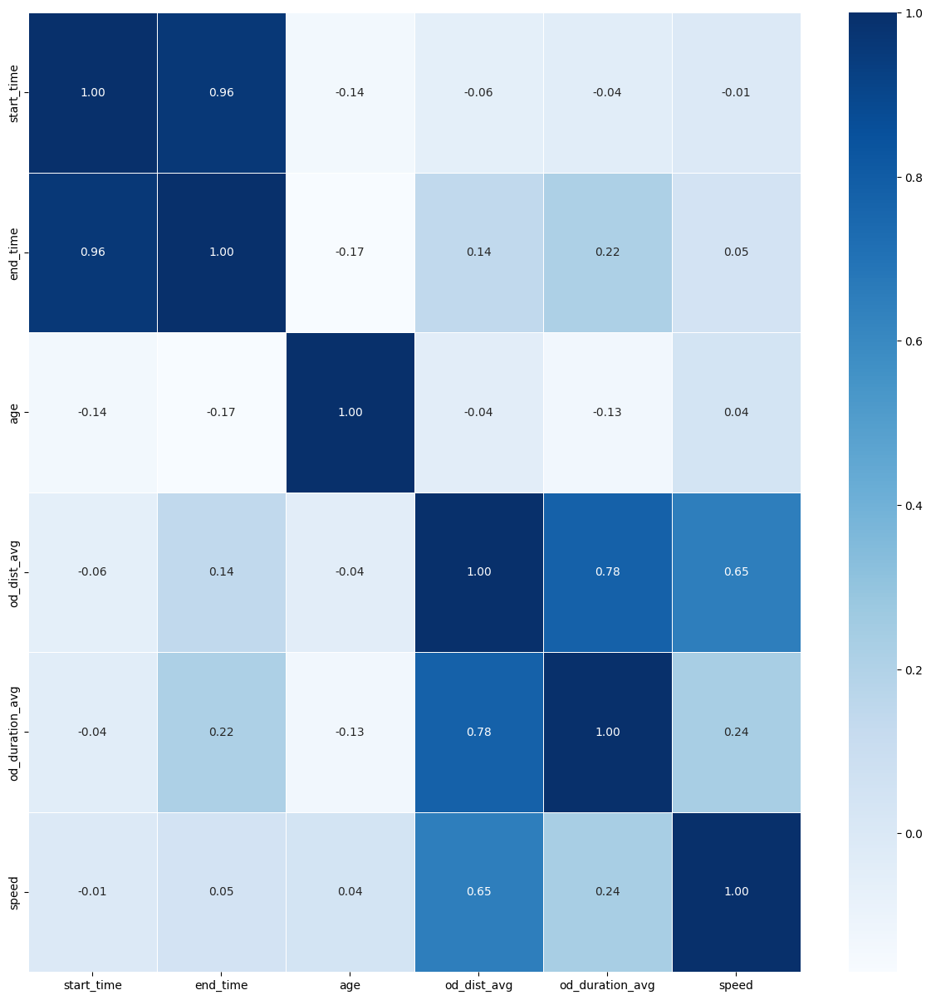

In [ ]:

num_features = ['start_time', 'end_time', 'age', 'od_dist_avg', 'od_duration_avg', 'speed']
# 수치형 변수만 사용
od_s_home_num = od_s_home[num_features]

plt.figure(figsize = (15, 15))
sns.heatmap(data = od_s_home_num.corr(), annot = True, fmt = '.2f', linewidths = .5, cmap = 'Blues')


In [ ]:
od_s_home

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed,isFestival,isWeekend
13179,1156054000,4623036000,20230901,17,22,True,2,차량,여행,귀가,866133.0,322.0,15.0,161.39,NaN,NaN
14170,1156054000,1156066000,20230901,14,15,True,5,차량,쇼핑여가,귀가,40629.0,61.0,7.0,39.96,NaN,NaN
15546,1156054000,4117353000,20230901,20,23,True,2,차량,쇼핑여가,귀가,159282.0,167.0,8.0,57.23,NaN,NaN
21529,1156054000,1156058500,20230901,15,17,True,5,차량,쇼핑여가,귀가,50309.0,84.0,8.0,35.94,NaN,NaN
21965,1156054000,1159067000,20230901,18,19,False,5,차량,쇼핑여가,귀가,33149.0,51.0,9.0,39.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708578,1156054000,2823758100,20231015,14,15,True,1,차량,여행,귀가,35586.0,60.0,5.0,35.59,NaN,NaN
709176,1156054000,4139052000,20231015,21,23,True,2,차량,여행,귀가,90806.0,126.0,5.0,43.24,NaN,NaN
709688,1156054000,1147062000,20231015,17,20,True,1,차량,쇼핑여가,귀가,164178.0,172.0,5.0,57.27,NaN,NaN
710559,1156054000,4139052000,20231015,21,22,False,2,차량,기타,귀가,87742.0,99.0,5.0,53.18,NaN,NaN


In [ ]:
od_s_home.isFestival = od_s_home.isFestival.astype('bool')
od_s_home.isWeekend = od_s_home.isWeekend.astype('bool')

<ipython-input-127-661579dba38f>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-127-661579dba38f>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



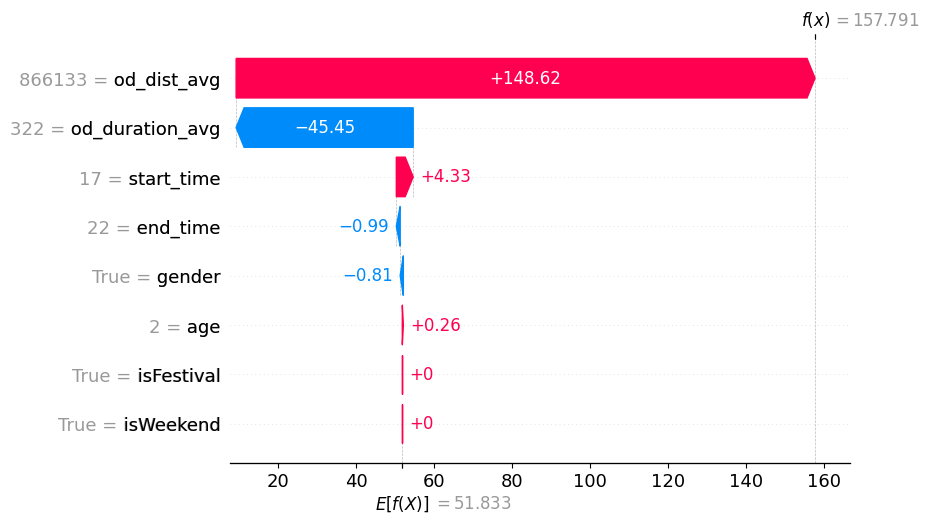

In [ ]:

import xgboost
import shap
# date는 category로 변경하기 애매함. 그래서 일단 제외
X = od_s_home.drop(columns = ['date', 'origin_hdong_cd', 'dest_hdong_cd', 'modal', 'origin_purpose', 'dest_purpose', 'od_cnts','speed'])
y = od_s_home.speed

model = xgboost.XGBRegressor().fit(X, y)

explainer = shap.Explainer(model)
shape_values = explainer(X)

shap.plots.waterfall(shape_values[0])

In [ ]:
shap.initjs()
shap.plots.force(shape_values[0])

In [ ]:
model.feature_importances_

array([0.00315005, 0.00450278, 0.00173579, 0.00249628, 0.62856394,
       0.3595511 , 0.        , 0.        ], dtype=float32)

<Axes: title={'center': 'Feature Importance: gain'}, xlabel='F score', ylabel='Features'>

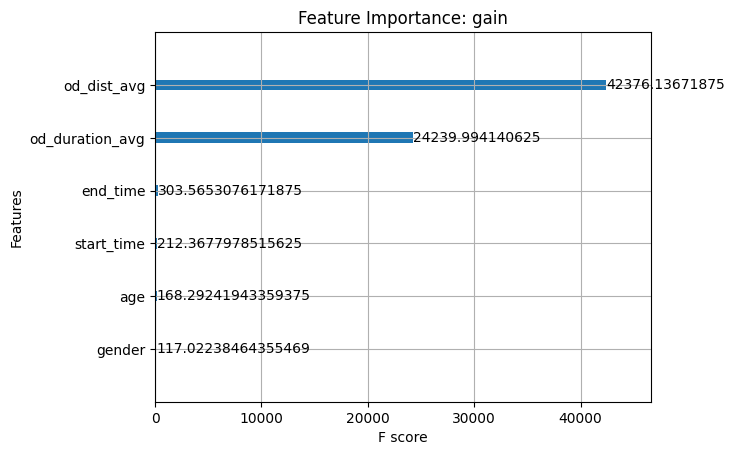

In [ ]:
xgboost.plot_importance(model, importance_type = 'gain', title = 'Feature Importance: gain')

In [ ]:
# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()
df_3 = od_home_3.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 2 week', width = 0.25)
data_2 = go.Bar(x = df_3['modal'], y = df_3['speed'], name = 'after 1 week', width = 0.25)

layout = go.Layout(title = '[서울] (귀가) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0, data_2], layout = layout)
fig.show()

##### 귀가 데이터 + 방문 데이터

In [ ]:
# 귀가 데이터
od_s_1 = od[(od.origin_hdong_cd == '1156054000')]
od_s_1 = od_s_1[(od_s_1.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_s_1.dest_purpose == '귀가')]
# 방문 데이터
od_s_2 = od[(od.dest_hdong_cd == '1156054000')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]

od_s = dd.concat([od_s_1, od_s_2]).compute()

In [ ]:
od_s['speed'] = (od_s.od_dist_avg * 60)/(od_s.od_duration_avg * 1000)
od_s.speed = od_s.speed.round(2)

od_home_1 = od_s[(od_s.date == 20231007)]
od_home_2 = od_s[(od_s.date == 20230930)]
od_home_3 = od_s[(od_s.date == 20231013)]

In [ ]:

# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()
df_3 = od_home_3.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 1 week', width = 0.25)
data_2 = go.Bar(x = df_3['modal'], y = df_3['speed'], name = 'after 1 week', width = 0.25)

layout = go.Layout(title = '[서울] (귀가+방문) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0, data_2], layout = layout)
fig.show()

#### 날짜별 방문객 수

In [ ]:
od_s.date = od_s.date.astype('int')

In [ ]:
df = od_s.groupby('date').od_cnts.sum().reset_index()
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))
fig = px.line(x = df.date, y = df.od_cnts, title = "날짜별 방문객 수")
fig.update_yaxes(tickformat = ',')
fig.add_vrect(x0="2023-10-07", x1="2023-10-07",
              annotation_text="축제기간", annotation_position="top left",
              annotation=dict(font_size=15),
              fillcolor="green", opacity=0.1, line_width=0)
fig.show()

#### 단일 변수 분포 확인

In [ ]:
# origin_hdong_cd
od_s_f.origin_hdong_cd.value_counts()

,count
origin_hdong_cd,
1.156054e+09,487
1.144066e+09,269
1.156056e+09,250
1.159051e+09,212
1.144059e+09,137
...,...
4.688032e+09,1
1.135072e+09,1
1.171056e+09,1


In [ ]:
# dest_hdong_cd
od_s_f.dest_hdong_cd.value_counts()

,count
dest_hdong_cd,
1.156054e+09,6139


In [ ]:
od_s_f.date.value_counts()

,count
date,
20231007.0,6139


In [ ]:
od_s_f.columns

Index(['origin_hdong_cd', 'dest_hdong_cd', 'date', 'start_time', 'end_time',
       'gender', 'age', 'modal', 'origin_purpose', 'dest_purpose',
       'od_dist_avg', 'od_duration_avg', 'od_cnts'],
      dtype='object')

In [ ]:
od_s_f.start_time.value_counts()

,count
start_time,
17:00,888
18:00,880
16:00,854
15:00,677
14:00,588
13:00,454
12:00,395
19:00,319
11:00,296


In [ ]:
od_s_f.end_time.value_counts()

,count
end_time,
19:00,1126
18:00,1080
17:00,774
16:00,671
15:00,511
14:00,443
13:00,349
12:00,278
11:00,227


In [ ]:
od_s_f.gender.value_counts()

,count
gender,
1.0,3306
0.0,2833


In [ ]:
od_s_f.groupby('gender').od_cnts.sum()

,od_cnts
gender,
0.0,31515.0
1.0,33284.0


In [ ]:
od_s_f.age.value_counts()

,count
age,
0.0,1610
1.0,1518
2.0,1435
3.0,1105
4.0,339
5.0,103
6.0,20
7.0,9


In [ ]:
od_s_f.modal.value_counts()

,count
modal,
0.0,4092
2.0,1441
1.0,396
4.0,132
5.0,58
3.0,19
7.0,1


In [ ]:
od_s_f.origin_purpose.value_counts()

,count
origin_purpose,
0.0,3917
5.0,809
3.0,779
4.0,591
2.0,20
1.0,18


In [ ]:
od_i_f.dest_purpose.value_counts()

,count
dest_purpose,
4.0,1673
5.0,710
1.0,59
0.0,15
3.0,1


In [ ]:
od_s_f.od_dist_avg.describe()

,od_dist_avg
count,6139.000000
mean,48988.679264
std,57445.632521
min,246.000000
25%,18115.500000
50%,34178.000000
75%,60637.000000
max,748355.000000


In [ ]:
od_s_f.od_duration_avg.describe()

,od_duration_avg
count,6139.000000
mean,68.041212
std,46.512226
min,1.000000
25%,37.000000
50%,60.000000
75%,90.000000
max,447.000000


In [ ]:
od_s_f.od_cnts.describe()

,od_cnts
count,6139.000000
mean,10.555302
std,7.647666
min,5.000000
25%,5.000000
50%,6.000000
75%,19.000000
max,57.000000


#### 축제 방문객 분석

##### 어느 지역에서 많이 왔나? Top5

In [ ]:
od_s_f.origin_hdong_cd = od_s_f.origin_hdong_cd.astype('int').astype('string')
df = od_s_f.groupby('origin_hdong_cd').od_cnts.sum().reset_index().sort_values(by = 'od_cnts', ascending = False).head()
fig = go.Figure(data = px.bar(x = df.origin_hdong_cd, y = df.od_cnts,title = '방문객 출발지 Top 5'))
fig.update_xaxes(title_text = "출발지")
fig.update_yaxes(title_text = "방문객 수", tickformat = ',')
fig.show()

<ipython-input-201-d1b87d7f45a5>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 방문객 이동수단

In [ ]:
df = od_s_f.groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df, values = 'od_cnts', names = 'modal', title = '방문객 이동수단')
fig.show()

##### 지역 내/외 방문 비율 비교

In [ ]:
df_in = od_s_f[od_s_f.origin_hdong_cd.str[:2] == '11'].od_cnts.sum()
df_out = od_s_f[od_s_f.origin_hdong_cd.str[:2] != '11'].od_cnts.sum()

fig = px.pie(values = [df_in, df_out], names = ['지역 내 방문', '지역 외 방문'], title = '지역 내/외 방문')
fig.show()

##### 지역 내 이동수단

In [ ]:
df_in = od_s_f[od_s_f.origin_hdong_cd.str[:2] == '11'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_in, values = 'od_cnts', names = 'modal', title = '지역 내 방문 이동수단')
fig.show()

##### 지역 외 이동수단

In [ ]:
df_out = od_s_f[od_s_f.origin_hdong_cd.str[:2] != '11'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_out, values = 'od_cnts', names = 'modal', title = '지역 외 방문 이동수단')
fig.show()

##### 성별, 나이대 구성 확인

In [ ]:
df = od_s_f.groupby(['gender', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]
data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '축제 방문객 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()



##### 나이대별 이동수단

In [ ]:
# 연령대별 이동수단
df = od_s_f.groupby(['modal', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.modal == 0]
df_1 = df[df.modal == 1]
df_2 = df[df.modal == 2]
df_3 = df[df.modal == 3]
df_4 = df[df.modal == 4]
df_5 = df[df.modal == 5]
df_6 = df[df.modal == 6]
df_7 = df[df.modal == 7]

data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '차량', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '시내버스', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '지하철', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '도보', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '철도', width = 0.3)
data_6 = go.Bar(x = df_6['age'], y = df_6['od_cnts'], name = '시외고속버스', width = 0.3)
data_7 = go.Bar(x = df_7['age'], y = df_7['od_cnts'], name = '항공기', width = 0.3)

layout = go.Layout(title = '연령대별 이동수단'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5, data_6, data_7], layout = layout)
fig.show()


##### 도착시간에 따른 방문객

In [ ]:
od_s_f.loc[:, 'start_time'] = od_s_f.start_time.str[:2]
od_s_f.loc[:, 'end_time'] = od_s_f.end_time.str[:2]
df = od_s_f.groupby('end_time').od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = "od_cnts", title = "도착시간별 방문객 수")
fig.show()

##### 나이대에 따른 도착시간

In [ ]:
df = od_s_f.groupby(['end_time', 'age']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'age', markers = True, title = '연령대별 도착시간')
fig.show()

##### 이동수단에 따른 도착시간

In [ ]:
df = od_s_f.groupby(['end_time', 'modal']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'modal', markers = True, title = '이동수단별 도착시간')
fig.show()

##### 출발 목적에 따른 도착시간

In [ ]:
df = od_s_f.groupby(['end_time', 'origin_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'origin_purpose', markers = True, title = '출발 목적별 도착시간')
fig.show()

##### 도착 목적에 따른 도착시간

In [ ]:
df = od_s_f.groupby(['end_time', 'dest_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'dest_purpose', markers = True, title = '도착 목적별 도착시간')
fig.show()

##### 나이대별 출발 목적

In [ ]:
df = od_s_f.groupby(['origin_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.origin_purpose == 0]
df_1 = df[df.origin_purpose == 1]
df_2 = df[df.origin_purpose == 2]
df_3 = df[df.origin_purpose == 3]
df_4 = df[df.origin_purpose == 4]
df_5 = df[df.origin_purpose == 5]


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '연령대별 출발목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()


##### 나이대별 도착목적

In [ ]:
df = od_s_f.groupby(['dest_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.dest_purpose == 0]
df_1 = df[df.dest_purpose == 1]
df_2 = df[df.dest_purpose == 2]
df_3 = df[df.dest_purpose == 3]
df_4 = df[df.dest_purpose == 4]
df_5 = df[df.dest_purpose == 5]


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '연령대별 도착목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()



##### 이동거리 - 이동시간

In [ ]:
px.scatter(data_frame = od_s_f, x = 'od_dist_avg', y = 'od_duration_avg', title = '이동거리-이동시간 분포')

##### 이동거리별 인원

In [ ]:
od_s_f.od_dist_avg = od_s_f.od_dist_avg.astype('int')
df = od_s_f.groupby('od_dist_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = df.od_dist_avg, y = df.od_cnts,title = '이동거리별 인원'))
# fig.update_xaxes(title_text = "출발지")
# fig.update_yaxes(title_text = "방문객 수")

fig.show()

<ipython-input-64-6c9782de0f6e>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 이동시간별 인원

In [ ]:
od_s_f.od_duration_avg = od_s_f.od_duration_avg.astype('int')
df = od_s_f.groupby('od_duration_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = round(df.od_duration_avg/60, 1), y = df.od_cnts,title = '이동시간별 인원 (단위: 시간)'))
# fig.update_xaxes(title_text = "출발지")
# fig.update_yaxes(title_text = "방문객 수")

fig.show()


<ipython-input-66-f322d0058690>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 축제 피크타임

In [ ]:
df = od_s_f.groupby('end_time').od_cnts.sum().reset_index()

fig = px.density_heatmap(data_frame = df, x = 'end_time', y = 'od_cnts', nbinsy = 50)
fig.show()

#### 이동속도

In [ ]:
# (축제 방문 인원) 출발지: 상관없음, 도착지: 축제 지역 행정동, 출발 목적: 상관없음, 도착목적: 기타/쇼핑여가/여행
# (축제 귀가 인원) 출발지: 축제 지역 행정동, 도착지: 상관없음, 출발 목적: 기타/쇼핑여가/여행, 도착 목적: 귀가
od_s_1 = od[(od.dest_hdong_cd == '1156054000')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_s_2 = od[(od.origin_hdong_cd == '1156054000')&(od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_s = dd.concat([od_s_1, od_s_2]).compute()

# 평균 이동속도 컬럼 추가
od_s['speed'] = (od_s.od_dist_avg * 60)/(od_s.od_duration_avg * 1000)
od_s.speed = od_s.speed.round(2)

In [ ]:
od_s.date = od_s.date.astype('string')

# 주말 여부 컬럼 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5
od_s['isWeekend'] = od_s['date'].map(date_to_weekend)

od_s.date = od_s.date.astype('int')

# 시각화를 위한 데이터 준비
df_od_speed_modal = od_s.groupby(['isWeekend', 'modal']).speed.mean().reset_index()
df_od_speed_modal_2 = od_s[(od_s.date == 20230907)].groupby(['isWeekend', 'modal']).speed.mean().reset_index()

In [ ]:
df_weekday = df_od_speed_modal[df_od_speed_modal.isWeekend == False]
df_weekend = df_od_speed_modal[df_od_speed_modal.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[서울] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df_weekday = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == False]
df_weekend = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[서울] 축제 기간 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

#### 귀가 데이터

In [ ]:
df_od = od[(od.origin_hdong_cd == '1156054000')].compute()
df_od_home = df_od[(df_od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(df_od.dest_purpose == '귀가')]
df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
df_od_home.speed = df_od_home.speed.round(2)

<ipython-input-137-e6503407d042>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
<ipython-input-137-e6503407d042>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_od_home.speed = df_od_home.speed.round(2)


In [ ]:
import geopandas as gpd
file_name = 'data/map/emd.shp'
emd = gpd.read_file(file_name, encoding = 'cp949')
import geopandas as gpd
file_name = 'data/map/sig.shp'
sig = gpd.read_file(file_name, encoding = 'cp949')
emd_s = emd[emd.EMD_CD.str[:2] == '11']
emd_s['EMD_CD'] = emd_s['EMD_CD'] + '00'

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
df_od_home.value_counts('dest_hdong_cd').reset_index()

,dest_hdong_cd,count
0,1156066000,2937
1,1159060500,2290
2,1156051500,1833
3,1159066000,1823
4,1156056000,1640
...,...,...
1744,4477025300,1
1745,4477025000,1
1746,2915570000,1
1747,4129051500,1


In [ ]:
emd_s[emd_s.EMD_KOR_NM.isin(['신길동', '흑성동', '영등포동', '신길동', '대방동', '당산동4가', '당산동5가', '당산동6가', '당산동' ])]

,EMD_CD,EMD_ENG_NM,EMD_KOR_NM,geometry
375,1156010100,Yeongdeungpo-dong,영등포동,"POLYGON ((948340.165 1946572.775, 948319.579 1..."
388,1156011400,Dangsan-dong 4(sa)-ga,당산동4가,"POLYGON ((947231.269 1947575.041, 947230.965 1..."
389,1156011500,Dangsan-dong 5(o)-ga,당산동5가,"POLYGON ((946908.499 1948613.002, 946920.159 1..."
390,1156011600,Dangsan-dong 6(yuk)-ga,당산동6가,"POLYGON ((947049.315 1948853.17, 947057.122 19..."
391,1156011700,Dangsan-dong,당산동,"POLYGON ((947100.859 1948808.911, 947104.811 1..."
406,1156013200,Singil-dong,신길동,"POLYGON ((948588.845 1946726.963, 948633.641 1..."
416,1159010800,Daebang-dong,대방동,"POLYGON ((949350.581 1946405.136, 949425.246 1..."


<ipython-input-143-81db1a37290b>:6: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  f_area.plot(ax = ax, color = 'skyblue')


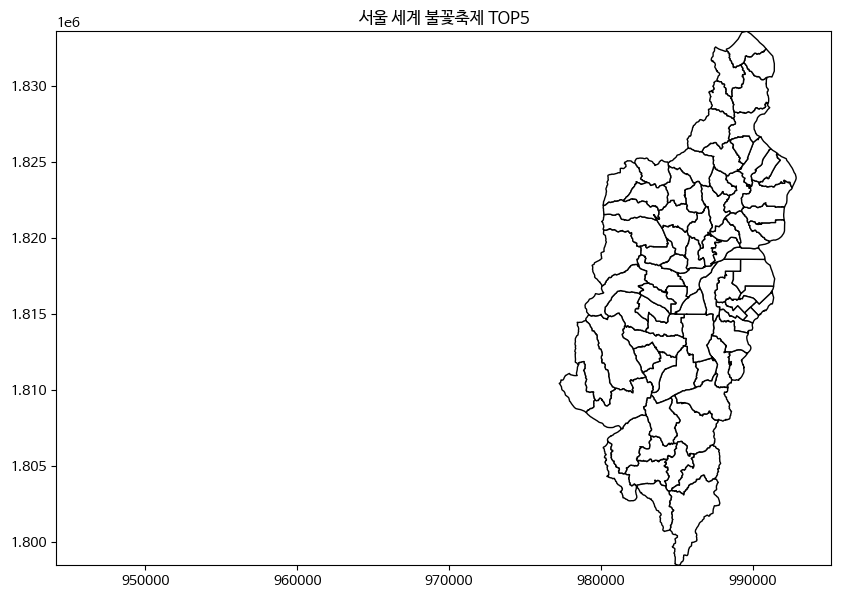

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10))
f_area = emd_s[emd_s.EMD_CD == '1156054000']
top5 = emd_s[emd_s.EMD_CD.isin(['1156010100', '1156011400', '1156011500', '1156011600', '1156011700', '1156013200', '1159010800'])]
emd_d_gu.plot(ax = ax, color = 'white', edgecolor = 'black')
top5.plot(ax = ax, legend = True, color = 'lightgrey', hatch = '///')
f_area.plot(ax = ax, color = 'skyblue')

minx, miny, maxx, maxy = emd_d.total_bounds

ax.set_ylim(miny, maxy)
plt.title('서울 세계 불꽃축제 TOP5')
plt.show()

##### 이동속도

In [ ]:
df_od = od[(od.origin_hdong_cd == '1156054000')].compute()
df_od_home = df_od[(df_od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(df_od.dest_purpose == '귀가')]
df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
df_od_home.speed = df_od_home.speed.round(2)
df_od_home.head()

<ipython-input-96-32dc6423e660>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-96-32dc6423e660>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
13179,1156054000,4623036000,20230901,17,22,1,2,차량,여행,귀가,866133.0,322.0,15.0,161.39
14170,1156054000,1156066000,20230901,14,15,1,5,차량,쇼핑여가,귀가,40629.0,61.0,7.0,39.96
15546,1156054000,4117353000,20230901,20,23,1,2,차량,쇼핑여가,귀가,159282.0,167.0,8.0,57.23
21529,1156054000,1156058500,20230901,15,17,1,5,차량,쇼핑여가,귀가,50309.0,84.0,8.0,35.94
21965,1156054000,1159067000,20230901,18,19,0,5,차량,쇼핑여가,귀가,33149.0,51.0,9.0,39.00


In [ ]:
df_od_home.groupby(['dest_hdong_cd']).od_cnts.sum().reset_index().sort_values('od_cnts', ascending = False)

,dest_hdong_cd,od_cnts
292,1156066000,20484.0
305,1159060500,13908.0
282,1156051500,13276.0
311,1159066000,13038.0
285,1156056000,12116.0
...,...,...
1622,4812565000,5.0
1623,4812725000,5.0
1289,4311377000,5.0
1286,4311375100,5.0


In [ ]:
f_dates = ['20231007']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
df_od_home['isFestival'] = df_od_home['date'].map(date_to_festival)


<ipython-input-97-56c24914b507>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# 시간별 이동속도
df = df_od_home.groupby(['end_time', 'isFestival']).speed.mean().reset_index()

fig = px.line(df, x = 'end_time', y = 'speed', color = 'isFestival', markers = True, title = '시간별 이동속도')
fig.show()



In [ ]:
# 이동수단별 평균 속도
df_f = df_od_home[df_od_home.isFestival == True].groupby('modal').speed.mean().reset_index()
df_nf = df_od_home[df_od_home.isFestival == False].groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_f['modal'], y = df_f['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_nf['modal'], y = df_nf['speed'], name = 'non-festival', width = 0.25)


layout = go.Layout(title = '[서울] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
# 이동수단별 평균 이동속도 비교
df = df_od_home.groupby('modal').speed.mean().reset_index()

bar = go.Bar(x = df.modal, y=df.speed, name = '이동속도', width = 0.3)
layout = go.Layout(title = '[서울] 귀가 이동수단별 평균 이동 속도 비교'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [bar], layout = layout)
fig.update_layout(yaxis_tickformat = ',')
fig.show()



In [ ]:
df_od_home.value_counts('modal')

,count
modal,
차량,58294
지하철,18069
시내버스,7981
철도,832
기타,572
도보,161
항공기,54


### stay

In [ ]:
stay_s = stay[stay.hdong_cd == 1156054000].compute()
stay_s_f = stay_s[(stay_s.date == 20231007)]

In [ ]:
stay_s_f.head()

,hdong_cd,date,time,gender,age,purpose,stay_cnts
1034711,1.156054e+09,2023-10-07,19:00,0.0,0.0,4.0,5317.0
1034987,1.156054e+09,2023-10-07,13:00,0.0,1.0,5.0,2039.0
1035143,1.156054e+09,2023-10-07,18:00,1.0,5.0,0.0,2435.0
1035154,1.156054e+09,2023-10-07,18:00,1.0,3.0,0.0,2547.0
1035330,1.156054e+09,2023-10-07,18:00,0.0,3.0,0.0,1936.0


In [ ]:
stay_s_f.date = stay_s_f['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

<ipython-input-97-646c26ca89bd>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### 단일 변수 분포 확인

In [ ]:
stay_s.hdong_cd.value_counts()

,count
hdong_cd,
1.156054e+09,64954


In [ ]:
stay_s.date = stay_s.date.astype('int')

In [ ]:
stay_s_f.date = stay_s_f.date.astype('int')

<ipython-input-208-063af1e5c7bf>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df = stay_s.groupby('date').stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = px.line(df, x = 'date', y = 'stay_cnts', title = '(전체) 날짜별 체류인구', markers = True)
fig.add_vrect(x0="2023-10-07", x1="2023-10-07",
              annotation_text="축제기간", annotation_position="top left",
              annotation=dict(font_size=15),
              fillcolor="green", opacity=0.1, line_width=0)
fig.update_yaxes(tickformat=',')
fig.update_xaxes(nticks=50)
fig.show()


In [ ]:
stay_s.time.value_counts()

,count
time,
14:00,4250
16:00,4249
15:00,4248
13:00,4243
12:00,4243
17:00,4238
11:00,4231
18:00,4213
10:00,4201


In [ ]:
stay_s.gender.value_counts()

,count
gender,
1.0,32573
0.0,32381


In [ ]:
stay_s.age.value_counts()

,count
age,
2.0,8434
1.0,7913
3.0,7822
4.0,7020
5.0,7020
6.0,7020
7.0,6977
8.0,6682
0.0,6066


In [ ]:
stay_s.purpose.value_counts()

,count
purpose,
0.0,12960
4.0,12935
5.0,12817
3.0,11094
1.0,10782
2.0,4366


In [ ]:
stay_s.stay_cnts.describe()

,stay_cnts
count,64954.000000
mean,1087.179312
std,1949.565852
min,5.000000
25%,124.000000
50%,516.000000
75%,1371.000000
max,16421.000000


#### 체류 인구 분석

##### 날짜별 체류인구

In [ ]:
stay_s_f.date = stay_s_f.date.astype('int')

<ipython-input-86-063af1e5c7bf>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
stay_s_f.head()

,hdong_cd,date,time,gender,age,purpose,stay_cnts
1034711,1.156054e+09,2023-10-07,19:00,0.0,0.0,4.0,5317.0
1034987,1.156054e+09,2023-10-07,13:00,0.0,1.0,5.0,2039.0
1035143,1.156054e+09,2023-10-07,18:00,1.0,5.0,0.0,2435.0
1035154,1.156054e+09,2023-10-07,18:00,1.0,3.0,0.0,2547.0
1035330,1.156054e+09,2023-10-07,18:00,0.0,3.0,0.0,1936.0


##### 날짜별 시간별 체류인구

In [ ]:
df = stay_s_f.groupby(['date', 'time']).stay_cnts.sum().reset_index()

fig = px.line(df, x = 'time', y = 'stay_cnts', color = 'date', markers = True, title = '시간별 체류인구')
fig.show()


##### 성별, 연령대 구성 확인

In [ ]:
df = stay_s_f.groupby(['gender', 'age']).stay_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['stay_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '체류인구 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 체류 목적

In [ ]:
df = stay_s_f.groupby(['date', 'purpose']).stay_cnts.sum().reset_index()
# df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['date'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['date'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['date'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['date'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['date'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['date'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '날짜별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'date'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()

##### 시간별 체류 목적

In [ ]:
df = stay_s_f.groupby(['time', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['time'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['time'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['time'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['time'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['time'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['time'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '시간별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'time'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 연령대별 체류 목적

In [ ]:
df = stay_s_f.groupby(['age', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == 0]
df_1 = df[df.purpose == 1]
df_2 = df[df.purpose == 2]
df_3 = df[df.purpose == 3]
df_4 = df[df.purpose == 4]
df_5 = df[df.purpose == 5]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['age'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['age'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['age'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['age'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['age'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '연령대별 체류 목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


## 강릉

### OD

In [ ]:
od_g = od[(od.dest_hdong_cd == 5115057200)|(od.dest_hdong_cd == 5115058000)].compute()

In [ ]:
od_g_f = od_g[(od_g.date >= 20231012)&(od_g.date <= 20231015)]

In [ ]:
hdong_name = {5115057200: '스피드 스케이팅 경기장',
              5115058000: '경포호수광장'}
od_g.dest_hdong_cd = od_g.dest_hdong_cd.map(hdong_name)
od_g_f.dest_hdong_cd = od_g_f.dest_hdong_cd.map(hdong_name)

<ipython-input-51-32890dd04a9e>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_g

In [ ]:
od_g_f.isna().sum()

,0
origin_hdong_cd,0
dest_hdong_cd,0
date,0
start_time,0
end_time,0
gender,0
age,0
modal,0
origin_purpose,2
dest_purpose,0


#### 축제 기간 전, 후 같은 요일 이동속도 비교

##### 귀가 데이터

In [ ]:
od_ga = od[od.origin_hdong_cd == '5115057200'].compute()
od_ga_home = od_ga[(od_ga.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_ga.dest_purpose == '귀가')]
od_ga_home['speed'] = (od_ga_home.od_dist_avg * 60)/(od_ga_home.od_duration_avg * 1000)
od_ga_home.speed = od_ga_home.speed.round(2)

<ipython-input-132-a66536d0edce>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-132-a66536d0edce>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_home_1 = od_ga_home[(od_ga_home.date >= 20231012)&(od_ga_home.date <= 20231015)]
od_home_2 = od_ga_home[(od_ga_home.date >= 20231005)&(od_ga_home.date <= 20231008)]

In [ ]:
unique_dates = od_ga_home.date.unique()

In [ ]:
od_ga_home.date = od_ga_home.date.astype('string')

<ipython-input-135-b76019962e02>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# isFestival 추가
f_dates = ['20231012', '20231013', '20231014', '20231015']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
od_ga_home['isFestival'] = od_ga_home['date'].map(date_to_festival)

# isWeekend 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5
od_ga_home['isWeekend'] = od_ga_home['date'].map(date_to_weekend)

<ipython-input-137-c032af67e376>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-137-c032af67e376>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# 데이터 타입 변경
od_ga_home.gender = od_ga_home.gender.astype('bool')
od_ga_home.modal = od_ga_home.modal.astype('category')
od_ga_home.origin_purpose = od_ga_home.origin_purpose.astype('category')
od_ga_home.dest_purspoe = od_ga_home.dest_purpose.astype('category')

<ipython-input-138-dbadf829fe69>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-138-dbadf829fe69>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-138-dbadf829fe69>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-138-dba

<Axes: >

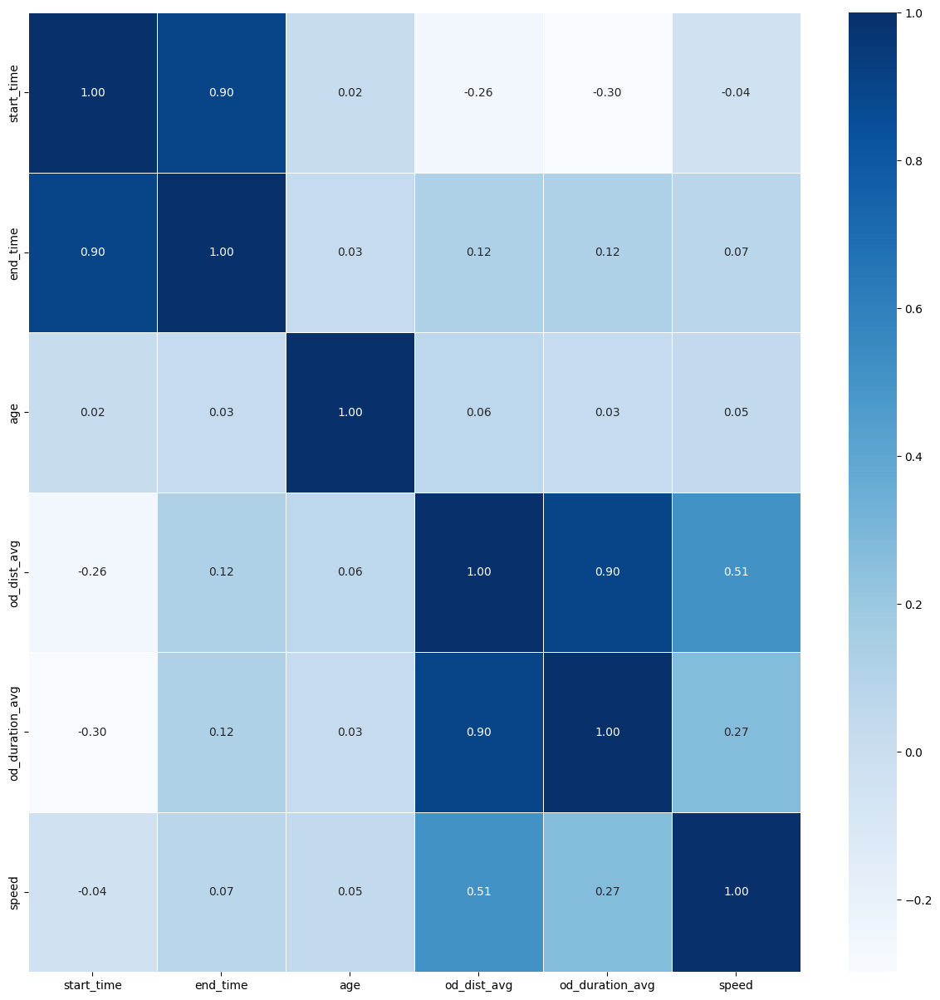

In [ ]:
num_features = ['start_time', 'end_time', 'age', 'od_dist_avg', 'od_duration_avg', 'speed']
# 수치형 변수만 사용
od_ga_home_num = od_ga_home[num_features]

plt.figure(figsize = (15, 15))
sns.heatmap(data = od_ga_home_num.corr(), annot = True, fmt = '.2f', linewidths = .5, cmap = 'Blues')


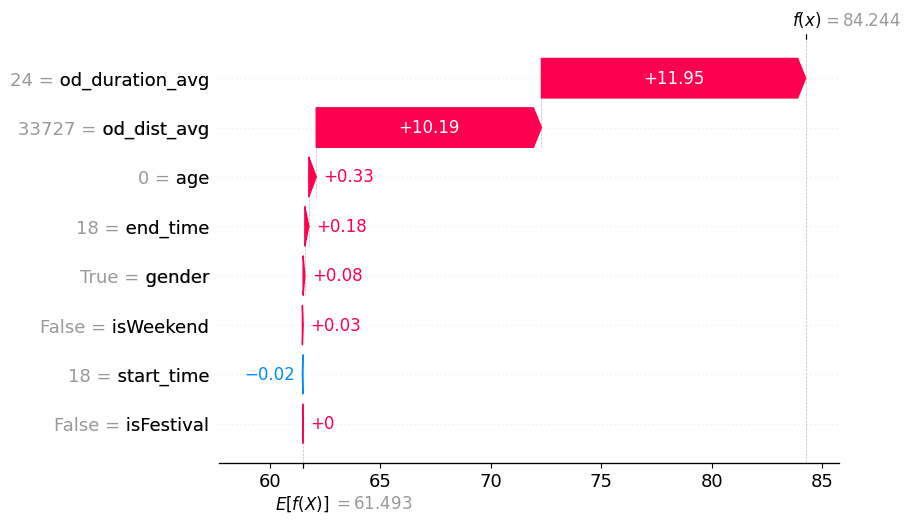

In [ ]:

import xgboost
import shap

X = od_ga_home.drop(columns = ['date', 'origin_hdong_cd', 'dest_hdong_cd', 'modal', 'origin_purpose', 'dest_purpose', 'od_cnts','speed'])
y = od_ga_home.speed

model = xgboost.XGBRegressor().fit(X, y)

explainer = shap.Explainer(model)
shape_values = explainer(X)

shap.plots.waterfall(shape_values[0])


In [ ]:
shap.initjs()
shap.plots.force(shape_values[0])

In [ ]:
model.feature_importances_

array([0.00570149, 0.00305682, 0.00160444, 0.00529444, 0.5365113 ,
       0.44264036, 0.00372651, 0.00146466], dtype=float32)

<Axes: title={'center': 'Feature Importance: gain'}, xlabel='F score', ylabel='Features'>

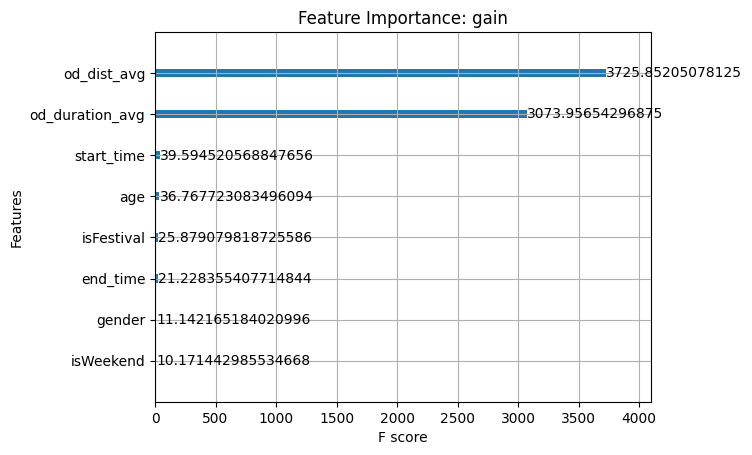

In [ ]:
xgboost.plot_importance(model, importance_type = 'gain', title = 'Feature Importance: gain')

In [ ]:
# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 1 week', width = 0.25)

layout = go.Layout(title = '[강릉 스피드 스케이트 경기장] (귀가) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0], layout = layout)
fig.show()

In [ ]:
od_gb = od[od.origin_hdong_cd == '5115058000'].compute()
od_gb_home = od_gb[(od_gb.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_gb.dest_purpose == '귀가')]
od_gb_home['speed'] = (od_gb_home.od_dist_avg * 60)/(od_gb_home.od_duration_avg * 1000)
od_gb_home.speed = od_gb_home.speed.round(2)

<ipython-input-144-a5d45baaca8f>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-144-a5d45baaca8f>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_gb_home.date = od_gb_home.date.astype('string')

<ipython-input-145-a88cee8ef241>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
unique_dates = od_gb_home.date.unique()

In [ ]:
# isFestival 추가
f_dates = ['20231012', '20231013', '20231014', '20231015']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
od_gb_home['isFestival'] = od_gb_home['date'].map(date_to_festival)

# isWeekend 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5

od_gb_home['isWeekend'] = od_gb_home['date'].map(date_to_weekend)

<ipython-input-147-46abee5ac5d5>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-147-46abee5ac5d5>:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:

# 데이터 타입 변경
od_gb_home.gender = od_gb_home.gender.astype('bool')
od_gb_home.modal = od_gb_home.modal.astype('category')
od_gb_home.origin_purpose = od_gb_home.origin_purpose.astype('category')
od_gb_home.dest_purspoe = od_gb_home.dest_purpose.astype('category')

<ipython-input-148-9d2f8170a93b>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-148-9d2f8170a93b>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-148-9d2f8170a93b>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-148-9d2

<Axes: >

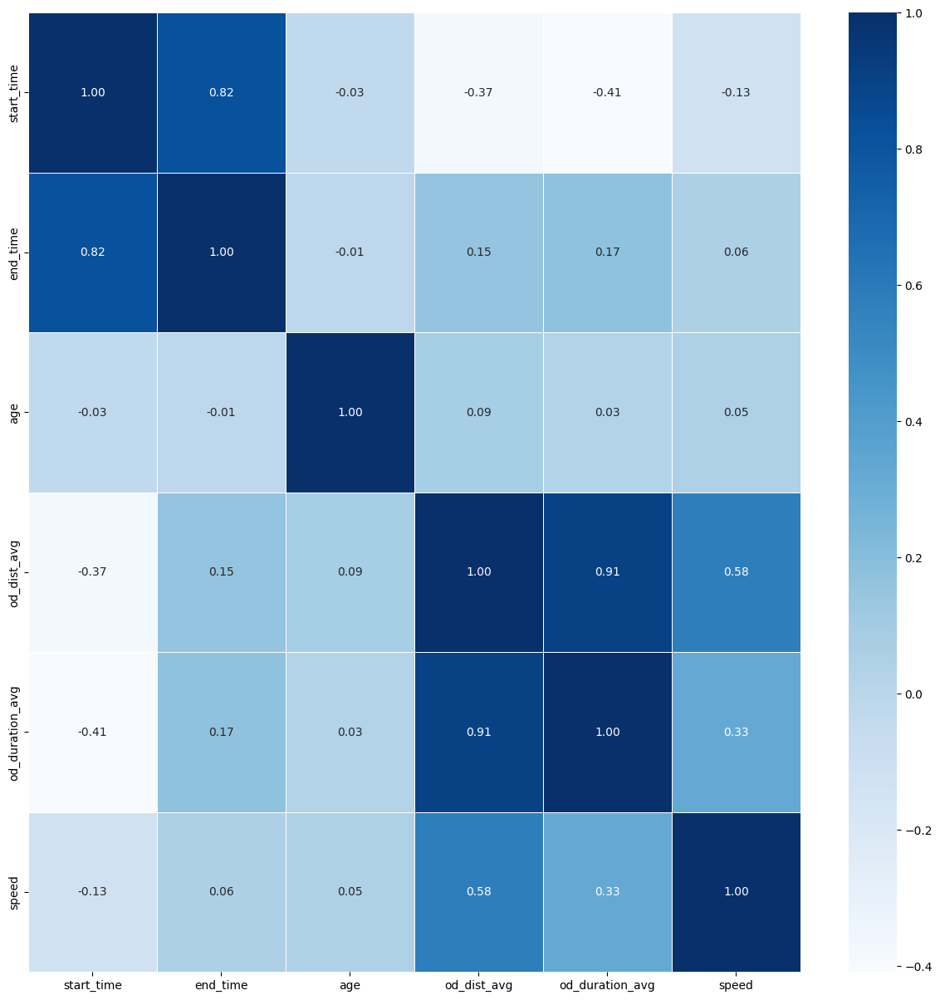

In [ ]:
num_features = ['start_time', 'end_time', 'age', 'od_dist_avg', 'od_duration_avg', 'speed']
# 수치형 변수만 사용
od_gb_home_num = od_gb_home[num_features]

plt.figure(figsize = (15, 15))
sns.heatmap(data = od_gb_home_num.corr(), annot = True, fmt = '.2f', linewidths = .5, cmap = 'Blues')


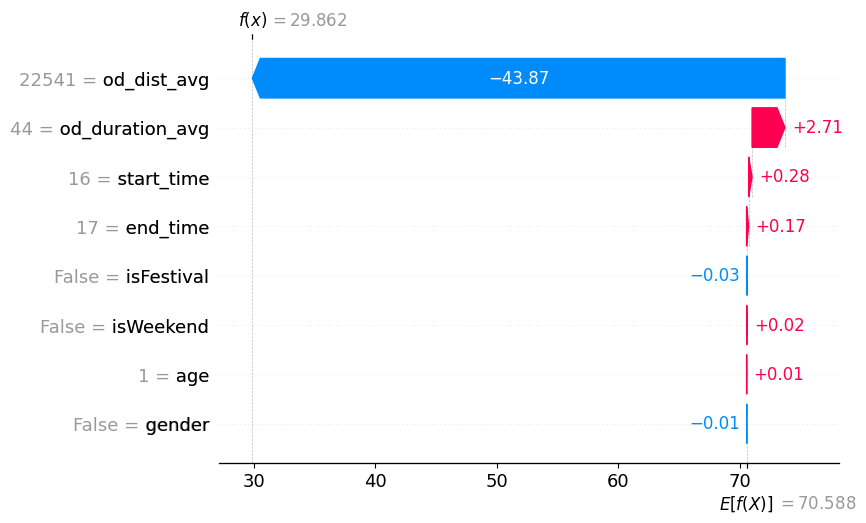

In [ ]:

import xgboost
import shap
# date는 category로 변경하기 애매함. 그래서 일단 제외
X = od_gb_home.drop(columns = ['date', 'origin_hdong_cd', 'dest_hdong_cd', 'modal', 'origin_purpose', 'dest_purpose', 'od_cnts','speed'])
y = od_gb_home.speed

model = xgboost.XGBRegressor().fit(X, y)

explainer = shap.Explainer(model)
shape_values = explainer(X)

shap.plots.waterfall(shape_values[0])



In [ ]:

shap.initjs()
shap.plots.force(shape_values[0])

<Axes: title={'center': 'Feature Importance: gain'}, xlabel='F score', ylabel='Features'>

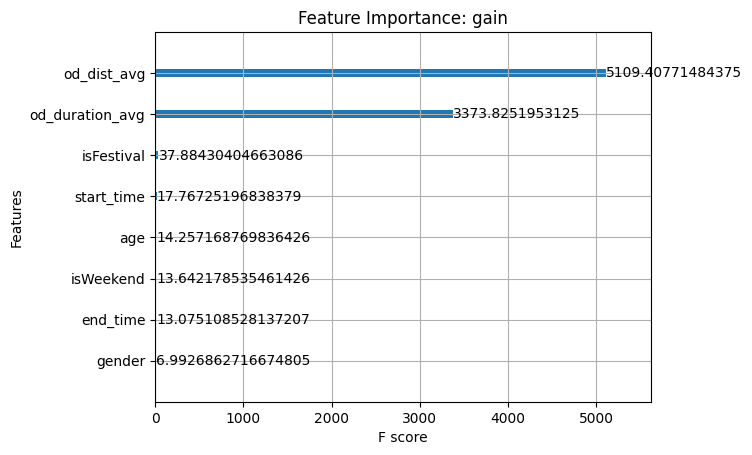

In [ ]:
xgboost.plot_importance(model, importance_type = 'gain', title = 'Feature Importance: gain')

In [ ]:
model.feature_importances_

array([0.00206912, 0.00152269, 0.00081435, 0.00166035, 0.59502697,
       0.392906  , 0.0044119 , 0.00158873], dtype=float32)

In [ ]:
od_home_1 = od_gb_home[(od_gb_home.date >= 20231012)&(od_gb_home.date <= 20231015)]
od_home_2 = od_gb_home[(od_gb_home.date >= 20231005)&(od_gb_home.date <= 20231008)]

In [ ]:
# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 1 week', width = 0.25)

layout = go.Layout(title = '[강릉 경포호수광장] (귀가) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0], layout = layout)
fig.show()

##### 귀가 데이터 + 방문 데이터

In [ ]:
# 귀가 데이터
od_ga_1 = od[(od.origin_hdong_cd == '5115057200')]
od_ga_1 = od_ga_1[(od_ga_1.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_ga_1.dest_purpose == '귀가')]
# 방문 데이터
od_ga_2 = od[(od.dest_hdong_cd == '5115057200')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]

od_d = dd.concat([od_ga_1, od_ga_2]).compute()


In [ ]:
od_d['speed'] = (od_d.od_dist_avg * 60)/(od_d.od_duration_avg * 1000)
od_d.speed = od_d.speed.round(2)

od_home_1 = od_d[(od_d.date >= 20231012)&(od_d.date <= 20231015)]
od_home_2 = od_d[(od_d.date >= 20231005)&(od_d.date <= 20231008)]


In [ ]:

# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 1 week', width = 0.25)
data_2 = go.Bar(x = df_3['modal'], y = df_3['speed'], name = 'after 1 week', width = 0.25)

layout = go.Layout(title = '[강릉 스피드 스케이팅 경기장] (귀가+방문) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0,], layout = layout)
fig.show()

In [ ]:
# 귀가 데이터
od_gb_1 = od[(od.origin_hdong_cd == '5115058000')]
od_gb_1 = od_gb_1[(od_gb_1.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(od_gb_1.dest_purpose == '귀가')]
# 방문 데이터
od_gb_2 = od[(od.dest_hdong_cd == '5115058000')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]

od_gb = dd.concat([od_gb_1, od_gb_2]).compute()

In [ ]:
od_gb['speed'] = (od_gb.od_dist_avg * 60)/(od_gb.od_duration_avg * 1000)
od_gb.speed = od_gb.speed.round(2)

od_home_1 = od_gb[(od_gb.date >= 20231012)&(od_gb.date <= 20231015)]
od_home_2 = od_gb[(od_gb.date >= 20231005)&(od_gb.date <= 20231008)]


In [ ]:
# 이동수단별 평균 속도
df_1 = od_home_1.groupby('modal').speed.mean().reset_index()
df_2 = od_home_2.groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_1['modal'], y = df_1['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_2['modal'], y = df_2['speed'], name = 'before 1 week', width = 0.25)

layout = go.Layout(title = '[강릉 경포호수광장] (귀가+방문) 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_1, data_0], layout = layout)
fig.show()

#### 날짜별 방문객 수

In [ ]:
od_g.date = od_g.date.astype('int')

In [ ]:
df = od_g.groupby(['date', 'dest_hdong_cd']).od_cnts.sum().reset_index()
df.date = df.date.apply(lambda x: pd.to_datetime(str(x), format = '%Y%m%d'))

fig = px.line(df, x = 'date', y = 'od_cnts', color = 'dest_hdong_cd', markers = True, title = '날짜별 방문객 수')
fig.add_vrect(x0="2023-10-12", x1="2023-10-15",
              annotation_text="축제기간", annotation_position="top left",
              annotation=dict(font_size=15),
              fillcolor="green", opacity=0.1, line_width=0)
fig.show()

#### 단일 변수 분포 확인

In [ ]:
# origin_hdong_cd
od_g_f.origin_hdong_cd.value_counts()

,count
origin_hdong_cd,
5.115066e+09,2077
5.115057e+09,1506
5.115059e+09,1081
5.115064e+09,975
5.115055e+09,919
...,...
4.113554e+09,1
4.380032e+09,1
4.182032e+09,1


In [ ]:
# dest_hdong_cd
od_g_f.dest_hdong_cd.value_counts()

,count
dest_hdong_cd,
스피드 스케이팅 경기장,9837
경포호수광장,2545


In [ ]:
od_g_f.date.value_counts()

,count
date,
20231014.0,3597
20231015.0,3297
20231013.0,2954
20231012.0,2534


In [ ]:
od_g_f.columns

Index(['origin_hdong_cd', 'dest_hdong_cd', 'date', 'start_time', 'end_time',
       'gender', 'age', 'modal', 'origin_purpose', 'dest_purpose',
       'od_dist_avg', 'od_duration_avg', 'od_cnts'],
      dtype='object')

In [ ]:
od_g_f.start_time.value_counts()

,count
start_time,
12:00,1117
13:00,1103
15:00,1024
11:00,1023
14:00,1018
16:00,989
17:00,946
08:00,898
10:00,885


In [ ]:
od_g_f.end_time.value_counts()

,count
end_time,
13:00,1089
16:00,1089
14:00,1081
15:00,1078
17:00,1059
12:00,1052
18:00,1031
11:00,900
19:00,735


In [ ]:
od_g_f.gender.value_counts()

,count
gender,
1.0,7857
0.0,4525


In [ ]:
od_g_f.groupby('gender').od_cnts.sum()

,od_cnts
gender,
0.0,38235.0
1.0,54189.0


In [ ]:
od_g_f.age.value_counts()

,count
age,
4.0,3718
3.0,2650
1.0,2527
2.0,1844
5.0,843
0.0,601
6.0,100
7.0,88
8.0,11


In [ ]:
od_g_f.modal.value_counts()

,count
modal,
차량,9434
시내버스,2121
기타,654
도보,151
철도,21
지하철,1


In [ ]:
od_g_f.origin_purpose.value_counts()

,count
origin_purpose,
귀가,4915
기타,2717
여행,2679
쇼핑여가,1019
업무,868
학업,182


In [ ]:
od_g_f.dest_purpose.value_counts()

,count
dest_purpose,
기타,3872
귀가,3696
여행,2919
쇼핑여가,1096
업무,649
학업,150


In [ ]:
od_g_f.od_dist_avg.describe()

,od_dist_avg
count,12382.000000
mean,50669.201341
std,97023.087352
min,224.000000
25%,7535.250000
50%,17952.000000
75%,42135.500000
max,980925.000000


In [ ]:
od_g_f.od_duration_avg.describe()

,od_duration_avg
count,12382.000000
mean,43.412292
std,51.623927
min,1.000000
25%,12.000000
50%,25.000000
75%,54.000000
max,461.000000


In [ ]:
od_g_f.od_cnts.describe()

,od_cnts
count,12382.000000
mean,7.464384
std,5.999339
min,5.000000
25%,5.000000
50%,5.000000
75%,7.000000
max,142.000000


#### 축제 방문객 분석

##### 어느 지역에서 많이 왔나? Top5

In [ ]:
od_g_f.origin_hdong_cd = od_g_f.origin_hdong_cd.astype('int').astype('string')
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby('origin_hdong_cd').od_cnts.sum().reset_index().sort_values(by = 'od_cnts', ascending = False).head()
fig = go.Figure(data = px.bar(x = df.origin_hdong_cd, y = df.od_cnts,title = '경포호수광장 방문객 출발지 Top 5'))
fig.update_xaxes(title_text = "출발지")
fig.update_yaxes(title_text = "방문객 수", tickformat = ',')
fig.show()

<ipython-input-69-5088bcbd5b7f>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_g_f.origin_hdong_cd = od_g_f.origin_hdong_cd.astype('int').astype('string')
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby('origin_hdong_cd').od_cnts.sum().reset_index().sort_values(by = 'od_cnts', ascending = False).head()
fig = go.Figure(data = px.bar(x = df.origin_hdong_cd, y = df.od_cnts,title = '스피드 스케이팅 경기장 방문객 출발지 Top 5'))
fig.update_xaxes(title_text = "출발지")
fig.update_yaxes(title_text = "방문객 수", tickformat = ',')
fig.show()

<ipython-input-70-1b67fa1f49ff>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 방문객 이동수단

In [ ]:
df = od_g_f.groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df, values = 'od_cnts', names = 'modal', title = '경포호수광장 방문객 이동수단')
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df, values = 'od_cnts', names = 'modal', title = '경포호수광장 방문객 이동수단')
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df, values = 'od_cnts', names = 'modal', title = '스피드 스케이팅 경기장 방문객 이동수단')
fig.show()

##### 지역 내/외 방문 비율 비교

In [ ]:
df_in = od_g_f[od_g_f.origin_hdong_cd.str[:2] == '51'].od_cnts.sum()
df_out = od_g_f[od_g_f.origin_hdong_cd.str[:2] != '51'].od_cnts.sum()

fig = px.pie(values = [df_in, df_out], names = ['지역 내 방문', '지역 외 방문'], title = '지역 내/외 방문')
fig.show()

In [ ]:
df_in = od_g_f[(od_g_f.dest_hdong_cd == '경포호수광장')&(od_g_f.origin_hdong_cd.str[:2] == '51')].od_cnts.sum()
df_out = od_g_f[(od_g_f.dest_hdong_cd == '경포호수광장')&(od_g_f.origin_hdong_cd.str[:2] != '51')].od_cnts.sum()

fig = px.pie(values = [df_in, df_out], names = ['지역 내 방문', '지역 외 방문'], title = '경포호수광장 지역 내/외 방문')
fig.show()

In [ ]:
df_in = od_g_f[(od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장')&(od_g_f.origin_hdong_cd.str[:2] == '51')].od_cnts.sum()
df_out = od_g_f[(od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장')&(od_g_f.origin_hdong_cd.str[:2] != '51')].od_cnts.sum()

fig = px.pie(values = [df_in, df_out], names = ['지역 내 방문', '지역 외 방문'], title = '스피드 스케이팅 경기장 지역 내/외 방문')
fig.show()

##### 지역 내 이동수단

In [ ]:
df_in = od_g_f[od_g_f.origin_hdong_cd.str[:2] == '51'].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_in, values = 'od_cnts', names = 'modal', title = '지역 내 방문 이동수단')
fig.show()

In [ ]:
df_in = od_g_f[(od_g_f.dest_hdong_cd == '경포호수광장') & (od_g_f.origin_hdong_cd.str[:2] == '51')].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_in, values = 'od_cnts', names = 'modal', title = '경포호수광장 지역 내 방문 이동수단')
fig.show()

In [ ]:
df_in = od_g_f[(od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장') & (od_g_f.origin_hdong_cd.str[:2] == '51')].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_in, values = 'od_cnts', names = 'modal', title = '스피드 스케이팅 경기장 지역 내 방문 이동수단')
fig.show()

##### 지역 외 이동수단

In [ ]:
df_out = od_g_f[(od_g_f.origin_hdong_cd.str[:2] != '51')].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_out, values = 'od_cnts', names = 'modal', title = '지역 외 방문 이동수단')
fig.show()

In [ ]:
df_out = od_g_f[(od_g_f.dest_hdong_cd == '경포호수광장')&(od_g_f.origin_hdong_cd.str[:2] != '51')].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_out, values = 'od_cnts', names = 'modal', title = '경포호수광장 지역 외 방문 이동수단')
fig.show()

In [ ]:
df_out = od_g_f[(od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장')&(od_g_f.origin_hdong_cd.str[:2] != '51')].groupby('modal').od_cnts.sum().reset_index()

fig = px.pie(data_frame = df_out, values = 'od_cnts', names = 'modal', title = '스피드 스케이팅 경기장 지역 외 방문 이동수단')
fig.show()

##### 성별, 나이대 구성 확인

In [ ]:
df = od_g_f.groupby(['gender', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]
data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '축제 방문객 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby(['gender', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]
data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '경포호수광장 축제 방문객 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby(['gender', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]
data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['od_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '스피드 스케이팅 경기장 축제 방문객 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

##### 나이대별 이동수단

In [ ]:
# 연령대별 이동수단
df = od_g_f.groupby(['modal', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.modal == '차량']
df_1 = df[df.modal == '시내버스']
df_2 = df[df.modal == '지하철']
df_3 = df[df.modal == '도보']
df_4 = df[df.modal == '기타']
df_5 = df[df.modal == '철도']
df_6 = df[df.modal == '시외고속버스']
df_7 = df[df.modal == '항공기']

data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '차량', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '시내버스', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '지하철', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '도보', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '철도', width = 0.3)
data_6 = go.Bar(x = df_6['age'], y = df_6['od_cnts'], name = '시외고속버스', width = 0.3)
data_7 = go.Bar(x = df_7['age'], y = df_7['od_cnts'], name = '항공기', width = 0.3)

layout = go.Layout(title = '연령대별 이동수단'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5, data_6, data_7], layout = layout)
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby(['modal', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.modal == '차량']
df_1 = df[df.modal == '시내버스']
df_2 = df[df.modal == '지하철']
df_3 = df[df.modal == '도보']
df_4 = df[df.modal == '기타']
df_5 = df[df.modal == '철도']
df_6 = df[df.modal == '시외고속버스']
df_7 = df[df.modal == '항공기']

data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '차량', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '시내버스', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '지하철', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '도보', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '철도', width = 0.3)
data_6 = go.Bar(x = df_6['age'], y = df_6['od_cnts'], name = '시외고속버스', width = 0.3)
data_7 = go.Bar(x = df_7['age'], y = df_7['od_cnts'], name = '항공기', width = 0.3)

layout = go.Layout(title = '경포호수광장 연령대별 이동수단'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5, data_6, data_7], layout = layout)
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby(['modal', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.modal == '차량']
df_1 = df[df.modal == '시내버스']
df_2 = df[df.modal == '지하철']
df_3 = df[df.modal == '도보']
df_4 = df[df.modal == '기타']
df_5 = df[df.modal == '철도']
df_6 = df[df.modal == '시외고속버스']
df_7 = df[df.modal == '항공기']

data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '차량', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '시내버스', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '지하철', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '도보', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '철도', width = 0.3)
data_6 = go.Bar(x = df_6['age'], y = df_6['od_cnts'], name = '시외고속버스', width = 0.3)
data_7 = go.Bar(x = df_7['age'], y = df_7['od_cnts'], name = '항공기', width = 0.3)

layout = go.Layout(title = '스피드 스케이팅 경기장 연령대별 이동수단'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5, data_6, data_7], layout = layout)
fig.show()

##### 도착시간에 따른 방문객

In [ ]:
od_g_f.loc[:, 'start_time'] = od_g_f.start_time.str[:2]
od_g_f.loc[:, 'end_time'] = od_g_f.end_time.str[:2]
df = od_g_f.groupby('end_time').od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = "od_cnts", title = "도착시간별 방문객 수")
fig.show()

In [ ]:
od_g_f.loc[:, 'start_time'] = od_g_f.start_time.str[:2]
od_g_f.loc[:, 'end_time'] = od_g_f.end_time.str[:2]
df = od_g_f.groupby(['end_time', 'dest_hdong_cd']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = "od_cnts", color = 'dest_hdong_cd', title = "도착시간별 방문객 수")
fig.show()

##### 나이대에 따른 도착시간

In [ ]:
df = od_g_f.groupby(['end_time', 'age']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'age', markers = True, title = '연령대별 도착시간')
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby(['end_time', 'age']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'age', markers = True, title = '경포호수광장 연령대별 도착시간')
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby(['end_time', 'age']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'age', markers = True, title = '스피드 스케이팅 경기장 연령대별 도착시간')
fig.show()

##### 이동수단에 따른 도착시간

In [ ]:
df = od_g_f.groupby(['end_time', 'modal']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'modal', markers = True, title = '이동수단별 도착시간')
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby(['end_time', 'modal']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'modal', markers = True, title = '경포호수광장 이동수단별 도착시간')
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby(['end_time', 'modal']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'modal', markers = True, title = '스피드 스케이팅 경기장 이동수단별 도착시간')
fig.show()

##### 출발 목적에 따른 도착시간

In [ ]:
df = od_g_f.groupby(['end_time', 'origin_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'origin_purpose', markers = True, title = '출발 목적별 도착시간')
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby(['end_time', 'origin_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'origin_purpose', markers = True, title = '경포호수광장 출발 목적별 도착시간')
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby(['end_time', 'origin_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'origin_purpose', markers = True, title = '스피드 스케이팅 경기장 출발 목적별 도착시간')
fig.show()

##### 도착 목적에 따른 도착시간

In [ ]:
df = od_g_f.groupby(['end_time', 'dest_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'dest_purpose', markers = True, title = '도착 목적별 도착시간')
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby(['end_time', 'dest_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'dest_purpose', markers = True, title = '경포호수광장 도착 목적별 도착시간')
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby(['end_time', 'dest_purpose']).od_cnts.sum().reset_index()

fig = px.line(df, x = 'end_time', y = 'od_cnts', color = 'dest_purpose', markers = True, title = '스피드 스케이팅 경기장 도착 목적별 도착시간')
fig.show()

##### 나이대별 출발 목적

In [ ]:
df = od_g_f.groupby(['origin_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.origin_purpose == '귀가']
df_1 = df[df.origin_purpose == '업무']
df_2 = df[df.origin_purpose == '학업']
df_3 = df[df.origin_purpose == '쇼핑여가']
df_4 = df[df.origin_purpose == '기타']
df_5 = df[df.origin_purpose == '여행']


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '연령대별 출발목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby(['origin_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.origin_purpose == '귀가']
df_1 = df[df.origin_purpose == '업무']
df_2 = df[df.origin_purpose == '학업']
df_3 = df[df.origin_purpose == '쇼핑여가']
df_4 = df[df.origin_purpose == '기타']
df_5 = df[df.origin_purpose == '여행']


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '경포호수광장 연령대별 출발목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()


In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby(['origin_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.origin_purpose == '귀가']
df_1 = df[df.origin_purpose == '업무']
df_2 = df[df.origin_purpose == '학업']
df_3 = df[df.origin_purpose == '쇼핑여가']
df_4 = df[df.origin_purpose == '기타']
df_5 = df[df.origin_purpose == '여행']


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '스피드 스케이팅 경기장 연령대별 출발목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()


##### 나이대별 도착목적

In [ ]:
df = od_g_f.groupby(['dest_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.dest_purpose == '귀가']
df_1 = df[df.dest_purpose == '업무']
df_2 = df[df.dest_purpose == '학업']
df_3 = df[df.dest_purpose == '쇼핑여가']
df_4 = df[df.dest_purpose == '기타']
df_5 = df[df.dest_purpose == '여행']


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '연령대별 도착목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()



In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby(['dest_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.dest_purpose == '귀가']
df_1 = df[df.dest_purpose == '업무']
df_2 = df[df.dest_purpose == '학업']
df_3 = df[df.dest_purpose == '쇼핑여가']
df_4 = df[df.dest_purpose == '기타']
df_5 = df[df.dest_purpose == '여행']


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '경포호수광장 연령대별 도착목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()



In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby(['dest_purpose', 'age']).od_cnts.sum().reset_index()

df_0 = df[df.dest_purpose == '귀가']
df_1 = df[df.dest_purpose == '업무']
df_2 = df[df.dest_purpose == '학업']
df_3 = df[df.dest_purpose == '쇼핑여가']
df_4 = df[df.dest_purpose == '기타']
df_5 = df[df.dest_purpose == '여행']


data_0 = go.Bar(x = df_0['age'], y = df_0['od_cnts'], name = '귀가', width = 0.3)
data_1 = go.Bar(x = df_1['age'], y = df_1['od_cnts'], name = '업무', width = 0.3)
data_2 = go.Bar(x = df_2['age'], y = df_2['od_cnts'], name = '학업', width = 0.3)
data_3 = go.Bar(x = df_3['age'], y = df_3['od_cnts'], name = '쇼핑여가', width = 0.3)
data_4 = go.Bar(x = df_4['age'], y = df_4['od_cnts'], name = '기타', width = 0.3)
data_5 = go.Bar(x = df_5['age'], y = df_5['od_cnts'], name = '여행', width = 0.3)


layout = go.Layout(title = '스피드 스케이팅 경기장 연령대별 도착목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.show()



##### 이동거리 - 이동시간

In [ ]:
px.scatter(data_frame = od_g_f, x = 'od_dist_avg', y = 'od_duration_avg', title = '이동거리-이동시간 분포')

##### 이동거리별 인원

In [ ]:
od_g_f.od_dist_avg = od_g_f.od_dist_avg.astype('int')
df = od_g_f.groupby('od_dist_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = df.od_dist_avg, y = df.od_cnts,title = '이동거리별 인원'))

fig.show()

<ipython-input-115-24434b7a91e4>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_g_f.od_dist_avg = od_g_f.od_dist_avg.astype('int')
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby('od_dist_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = df.od_dist_avg, y = df.od_cnts,title = '경포호수광장 이동거리별 인원'))

fig.show()

<ipython-input-116-9c3ffead6806>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_g_f.od_dist_avg = od_g_f.od_dist_avg.astype('int')
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby('od_dist_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = df.od_dist_avg, y = df.od_cnts,title = '스피드 스케이팅 경기장 이동거리별 인원'))

fig.show()

<ipython-input-117-465598ff22cd>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 이동시간별 인원

In [ ]:
od_g_f.od_duration_avg = od_g_f.od_duration_avg.astype('int')
df = od_g_f.groupby('od_duration_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = round(df.od_duration_avg/60, 1), y = df.od_cnts,title = '이동시간별 인원 (단위: 시간)'))

fig.show()

<ipython-input-118-33b4ddfe9b72>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_g_f.od_duration_avg = od_g_f.od_duration_avg.astype('int')
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby('od_duration_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = round(df.od_duration_avg/60, 1), y = df.od_cnts,title = '경포호수광장 이동시간별 인원 (단위: 시간)'))

fig.show()

<ipython-input-119-83c8c26ac50f>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od_g_f.od_duration_avg = od_g_f.od_duration_avg.astype('int')
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby('od_duration_avg').od_cnts.sum().reset_index()
fig = go.Figure(data = px.histogram(x = round(df.od_duration_avg/60, 1), y = df.od_cnts,title = '스피드 스케이팅 경기장 이동시간별 인원 (단위: 시간)'))

fig.show()

<ipython-input-120-bf090dd777c6>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 축제 피크타임

In [ ]:
df = od_g_f.groupby('end_time').od_cnts.sum().reset_index()

fig = px.density_heatmap(data_frame = df, x = 'end_time', y = 'od_cnts', nbinsy = 50)
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '경포호수광장'].groupby('end_time').od_cnts.sum().reset_index()

fig = px.density_heatmap(data_frame = df, x = 'end_time', y = 'od_cnts', nbinsy = 50)
fig.show()

In [ ]:
df = od_g_f[od_g_f.dest_hdong_cd == '스피드 스케이팅 경기장'].groupby('end_time').od_cnts.sum().reset_index()

fig = px.density_heatmap(data_frame = df, x = 'end_time', y = 'od_cnts', nbinsy = 50)
fig.show()

### 이동속도

In [ ]:
# (축제 방문 인원) 출발지: 상관없음, 도착지: 축제 지역 행정동, 출발 목적: 상관없음, 도착목적: 기타/쇼핑여가/여행
# (축제 귀가 인원) 출발지: 축제 지역 행정동, 도착지: 상관없음, 출발 목적: 기타/쇼핑여가/여행, 도착 목적: 귀가
od_ga_1 = od[(od.dest_hdong_cd == '5115057200')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_ga_2 = od[(od.origin_hdong_cd == '5115057200')&(od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_ga = dd.concat([od_ga_1, od_ga_2]).compute()

# 평균 이동속도 컬럼 추가
od_ga['speed'] = (od_ga.od_dist_avg * 60)/(od_ga.od_duration_avg * 1000)
od_ga.speed = od_ga.speed.round(2)

od_ga.date = od_ga.date.astype('string')

# 주말 여부 컬럼 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5
od_ga['isWeekend'] = od_ga['date'].map(date_to_weekend)

od_ga.date = od_ga.date.astype('int')

# 시각화를 위한 데이터 준비
df_od_speed_modal = od_ga.groupby(['isWeekend', 'modal']).speed.mean().reset_index()
df_od_speed_modal_2 = od_ga[(od_ga.date >= 20231012) & (od_ga.date <= 20231015)].groupby(['isWeekend', 'modal']).speed.mean().reset_index()

In [ ]:
df_weekday = df_od_speed_modal[df_od_speed_modal.isWeekend == False]
df_weekend = df_od_speed_modal[df_od_speed_modal.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[강릉 스피드스케이팅 경기장] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df_weekday = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == False]
df_weekend = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[강릉 스피드스케이팅 경기장] 축제 기간 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
# (축제 방문 인원) 출발지: 상관없음, 도착지: 축제 지역 행정동, 출발 목적: 상관없음, 도착목적: 기타/쇼핑여가/여행
# (축제 귀가 인원) 출발지: 축제 지역 행정동, 도착지: 상관없음, 출발 목적: 기타/쇼핑여가/여행, 도착 목적: 귀가
od_gb_1 = od[(od.dest_hdong_cd == '5115058000')&(od.dest_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_gb_2 = od[(od.origin_hdong_cd == '5115058000')&(od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))]
od_gb = dd.concat([od_gb_1, od_gb_2]).compute()

# 평균 이동속도 컬럼 추가
od_gb['speed'] = (od_gb.od_dist_avg * 60)/(od_gb.od_duration_avg * 1000)
od_gb.speed = od_gb.speed.round(2)

od_gb.date = od_gb.date.astype('string')

# 주말 여부 컬럼 추가
date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5
od_gb['isWeekend'] = od_gb['date'].map(date_to_weekend)

od_gb.date = od_gb.date.astype('int')

# 시각화를 위한 데이터 준비
df_od_speed_modal = od_gb.groupby(['isWeekend', 'modal']).speed.mean().reset_index()
df_od_speed_modal_2 = od_gb[(od_gb.date >= 20231012) & (od_gb.date <= 20231015)].groupby(['isWeekend', 'modal']).speed.mean().reset_index()

In [ ]:
df_weekday = df_od_speed_modal[df_od_speed_modal.isWeekend == False]
df_weekend = df_od_speed_modal[df_od_speed_modal.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[강릉 경포호수광장] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df_weekday = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == False]
df_weekend = df_od_speed_modal_2[df_od_speed_modal_2.isWeekend == True]

data_0 = go.Bar(x = df_weekday['modal'], y = df_weekday['speed'], name = 'weekday', width = 0.25)
data_1 = go.Bar(x = df_weekend['modal'], y = df_weekend['speed'], name = 'weekend', width = 0.25)


layout = go.Layout(title = '[강릉 경포호수광장] 축제 기간 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

#### 귀가-이동속도

In [ ]:
# 강릉 스피드 스케이팅 경기장
df_od = od[(od.origin_hdong_cd == '5115057200')].compute()
df_od_home = df_od[(df_od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(df_od.dest_purpose == '귀가')]
df_od_home
df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
df_od_home.speed = df_od_home.speed.round(2)
df_od_home.head()

<ipython-input-50-01cab6c6485d>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-50-01cab6c6485d>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
5575,5115057200,5115064500,20230901,18,18,1,0,시내버스,기타,귀가,33727.0,24.0,14.0,84.32
58526,5115057200,5115059000,20230901,17,18,0,0,기타,쇼핑여가,귀가,8065.0,45.0,16.0,10.75
124434,5115057200,5115055000,20230901,11,12,0,0,차량,쇼핑여가,귀가,4106.0,22.0,21.0,11.20
179091,5115057200,5115058000,20230901,16,16,0,0,차량,기타,귀가,8096.0,5.0,24.0,97.15
324124,5115057200,5119052500,20230901,18,19,0,3,차량,쇼핑여가,귀가,308767.0,108.0,6.0,171.54


In [ ]:
df_od_home.groupby(['dest_hdong_cd']).od_cnts.sum().reset_index().sort_values('od_cnts', ascending = False)

,dest_hdong_cd,od_cnts
251,5115055000,4342.0
258,5115064500,4274.0
256,5115060000,2326.0
255,5115059000,1932.0
254,5115058000,1288.0
...,...,...
139,4128755000,5.0
208,4427025300,5.0
140,4128756000,5.0
206,4377037000,5.0


In [ ]:
# 이동수단별 평균 이동속도 비교
df = df_od_home.groupby('modal').speed.mean().reset_index()

bar = go.Bar(x = df.modal, y=df.speed, name = '이동속도', width = 0.3)
layout = go.Layout(title = '[강릉 스피드 스케이팅 경기장] 귀가 이동수단별 평균 이동 속도 비교'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [bar], layout = layout)
fig.update_layout(yaxis_tickformat = ',')
fig.show()


In [ ]:
df_od_home.groupby('modal').od_cnts.sum().reset_index()

,modal,od_cnts
0,기타,557.0
1,도보,147.0
2,시내버스,4530.0
3,차량,19510.0
4,철도,80.0


In [ ]:
df_od_home[(df_od_home.date >= 20231012)&(df_od_home.date <= 20231015)]

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
375263,5115057200,5115059000,20231012,15,15,1,0,차량,기타,귀가,12086.0,11.0,10.0,65.92
447715,5115057200,5115055000,20231012,16,16,1,0,차량,기타,귀가,2344.0,28.0,15.0,5.02
551170,5115057200,5115060000,20231012,14,15,0,2,차량,기타,귀가,27032.0,61.0,6.0,26.59
569485,5115057200,5115058000,20231012,17,18,0,3,차량,쇼핑여가,귀가,61430.0,61.0,5.0,60.42
589304,5115057200,5115064500,20231012,12,12,1,3,차량,기타,귀가,6963.0,11.0,5.0,37.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
585189,5115057200,5115059000,20231015,10,10,1,5,차량,쇼핑여가,귀가,3692.0,9.0,5.0,24.61
650269,5115057200,5115055000,20231015,18,19,1,1,차량,쇼핑여가,귀가,53824.0,46.0,5.0,70.21
668901,5115057200,5115055000,20231015,19,19,1,1,시내버스,기타,귀가,24002.0,14.0,5.0,102.87
680510,5115057200,5115059000,20231015,12,13,1,1,차량,기타,귀가,23789.0,40.0,5.0,35.68


In [ ]:
df_od_home.date = df_od_home.date.astype('string')
unique_dates = df_od_home.date.unique()

<ipython-input-58-ea5bea98a3ac>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# 주말 여부 추가

date_to_weekend = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  date_to_weekend[date] = date_obj.weekday() >= 5

df_od_home['isWeekend'] = df_od_home['date'].map(date_to_weekend)

<ipython-input-59-7a4f8393ffac>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
od.date = od.date.astype('string')

In [ ]:
unique_dates = od.date.unique().compute()

In [ ]:
unique_dates

,date
0,20230901
1,20230902
2,20230903
3,20230904
4,20230905
5,20230906
6,20230907
7,20230908
8,20230909
9,20230910


In [ ]:
f_dates = ['20231012', '20231013', '20231014', '20231015']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
df_od_home['isFestival'] = df_od_home['date'].map(date_to_festival)

<ipython-input-64-7530913b12ce>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df = df_od_home.groupby(['end_time', 'isFestival']).speed.mean().reset_index()

fig = px.line(df, x = 'end_time', y = 'speed', color = 'isFestival', markers = True, title = '시간별 이동속도')
fig.show()

In [ ]:
df_od_home

,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed,isWeekend,isFestival
5575,5115057200,5115064500,20230901,18,18,1,0,시내버스,기타,귀가,33727.0,24.0,14.0,84.32,False,False
58526,5115057200,5115059000,20230901,17,18,0,0,기타,쇼핑여가,귀가,8065.0,45.0,16.0,10.75,False,False
124434,5115057200,5115055000,20230901,11,12,0,0,차량,쇼핑여가,귀가,4106.0,22.0,21.0,11.20,False,False
179091,5115057200,5115058000,20230901,16,16,0,0,차량,기타,귀가,8096.0,5.0,24.0,97.15,False,False
324124,5115057200,5119052500,20230901,18,19,0,3,차량,쇼핑여가,귀가,308767.0,108.0,6.0,171.54,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
585189,5115057200,5115059000,20231015,10,10,1,5,차량,쇼핑여가,귀가,3692.0,9.0,5.0,24.61,True,True
650269,5115057200,5115055000,20231015,18,19,1,1,차량,쇼핑여가,귀가,53824.0,46.0,5.0,70.21,True,True
668901,5115057200,5115055000,20231015,19,19,1,1,시내버스,기타,귀가,24002.0,14.0,5.0,102.87,True,True
680510,5115057200,5115059000,20231015,12,13,1,1,차량,기타,귀가,23789.0,40.0,5.0,35.68,True,True


In [ ]:
df_f = df_od_home[df_od_home.isFestival == True].groupby('modal').speed.mean().reset_index()
df_nf = df_od_home[df_od_home.isFestival == False].groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_f['modal'], y = df_f['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_nf['modal'], y = df_nf['speed'], name = 'non-festival', width = 0.25)


layout = go.Layout(title = '[강릉 스피드 스케이팅 경기장] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
pd.cut(df_od.od_dist_avg, bins = 5).value_counts()

,count
od_dist_avg,
"(-828.361, 199239.2]",32049
"(199239.2, 398311.4]",1825
"(398311.4, 597383.6]",845
"(597383.6, 796455.8]",256
"(796455.8, 995528.0]",73


In [ ]:
pd.cut(df_od.od_dist_avg, bins = [df_od.od_dist_avg.quantile(q=0.2),
                                  df_od.od_dist_avg.quantile(q=0.4),
                                  df_od.od_dist_avg.quantile(q=0.6),
                                  df_od.od_dist_avg.quantile(q=0.8)]).value_counts()

,count
od_dist_avg,
"(19778.8, 37699.8]",7010
"(8651.4, 19778.8]",7009
"(37699.8, 83358.6]",7009


In [ ]:
# 강릉 경포호수광장
df_od = od[(od.origin_hdong_cd == '5115058000')].compute()
df_od_home = df_od[(df_od.origin_purpose.isin(['기타', '쇼핑여가', '여행']))&(df_od.dest_purpose == '귀가')]
df_od_home
df_od_home['speed'] = (df_od_home.od_dist_avg * 60)/(df_od_home.od_duration_avg * 1000)
df_od_home.speed = df_od_home.speed.round(2)
df_od_home.head()

<ipython-input-100-6b57f369724b>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-100-6b57f369724b>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,origin_hdong_cd,dest_hdong_cd,date,start_time,end_time,gender,age,modal,origin_purpose,dest_purpose,od_dist_avg,od_duration_avg,od_cnts,speed
148421,5115058000,5115064500,20230901,16,17,0,1,시내버스,기타,귀가,22541.0,44.0,10.0,30.74
224977,5115058000,5115064500,20230901,16,16,0,1,차량,기타,귀가,28168.0,22.0,14.0,76.82
278657,5115058000,5115066500,20230901,13,13,0,2,차량,기타,귀가,10765.0,11.0,9.0,58.72
318902,5115058000,5115057200,20230901,14,14,0,2,시내버스,기타,귀가,11094.0,11.0,5.0,60.51
325407,5115058000,5115057200,20230901,15,15,1,7,차량,기타,귀가,5803.0,10.0,5.0,34.82


In [ ]:
f_dates = ['20231012', '20231013', '20231014', '20231015']

date_to_festival = {}
for date in unique_dates:
  date_obj = datetime.strptime(date, '%Y%m%d')
  if date in f_dates:
    date_to_festival[date] = True
  else:
    date_to_festival[date] = False
df_od_home['isFestival'] = df_od_home['date'].map(date_to_festival)


<ipython-input-101-7530913b12ce>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:

# 시간별 이동속도
df = df_od_home.groupby(['end_time', 'isFestival']).speed.mean().reset_index()

fig = px.line(df, x = 'end_time', y = 'speed', color = 'isFestival', markers = True, title = '시간별 이동속도')
fig.show()



In [ ]:
# 이동수단별 평균 속도
df_f = df_od_home[df_od_home.isFestival == True].groupby('modal').speed.mean().reset_index()
df_nf = df_od_home[df_od_home.isFestival == False].groupby('modal').speed.mean().reset_index()

data_0 = go.Bar(x = df_f['modal'], y = df_f['speed'], name = 'festival', width = 0.25)
data_1 = go.Bar(x = df_nf['modal'], y = df_nf['speed'], name = 'non-festival', width = 0.25)


layout = go.Layout(title = '[강릉 경포호수광장] 이동수단별 평균 속도'
                  , xaxis_title = 'modal'
                  , yaxis_title = 'speed')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.show()

In [ ]:
df_od_home.groupby(['dest_hdong_cd']).od_cnts.sum().reset_index().sort_values('od_cnts', ascending = False)

,dest_hdong_cd,od_cnts
616,5115064500,4609.0
609,5115055000,3470.0
612,5115057200,3339.0
614,5115060000,2574.0
613,5115059000,1383.0
...,...,...
287,4113553000,5.0
390,4139059400,5.0
453,4161037000,5.0
175,2817768000,5.0


In [ ]:
# 이동수단별 평균 이동속도 비교
df = df_od_home.groupby('modal').speed.mean().reset_index()

bar = go.Bar(x = df.modal, y=df.speed, name = '이동속도', width = 0.3)
layout = go.Layout(title = '[강릉 경포호수광장] 귀가 이동수단별 평균 이동 속도 비교'
                  , xaxis_title = 'modal'
                  , yaxis_title = '이동속도')

fig = go.Figure(data = [bar], layout = layout)
fig.update_layout(yaxis_tickformat = ',')
fig.show()

In [ ]:
df_od_home.groupby(['modal']).od_cnts.sum().reset_index()

,modal,od_cnts
0,기타,407.0
1,도보,152.0
2,시내버스,5002.0
3,지하철,43.0
4,차량,28425.0
5,철도,298.0


### stay

In [ ]:
stay_g = stay[(stay.hdong_cd == 5115057200)|(stay.hdong_cd == 5115058000)].compute()
stay_g_f = stay_g[(stay_g.date >= 20231012)&(stay_g.date <= 20231015)]

In [ ]:
stay_g_f.head()

,hdong_cd,date,time,gender,age,purpose,stay_cnts
166308,5.115058e+09,20231012.0,13:00,0.0,1.0,4.0,889.0
172383,5.115057e+09,20231012.0,13:00,1.0,5.0,0.0,646.0
184072,5.115057e+09,20231012.0,20:00,0.0,4.0,0.0,719.0
189703,5.115057e+09,20231012.0,19:00,0.0,5.0,0.0,761.0
195324,5.115057e+09,20231012.0,20:00,0.0,5.0,0.0,804.0


In [ ]:
hdong_name = {5115057200: '스피드 스케이팅 경기장',
              5115058000: '경포호수광장'}
stay_g.hdong_cd = stay_g.hdong_cd.map(hdong_name)
stay_g_f.hdong_cd = stay_g_f.hdong_cd.map(hdong_name)

<ipython-input-125-459968225308>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
stay_g_f.date = stay_g_f.date.astype("int")

<ipython-input-12-e0d9d40f9fb6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stay_g_f.date = stay_g_f.date.astype("int")


In [ ]:
stay_g_f.date = stay_g_f['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

<ipython-input-13-765d22215769>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stay_g_f.date = stay_g_f['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))


#### 단일 변수 분포 확인

In [ ]:
stay_g.hdong_cd.value_counts()

,count
hdong_cd,
스피드 스케이팅 경기장,53567
경포호수광장,49628


In [ ]:
stay_g.date = stay_g.date.astype('int')

In [ ]:
df = stay_g.groupby('date').stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = px.line(df, x = 'date', y = 'stay_cnts', title = '(전체) 날짜별 체류인구', markers = True)
fig.update_yaxes(tickformat=',')
fig.update_xaxes(nticks=50)
fig.show()


In [ ]:
stay_g.time.value_counts()

,count
time,
13:00,7133
12:00,7086
14:00,7080
15:00,7054
16:00,6969
11:00,6915
17:00,6819
18:00,6717
10:00,6643


In [ ]:
stay_g.gender.value_counts()

,count
gender,
1.0,51926
0.0,51269


In [ ]:
stay_g.age.value_counts()

,count
age,
4.0,13424
2.0,13409
5.0,13389
3.0,13054
6.0,12594
1.0,11899
7.0,10692
0.0,8322
8.0,6412


In [ ]:
stay_g.purpose.value_counts()

,count
purpose,
귀가,25900
기타,23982
여행,22840
업무,16179
쇼핑여가,11723
학업,2571


In [ ]:
stay_g.stay_cnts.describe()

,stay_cnts
count,103195.000000
mean,134.443665
std,182.837941
min,5.000000
25%,24.000000
50%,65.000000
75%,154.000000
max,1310.000000


#### 체류 인구 분석

##### 날짜별 체류인구

In [ ]:
stay_g_f.date = stay_g_f.date.astype('int')

<ipython-input-134-8c9fba32f90b>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df =stay_g_f.groupby(['date']).stay_cnts.sum().reset_index()
df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

fig = go.Figure(data = px.line(x = df.date , y = df.stay_cnts,title = '날짜별 체류인구', markers = True))
fig.update_xaxes(title_text = "date")
fig.update_yaxes(title_text = "stay_cnts")
fig.update_yaxes(tickformat=',')
fig.show()

##### 날짜별 시간별 체류인구

In [ ]:
df = stay_g_f.groupby(['date', 'time']).stay_cnts.sum().reset_index()

fig = px.line(df, x = 'time', y = 'stay_cnts', color = 'date', markers = True, title = '날짜별 시간별 체류인구')
fig.show()


In [ ]:
df = stay_g_f[stay_g_f.hdong_cd == '경포호수광장'].groupby(['date', 'time']).stay_cnts.sum().reset_index()

fig = px.line(df, x = 'time', y = 'stay_cnts', color = 'date', markers = True, title = '경포호수광장 날짜별 시간별 체류인구')
fig.show()


In [ ]:
df = stay_g_f[stay_g_f.hdong_cd == '스피드 스케이팅 경기장'].groupby(['date', 'time']).stay_cnts.sum().reset_index()

fig = px.line(df, x = 'time', y = 'stay_cnts', color = 'date', markers = True, title = '스피드 스케이팅 경기장 날짜별 시간별 체류인구')
fig.show()


##### 성별, 연령대 구성 확인

In [ ]:
df = stay_g_f.groupby(['gender', 'age']).stay_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['stay_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '체류인구 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


In [ ]:
stay_g_f.head()

,hdong_cd,date,time,gender,age,purpose,stay_cnts
166308,경포호수광장,20231012,13:00,0.0,1.0,기타,889.0
172383,스피드 스케이팅 경기장,20231012,13:00,1.0,5.0,귀가,646.0
184072,스피드 스케이팅 경기장,20231012,20:00,0.0,4.0,귀가,719.0
189703,스피드 스케이팅 경기장,20231012,19:00,0.0,5.0,귀가,761.0
195324,스피드 스케이팅 경기장,20231012,20:00,0.0,5.0,귀가,804.0


In [ ]:
df = stay_g_f[stay_g_f.hdong_cd == '경포호수광장'].groupby(['gender', 'age']).stay_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['stay_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '경포호수광장 체류인구 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()

In [ ]:
df = stay_g_f[stay_g_f.hdong_cd == '스피드 스케이팅 경기장'].groupby(['gender', 'age']).stay_cnts.sum().reset_index()

df_0 = df[df.gender == 0]
df_1 = df[df.gender == 1]

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = 'male', width = 0.3)
data_1 = go.Bar(x = df_0['age'], y = df_1['stay_cnts'], name = 'female', width = 0.3)

layout = go.Layout(title = '스피드 스케이팅 경기장 체류인구 성별, 연령대 분포'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()

##### 체류 목적

In [ ]:
df = stay_g_f.groupby(['date', 'purpose']).stay_cnts.sum().reset_index()
# df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

df_0 = df[df.purpose == '귀가']
df_1 = df[df.purpose == '업무']
df_2 = df[df.purpose == '학업']
df_3 = df[df.purpose == '쇼핑여가']
df_4 = df[df.purpose == '기타']
df_5 = df[df.purpose == '여행']

data_0 = go.Bar(x = df_0['date'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['date'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['date'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['date'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['date'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['date'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '날짜별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'date'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()

In [ ]:
df = stay_g_f[stay_g_f.hdong_cd == '경포호수광장'].groupby(['date', 'purpose']).stay_cnts.sum().reset_index()
# df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

df_0 = df[df.purpose == '귀가']
df_1 = df[df.purpose == '업무']
df_2 = df[df.purpose == '학업']
df_3 = df[df.purpose == '쇼핑여가']
df_4 = df[df.purpose == '기타']
df_5 = df[df.purpose == '여행']

data_0 = go.Bar(x = df_0['date'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['date'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['date'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['date'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['date'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['date'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '경포호수광장 날짜별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'date'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()

In [ ]:
df = stay_g_f[stay_g_f.hdong_cd == '스피드 스케이팅 경기장'].groupby(['date', 'purpose']).stay_cnts.sum().reset_index()
# df.date =  df['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

df_0 = df[df.purpose == '귀가']
df_1 = df[df.purpose == '업무']
df_2 = df[df.purpose == '학업']
df_3 = df[df.purpose == '쇼핑여가']
df_4 = df[df.purpose == '기타']
df_5 = df[df.purpose == '여행']

data_0 = go.Bar(x = df_0['date'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['date'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['date'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['date'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['date'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['date'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '스피드 스케이팅 경기장 날짜별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'date'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()

##### 시간별 체류 목적

In [ ]:
df = stay_g_f.groupby(['time', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == '귀가']
df_1 = df[df.purpose == '업무']
df_2 = df[df.purpose == '학업']
df_3 = df[df.purpose == '쇼핑여가']
df_4 = df[df.purpose == '기타']
df_5 = df[df.purpose == '여행']

data_0 = go.Bar(x = df_0['time'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['time'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['time'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['time'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['time'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['time'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '시간별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'time'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


In [ ]:
df = stay_g_f[stay_g_f.hdong_cd == '경포호수광장'].groupby(['time', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == '귀가']
df_1 = df[df.purpose == '업무']
df_2 = df[df.purpose == '학업']
df_3 = df[df.purpose == '쇼핑여가']
df_4 = df[df.purpose == '기타']
df_5 = df[df.purpose == '여행']

data_0 = go.Bar(x = df_0['time'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['time'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['time'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['time'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['time'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['time'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '경포호수광장 시간별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'time'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


In [ ]:
df = stay_g_f[stay_g_f.hdong_cd == '스피드 스케이팅 경기장'].groupby(['time', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == '귀가']
df_1 = df[df.purpose == '업무']
df_2 = df[df.purpose == '학업']
df_3 = df[df.purpose == '쇼핑여가']
df_4 = df[df.purpose == '기타']
df_5 = df[df.purpose == '여행']

data_0 = go.Bar(x = df_0['time'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['time'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['time'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['time'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['time'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['time'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '스피드 스케이팅 경기장 시간별 체류목적'
                  , barmode = 'stack'
                  , xaxis_title = 'time'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


##### 연령대별 체류 목적

In [ ]:
df = stay_g_f.groupby(['age', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == '귀가']
df_1 = df[df.purpose == '업무']
df_2 = df[df.purpose == '학업']
df_3 = df[df.purpose == '쇼핑여가']
df_4 = df[df.purpose == '기타']
df_5 = df[df.purpose == '여행']

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['age'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['age'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['age'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['age'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['age'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '연령대별 체류 목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


In [ ]:
df = stay_g_f[stay_g_f.hdong_cd == '경포호수광장'].groupby(['age', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == '귀가']
df_1 = df[df.purpose == '업무']
df_2 = df[df.purpose == '학업']
df_3 = df[df.purpose == '쇼핑여가']
df_4 = df[df.purpose == '기타']
df_5 = df[df.purpose == '여행']

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['age'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['age'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['age'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['age'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['age'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '경포호수광장 연령대별 체류 목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()


In [ ]:
df = stay_g_f[stay_g_f.hdong_cd == '스피드 스케이팅 경기장'].groupby(['age', 'purpose']).stay_cnts.sum().reset_index()

df_0 = df[df.purpose == '귀가']
df_1 = df[df.purpose == '업무']
df_2 = df[df.purpose == '학업']
df_3 = df[df.purpose == '쇼핑여가']
df_4 = df[df.purpose == '기타']
df_5 = df[df.purpose == '여행']

data_0 = go.Bar(x = df_0['age'], y = df_0['stay_cnts'], name = '귀가')
data_1 = go.Bar(x = df_1['age'], y = df_1['stay_cnts'], name = '업무')
data_2 = go.Bar(x = df_2['age'], y = df_2['stay_cnts'], name = '학업')
data_3 = go.Bar(x = df_3['age'], y = df_3['stay_cnts'], name = '쇼핑여가')
data_4 = go.Bar(x = df_4['age'], y = df_4['stay_cnts'], name = '기타')
data_5 = go.Bar(x = df_5['age'], y = df_5['stay_cnts'], name = '여행')

layout = go.Layout(title = '스피드 스케이팅 경기장 연령대별 체류 목적'
                  , barmode = 'stack'
                  , xaxis_title = 'age'
                  , yaxis_title = 'cnt')

fig = go.Figure(data = [data_0, data_1, data_2, data_3, data_4, data_5], layout = layout)
fig.update_yaxes(tickformat=',')
fig.show()
